# Analysis of Seattle Airbnb Dataset


In [ ]:
import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

In [ ]:
 # Downloading required packages here.
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('vader_lexicon')
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')
nltk.download('words')
!pip install vaderSentiment
!pip install contractions
!pip install squarify
!pip install Pillow
!pip install geopy
!pip install langdetect
!pip install tensorflow

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [ ]:
# Importing all the necessary packages here.

import pandas as pd
import seaborn as sns
import numpy as np
import folium
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from folium.plugins import MarkerCluster
from nltk.corpus import stopwords
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from sklearn.cluster import KMeans
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
import geopy.distance
from folium.plugins import HeatMap
from PIL import Image
import contractions
import string
from langdetect import detect
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from wordcloud import WordCloud, STOPWORDS
import re
from nltk.tokenize import word_tokenize
import squarify
from collections import Counter

# Pre-processing the Datasets

In [ ]:
# Loading the Airbnb listings dataset file here.

listings = pd.read_csv('listings.csv')
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,2.020000e+13,1/4/16,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,2.020000e+13,1/4/16,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,2.020000e+13,1/4/16,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,2.020000e+13,1/4/16,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,2.020000e+13,1/4/16,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [ ]:
# Displaying the type and dimensions of the listings dataset here.

print("Data type : ", type(listings))
print("Data dimensions : ", listings.shape)
listings.columns

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dimensions :  (3818, 92)


Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

In [ ]:
# Dropped some unnecessary columns here.

listings = listings[['id','name','summary','longitude','latitude','space','description','instant_bookable','neighborhood_overview','neighbourhood_cleansed','host_id','host_name','host_since','calculated_host_listings_count','host_response_time','street', 'zipcode','smart_location','review_scores_rating','property_type','room_type','accommodates','bathrooms','bedrooms','beds','reviews_per_month','monthly_price','weekly_price','amenities','cancellation_policy','number_of_reviews','review_scores_rating','review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication','review_scores_location', 'review_scores_value','price']]

In [ ]:
# Replacing all missing data with zeros here.

listings.fillna(0, inplace=True)

# This column values were f and y, so performing encoding here.

label_encoder = LabelEncoder()
listings['instant_bookable'] = label_encoder.fit_transform(listings['instant_bookable'])
# Replace 0 with "Not Mentioned" in the property_type column
listings.loc[listings['property_type'] == 0, 'property_type'] = 'Not Mentioned'

# One-hot encoding for all columns with categorical data is done here.

boolean_columns = listings.select_dtypes(include='bool').columns
for col in boolean_columns:
    listings[col] = listings[col].astype(int)

# Extracting monthly_price and price columns from listings dataset here.

price_arr = listings['price']
monthly_price_arr = listings['monthly_price']
weekly_price_arr = listings['weekly_price']

# Removing non-numerical($) symbols here.
clean_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in price_arr]
clean_monthly_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in monthly_price_arr]
clean_weekly_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in weekly_price_arr]

# Replacing cleaned data in the listings dataset here.
listings['price'] = clean_prices
listings['monthly_price'] = clean_monthly_prices
listings['weekly_price'] = clean_weekly_prices

In [ ]:
# Giving certain conditions to remove unnecessary listings here.

conditions = (listings['id'] > 0) & \
              (listings['bedrooms'] > 0) & \
              (listings['accommodates'] > 0) & \
              (listings['price'] > 0) & \
              (listings['beds'] > 0)

# Applying said conditions to listings dataset here.

listings = listings[conditions]
listings.head(n=5)

,id,name,summary,longitude,latitude,space,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,...,cancellation_policy,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price
0,241032,Stylish Queen Anne Apartment,0,-122.371025,47.636289,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,0,0,West Queen Anne,...,moderate,207,95.0,10.0,10.0,10.0,10.0,9.0,10.0,85.0
1,953595,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,-122.365667,47.639123,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,0,"Queen Anne is a wonderful, truly functional vi...",West Queen Anne,...,strict,43,96.0,10.0,10.0,10.0,10.0,10.0,10.0,150.0
2,3308979,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,-122.369483,47.629724,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,0,Upper Queen Anne is a charming neighborhood fu...,West Queen Anne,...,strict,20,97.0,10.0,10.0,10.0,10.0,10.0,10.0,975.0
4,278830,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,-122.372471,47.632918,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,0,We are in the beautiful neighborhood of Queen ...,West Queen Anne,...,strict,38,92.0,9.0,9.0,10.0,10.0,9.0,9.0,450.0
5,5956968,Private unit in a 1920s mansion,We're renting out a small private unit of one ...,-122.366174,47.630525,If you include a bit of your background in you...,We're renting out a small private unit of one ...,0,This part of Queen Anne has wonderful views an...,West Queen Anne,...,strict,17,95.0,10.0,10.0,10.0,10.0,10.0,10.0,120.0


In [ ]:
# Displaying the type and dimensions of the listings dataset here.

print("Data type : ", type(listings))
print("Data dimensions : ", listings.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dimensions :  (3439, 39)


In [ ]:
# Displaying about coulmns and their count of non-null values here.
reviews = pd.read_csv('reviews.csv')
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84849 entries, 0 to 84848
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   listing_id     84849 non-null  int64 
 1   id             84849 non-null  int64 
 2   date           84849 non-null  object
 3   reviewer_id    84849 non-null  int64 
 4   reviewer_name  84849 non-null  object
 5   comments       84831 non-null  object
dtypes: int64(3), object(3)
memory usage: 3.9+ MB


In [ ]:
# Preprocessing for null values here.

print("Data type : ", type(reviews))
print("Data dimensions : ", reviews.shape)

reviews['comments'].fillna("No comment", inplace = True)
reviews.head(n=3)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dimensions :  (84849, 6)


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,7202016,38917982,2015-07-19,28943674,Bianca,Cute and cozy place. Perfect location to every...
1,7202016,39087409,2015-07-20,32440555,Frank,Kelly has a great room in a very central locat...
2,7202016,39820030,2015-07-26,37722850,Ian,"Very spacious apartment, and in a great neighb..."


In [ ]:
# Drop rows with missing comments
reviews.dropna(subset=['comments'], inplace=True)

# Function to detect the language of a comment
def detect_language(comment):
    try:
        lang = detect(comment)
        return lang
    except:
        return 'unknown'

# Apply language detection to each comment
reviews['language'] = reviews['comments'].apply(detect_language)

# Filter out reviews where languages other than English are used
reviews = reviews[reviews['language'] == 'en']

# Display the filtered dataset
print(reviews.head())
reviews.shape

   listing_id        id        date  reviewer_id reviewer_name  \
0     7202016  38917982  2015-07-19     28943674        Bianca   
1     7202016  39087409  2015-07-20     32440555         Frank   
2     7202016  39820030  2015-07-26     37722850           Ian   
3     7202016  40813543  2015-08-02     33671805        George   
4     7202016  41986501  2015-08-10     34959538          Ming   

                                            comments language  
0  Cute and cozy place. Perfect location to every...       en  
1  Kelly has a great room in a very central locat...       en  
2  Very spacious apartment, and in a great neighb...       en  
3  Close to Seattle Center and all it has to offe...       en  
4  Kelly was a great host and very accommodating ...       en  


(83786, 7)

In [ ]:
calendar= pd.read_csv('calendar.csv')
calendar.isna().sum()

price_arr = calendar['price']

# Removing non-numerical($) symbols here.
clean_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in price_arr]

# Replacing cleaned data in the listings dataset here.
calendar['price'] = clean_prices

calendar['avaliable'] = label_encoder.fit_transform(calendar['available'])

# Question 1 : Descriptive Analysis

How do the Airbnb listing prices vary among Seattle neighborhoods, and what variables impact these differences?

Count and Mean Price of Listings for each Room Type:
                 Count Mean Price
room_type                        
Entire home/apt   2163    $164.95
Private room      1159     $74.87
Shared room        117     $47.55


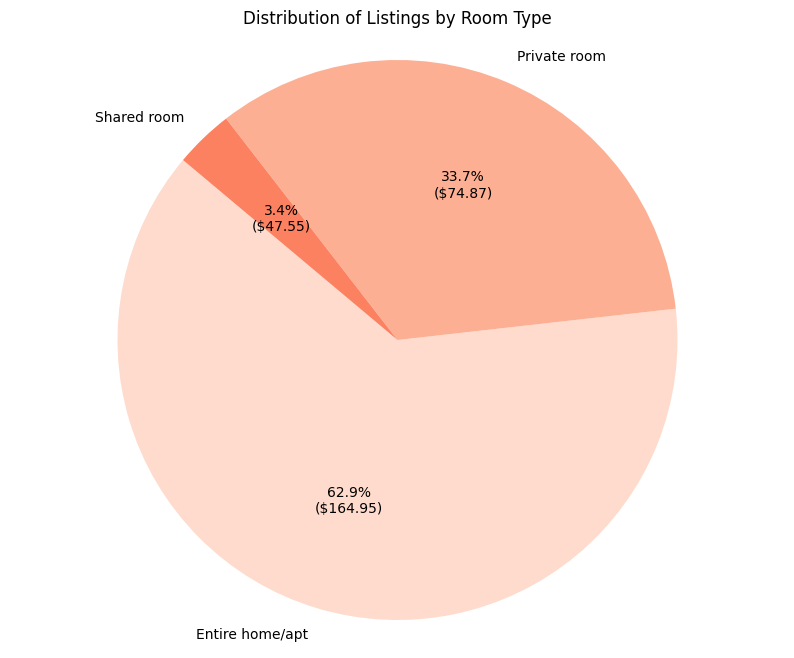

In [ ]:
# Calculate the count of each room type
room_type_counts = listings['room_type'].value_counts()

# Calculate the mean price for each room type
mean_price_by_room_type = listings.groupby('room_type')['price'].mean()

# Print the count and mean price for each room type
print("Count and Mean Price of Listings for each Room Type:")
table_data = pd.concat([room_type_counts, mean_price_by_room_type], axis=1, keys=['Count', 'Mean Price'])
formatted_table = table_data.to_string(formatters={'Mean Price': '${:.2f}'.format})
print(formatted_table)

# Creating a Pie Plot for it here.
plt.figure(figsize=(10, 8))
patches, texts, autotexts = plt.pie(room_type_counts, labels=room_type_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("Reds"), textprops=dict(color="black"))

# Add mean price as text to each pie slice
for i, (label, mean_price) in enumerate(zip(room_type_counts.index, mean_price_by_room_type)):
    autotexts[i].set_text(f'{autotexts[i].get_text()}\n(${mean_price:.2f})')

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Listings by Room Type')
plt.show()

In [ ]:
# Displaying Types of Properties in the listings
print("Number of property types:", len(listings["property_type"].unique()))
print()

# Printing each count as well here.
print("Property type, Count of listings, and Mean Price:")
property_type_counts = listings["property_type"].value_counts()
mean_price_by_property_type = listings.groupby('property_type')['price'].mean()

property_data = pd.concat([property_type_counts, mean_price_by_property_type], axis=1, keys=['Count', 'Mean Price'])
property_data.reset_index(inplace=True)
property_data.columns = ['Property Type', 'Count', 'Mean Price']



property_data


Number of property types: 16

Property type, Count of listings, and Mean Price:


,Property Type,Count,Mean Price
0,House,1678,133.542312
1,Apartment,1427,126.644008
2,Townhouse,116,129.620690
3,Condominium,87,153.724138
4,Bed & Breakfast,37,112.054054
5,Loft,27,142.407407
6,Cabin,17,108.529412
7,Other,16,93.875000
8,Camper/RV,9,86.222222
9,Boat,8,282.375000


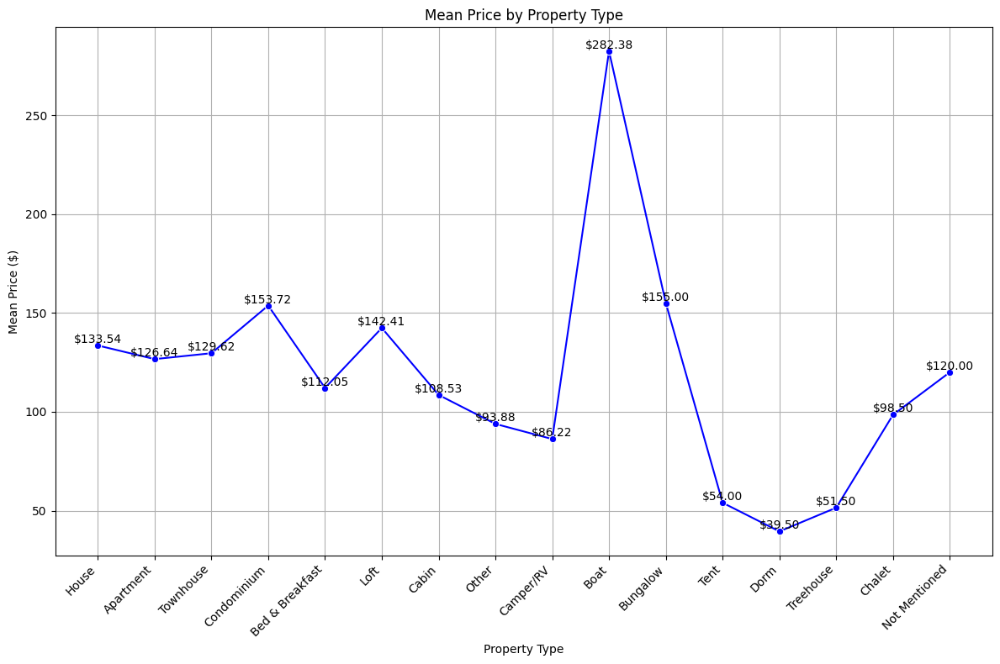

In [ ]:

# Property data from the table
property_types = property_data['Property Type']
mean_prices = property_data['Mean Price']

# Create a line plot
plt.figure(figsize=(12, 8))
sns.lineplot(x=property_types, y=mean_prices, marker='o', color='blue', linestyle='-')
plt.title("Mean Price by Property Type")
plt.xlabel("Property Type")
plt.ylabel("Mean Price ($)")
plt.xticks(rotation=45, ha='right')
plt.grid(True)

# Annotate mean price values
for i, price in enumerate(mean_prices):
    plt.text(i, price, f"${price:.2f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()


In [ ]:
# Finding Mean prices for different property types based on their room types here.

room_property = listings.groupby(['property_type','room_type']).price.mean()
room_property = room_property.reset_index()
room_property=room_property.sort_values('price',ascending=[0])
room_property

,property_type,room_type,price
6,Boat,Entire home/apt,447.250000
34,Townhouse,Entire home/apt,200.134615
21,House,Entire home/apt,197.461905
8,Bungalow,Entire home/apt,176.250000
17,Condominium,Entire home/apt,172.235294
24,Loft,Entire home/apt,169.352941
0,Apartment,Entire home/apt,139.495205
15,Chalet,Entire home/apt,135.000000
28,Other,Entire home/apt,128.833333
10,Cabin,Entire home/apt,122.750000


<Figure size 1000x1000 with 0 Axes>

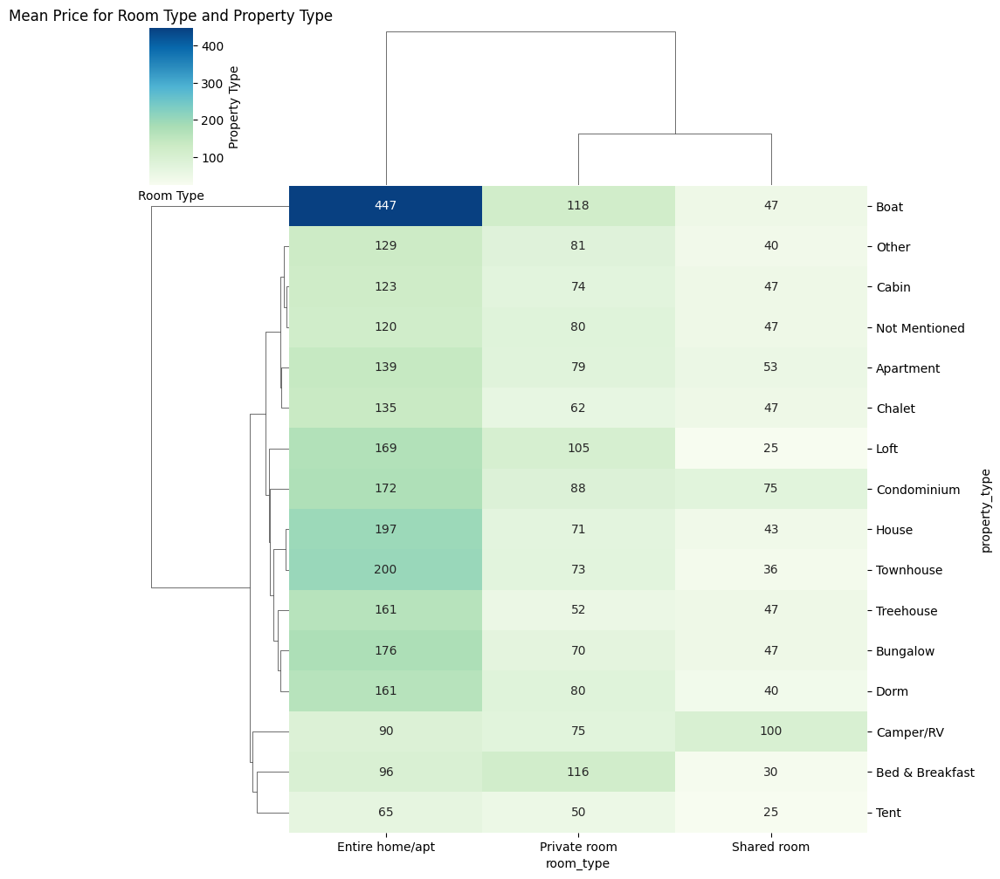

In [ ]:
# Pivoting the room_property dataframe for heatmap here.

pivot_room_property = room_property.pivot(index='property_type', columns='room_type', values='price')
pivot_room_property_filled = pivot_room_property.fillna(pivot_room_property.mean())

# Plotting a heatmap with dendograms here.

plt.figure(figsize=(10, 10))
sns.clustermap(pivot_room_property_filled, cmap='GnBu', annot=True, fmt=".0f", cbar_kws={'label': 'Mean Price'})
plt.xlabel('Room Type')
plt.ylabel('Property Type')
plt.title('Mean Price for Room Type and Property Type')
plt.show()

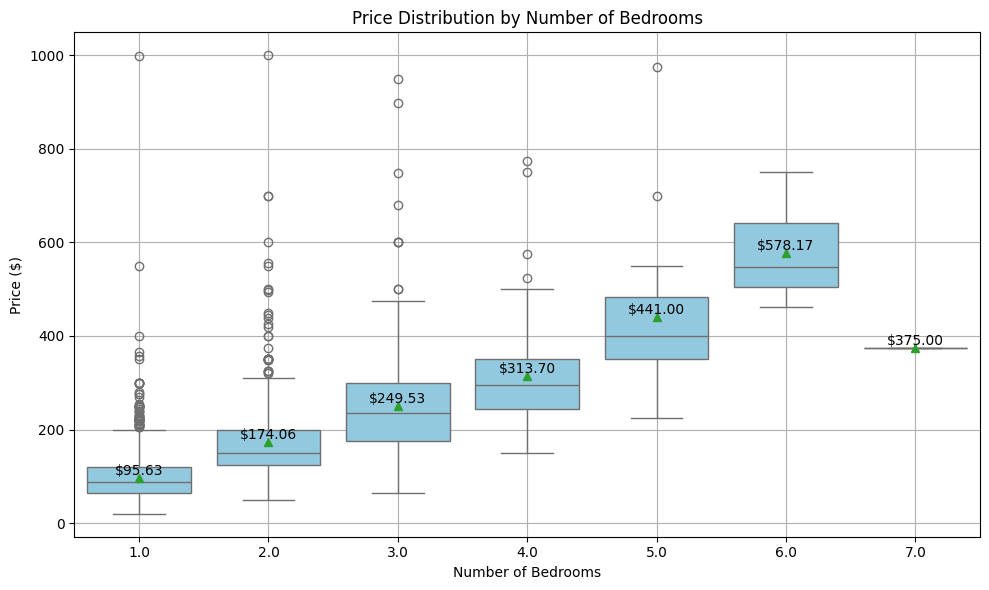

In [ ]:

plt.figure(figsize=(10, 6))
sns.boxplot(x='bedrooms', y='price', data=listings[['bedrooms', 'price']], showmeans=True, color='skyblue')
plt.title("Price Distribution by Number of Bedrooms")
plt.xlabel("Number of Bedrooms")
plt.ylabel("Price ($)")
plt.grid(True)

# Calculate mean price for each number of bedrooms
mean_prices = listings.groupby('bedrooms')['price'].mean()

# Annotate mean price values
for i, price in enumerate(mean_prices):
    plt.text(i, price, f"${price:.2f}", ha='center', va='bottom')  # Change color to red

plt.tight_layout()
plt.show()


In [ ]:

# Extracting dataframe of different property types and the number of bedrooms
property_bedrooms_df = listings[['property_type', 'bedrooms', 'price']]

# Group by property type and number of bedrooms, then calculate the count and mean price
property_bedrooms_stats = property_bedrooms_df.groupby(['property_type', 'bedrooms']).agg({'price': ['count', 'mean']}).reset_index()

# Rename the columns for better readability
property_bedrooms_stats.columns = ['Property Type', 'Number of Bedrooms', 'Number of Listings', 'Mean Price']

# Display the dataframe
print(property_bedrooms_stats)


      Property Type  Number of Bedrooms  Number of Listings  Mean Price
0         Apartment                 1.0                1114  111.473070
1         Apartment                 2.0                 294  173.979592
2         Apartment                 3.0                  17  287.294118
3         Apartment                 4.0                   2  253.000000
4   Bed & Breakfast                 1.0                  37  112.054054
5              Boat                 1.0                   5  111.000000
6              Boat                 2.0                   1  249.000000
7              Boat                 3.0                   1  680.000000
8              Boat                 4.0                   1  775.000000
9          Bungalow                 1.0                   4  106.500000
10         Bungalow                 4.0                   1  349.000000
11            Cabin                 1.0                  16   96.562500
12            Cabin                 2.0                   1  300

In [ ]:

num_listings = listings['bedrooms'].value_counts()

# Calculate mean price for each number of bedrooms
mean_price_by_bedrooms = listings.groupby('bedrooms')['price'].mean()

# Combine number of listings and mean price into a dataframe
bedrooms_stats = pd.concat([num_listings, mean_price_by_bedrooms], axis=1, keys=['Listings', 'Mean Price'])

# Reset index name for better display
bedrooms_stats.index.name = 'Bedrooms'

print(bedrooms_stats)


          Listings  Mean Price
Bedrooms                      
1.0           2416   95.629967
2.0            640  174.062500
3.0            283  249.530035
4.0             69  313.695652
5.0             24  441.000000
6.0              6  578.166667
7.0              1  375.000000


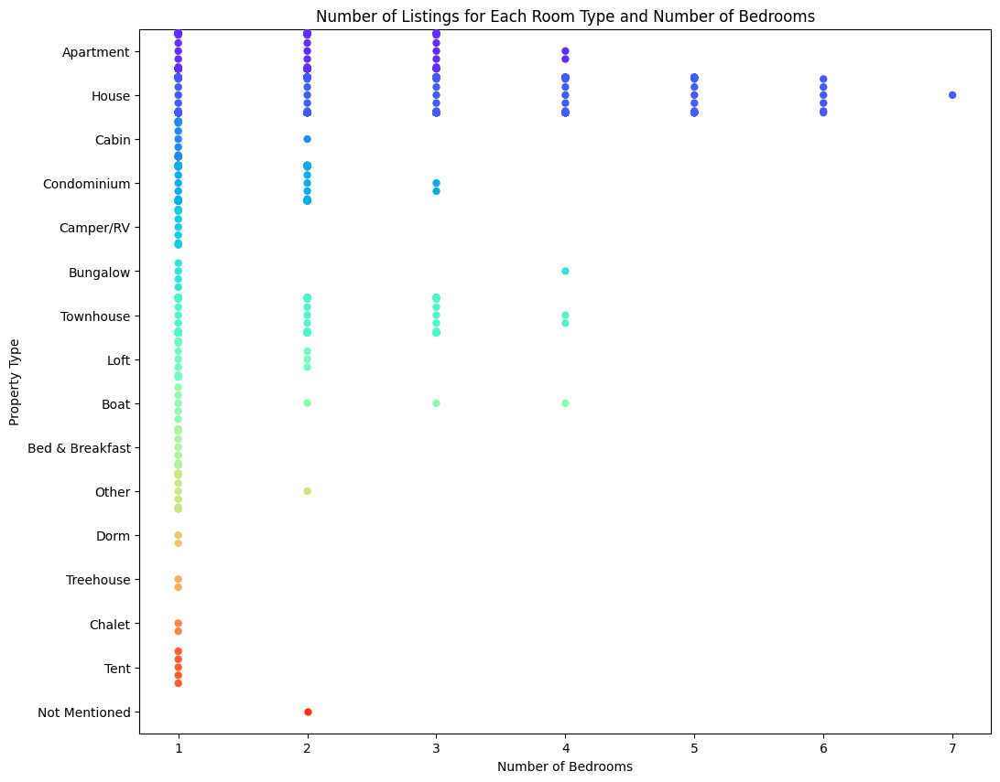

In [ ]:
plt.figure(figsize=(12, 10))
sns.swarmplot(x='bedrooms', y='property_type', data=property_bedrooms_df, palette='rainbow', size=6)
plt.xlabel('Number of Bedrooms')
plt.ylabel('Property Type')
plt.title('Number of Listings for Each Room Type and Number of Bedrooms')
plt.show()


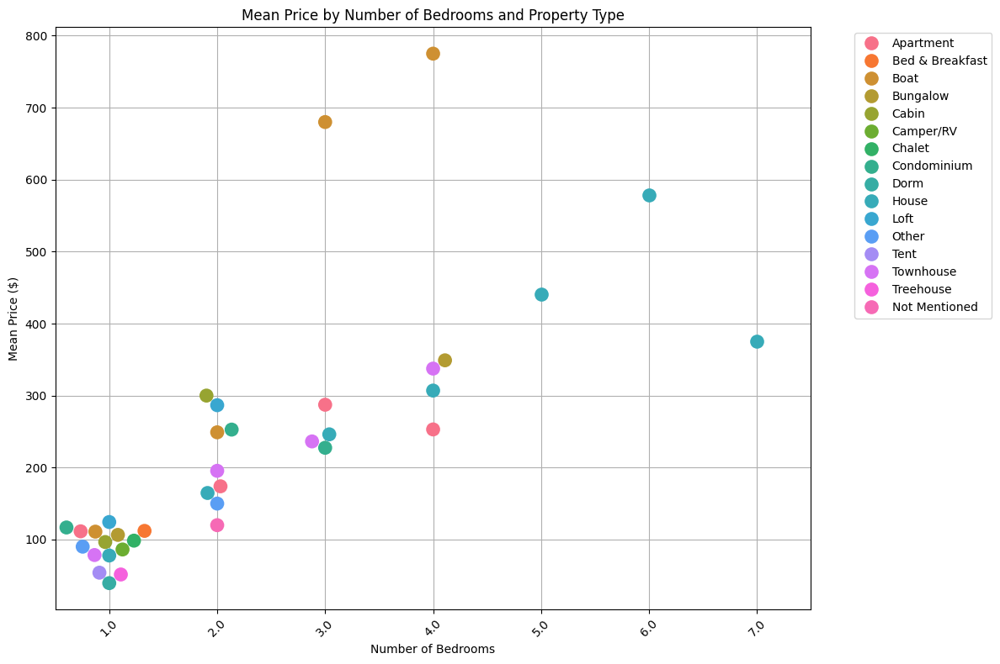

In [ ]:
# Create a swarm plot

plt.figure(figsize=(12, 8))
sns.swarmplot(x='Number of Bedrooms', y='Mean Price', hue='Property Type', data=property_bedrooms_stats, size=12)
plt.title("Mean Price by Number of Bedrooms and Property Type")
plt.xlabel("Number of Bedrooms")
plt.ylabel("Mean Price ($)")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

<Axes: xlabel='bedrooms', ylabel='property_type'>

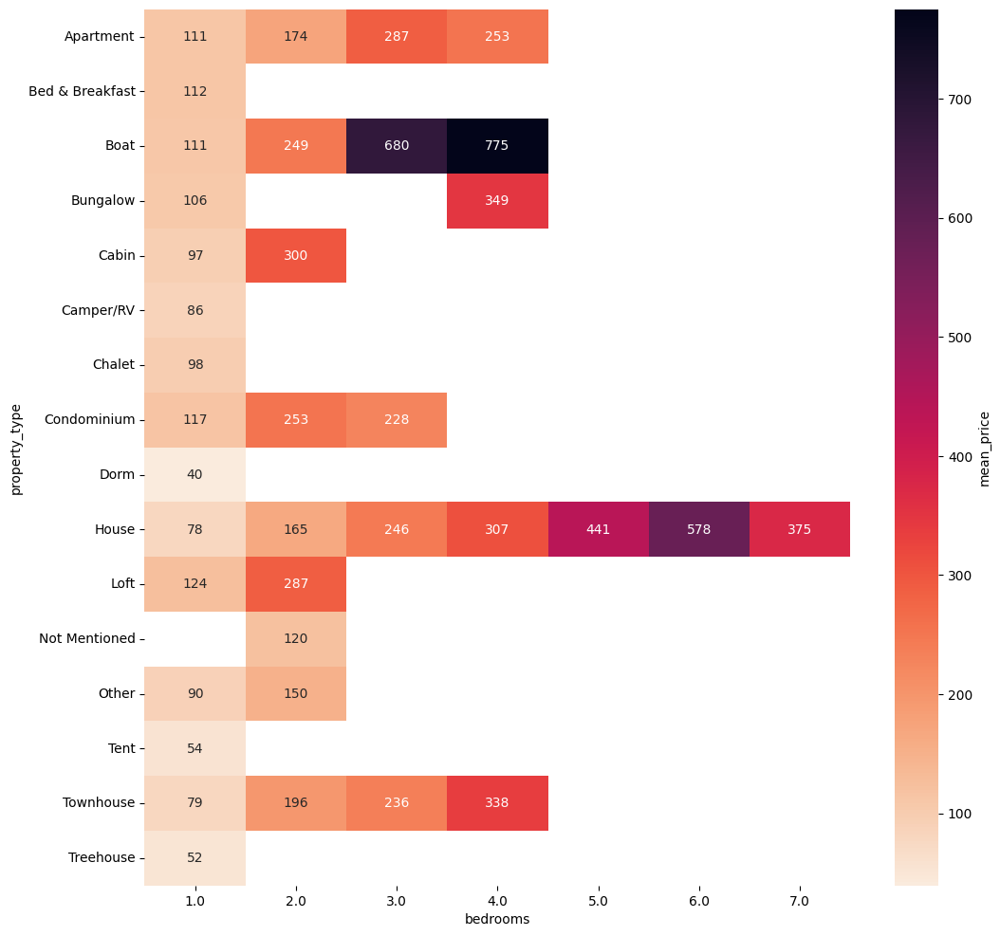

In [ ]:
# Plotting a heatmap of mean prices of different properties and their number of bedrooms for listings here.

plt.figure(figsize=(12,12))
sns.heatmap(listings.groupby(['property_type', 'bedrooms']).price.mean().unstack(),annot=True, fmt=".0f", cmap = sns.cm.rocket_r, cbar_kws={'label': 'mean_price'})

In [ ]:
# Calculate the mean price by neighbourhood
mean_price_by_neighborhood = listings.groupby('neighbourhood_cleansed')['price'].mean().reset_index()

# Sort the dataset by mean price in ascending order
mean_price_by_neighborhood_sorted = mean_price_by_neighborhood.sort_values(by='price', ascending=True).reset_index(drop=True)

# Display the sorted dataset
print(mean_price_by_neighborhood_sorted)


   neighbourhood_cleansed       price
0           Rainier Beach   68.176471
1           Olympic Hills   71.687500
2          South Delridge   74.272727
3              Georgetown   76.125000
4          North Delridge   76.321429
..                    ...         ...
82             Briarcliff  182.846154
83        West Queen Anne  200.543860
84               Westlake  201.312500
85            Portage Bay  227.857143
86     Southeast Magnolia  236.812500

[87 rows x 2 columns]


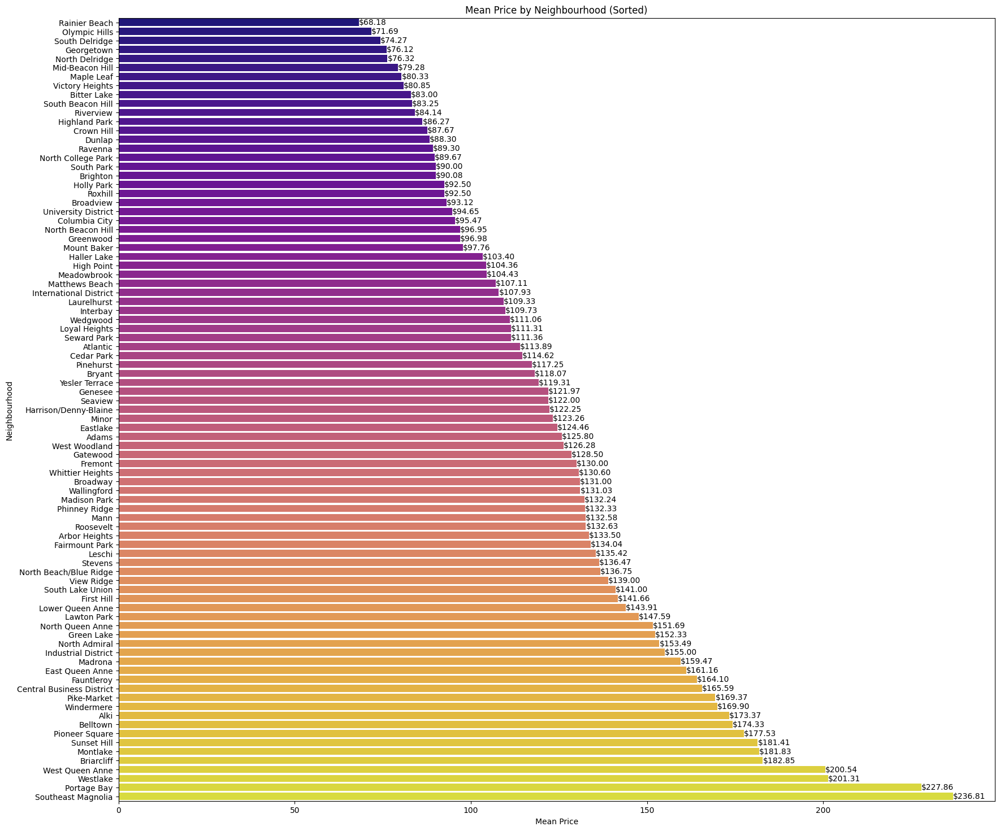

In [ ]:
# Plot bar graph
plt.figure(figsize=(20, 18))
bar_plot = sns.barplot(x='price', y='neighbourhood_cleansed', data=mean_price_by_neighborhood_sorted, palette='plasma')

# Add annotations for mean prices
for index, row in mean_price_by_neighborhood_sorted.iterrows():
    bar_plot.text(row['price'], index, f'${row["price"]:.2f}', color='black', ha="left", va="center")

plt.xlabel('Mean Price')
plt.ylabel('Neighbourhood')
plt.title('Mean Price by Neighbourhood (Sorted)')
plt.show()


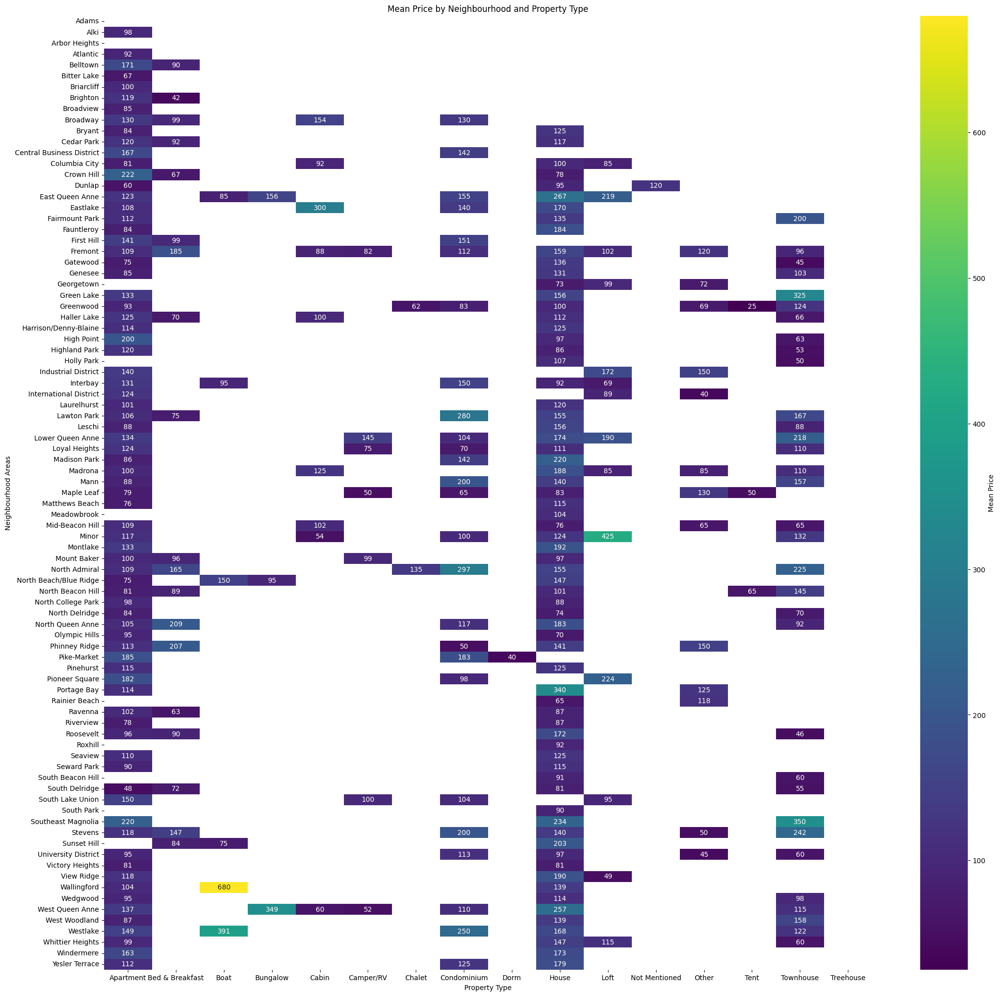

In [ ]:
# Create the heatmap to display median prices based on the neighbourhood and property type here.

plt.figure(figsize=(25, 25))
heatmap_data = listings.groupby(['neighbourhood_cleansed', 'property_type']).price.mean().unstack()
mask = np.triu(np.ones_like(heatmap_data, dtype=bool))
sns.heatmap(heatmap_data, annot=True, fmt=".0f", cmap='viridis', cbar_kws={'label': 'Mean Price'}, mask=mask)
plt.xlabel('Property Type')
plt.ylabel('Neighbourhood Areas')
plt.title('Mean Price by Neighbourhood and Property Type')
plt.show()


In [ ]:
# Creating geographical clusters for areas with highest number of listings here.

home = listings[(listings.room_type == 'Entire home/apt')]
private = listings[(listings.room_type == 'Private room')]
shared = listings[(listings.room_type == 'Shared room')]
location_home = home[['id','latitude', 'longitude','price']]
location_private = private[['id','latitude', 'longitude','price']]
location_shared = shared[['id','latitude', 'longitude','price']]

In [ ]:


# Function to get nearby landmarks using the loaded landmarks dataframe
def get_nearby_landmarks(latitude, longitude, radius=16093.4):
    nearby_landmarks = []
    try:
        latitude = float(latitude)
        if latitude < -90 or latitude > 90:
            raise ValueError("Latitude value is outside the valid range (-90 to 90 degrees): {}".format(latitude))

        longitude = float(longitude)
        for index, landmark in landmarks_df.iterrows():
            landmark_lat = float(landmark['Latitude'])
            landmark_lon = float(landmark['Longitude'])
            distance = geopy.distance.geodesic((latitude, longitude), (landmark_lat, landmark_lon)).meters
            if distance <= radius:
                nearby_landmarks.append({
                    'name': landmark['NAME'],
                    'latitude': landmark_lat,
                    'longitude': landmark_lon,
                    'distance': distance
                })
        nearby_landmarks.sort(key=lambda x: x['distance'])
        return nearby_landmarks
    except ValueError as e:
        print(e)
        return []

# Load landmarks DataFrame from Excel
landmarks_df = pd.read_excel('/content/Landmarks.xlsx')

# Creating map to display the geographical clusters here.
map_clusters = folium.Map(location=[47.605775, -122.333163], zoom_start=11)

# Create marker clusters for each type of property - home, private room, and shared rooms.
marker_cluster_home = MarkerCluster().add_to(map_clusters)
marker_cluster_private = MarkerCluster().add_to(map_clusters)
marker_cluster_shared = MarkerCluster().add_to(map_clusters)
marker_cluster_landmarks = MarkerCluster().add_to(map_clusters)

# Add markers for each location in the marker clusters for properties
for lat, lon in zip(location_home['latitude'], location_home['longitude']):
    folium.Marker([lat, lon], icon=folium.Icon(color='yellow')).add_to(marker_cluster_home)

for lat, lon in zip(location_private['latitude'], location_private['longitude']):
    folium.Marker([lat, lon], icon=folium.Icon(color='red')).add_to(marker_cluster_private)

for lat, lon in zip(location_shared['latitude'], location_shared['longitude']):
    folium.Marker([lat, lon], icon=folium.Icon(color='blue')).add_to(marker_cluster_shared)

# Set to keep track of tagged landmarks
tagged_landmarks = set()

# Add purple markers for nearby landmarks for each listing
for locations in [location_home, location_private, location_shared]:
    for index, row in locations.iterrows():
        landmarks = get_nearby_landmarks(row['latitude'], row['longitude'])  # No limit specified
        for landmark in landmarks:
            # Check if landmark is already tagged, if not, add it to the map and the set
            if landmark['name'] not in tagged_landmarks:
                folium.Marker([landmark['latitude'], landmark['longitude']],
                              icon=folium.Icon(color='green')).add_to(marker_cluster_landmarks)
                tagged_landmarks.add(landmark['name'])

# Add legend
legend_html = '''
     <div style="position: fixed;
                 bottom: 90px; left: 50px; width: 150px; height: 150px;
                 border:2px solid grey; z-index:9999; font-size:14px;
                 background-color:white; opacity: 0.8;
                 ">
     &nbsp; <b>Color-Codes</b> <br>
     &nbsp; Home &nbsp; <i class="fa fa-map-marker fa-2x" style="color:yellow"></i><br>
     &nbsp; Private Room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i><br>
     &nbsp; Shared Room &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
     &nbsp; Landmark &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
      </div>
     '''
map_clusters.get_root().html.add_child(folium.Element(legend_html))

# Display the map
map_clusters


In [ ]:


# Combine all locations and prices into one DataFrame
all_locations = pd.concat([location_home[['id', 'latitude', 'longitude', 'price']],
                           location_private[['id', 'latitude', 'longitude', 'price']],
                           location_shared[['id', 'latitude', 'longitude', 'price']]])

# Merge listings and locations data to get neighborhood information
merged_data = pd.merge(listings[['id', 'latitude', 'longitude', 'neighbourhood_cleansed']], all_locations, left_on='id', right_on='id')

# Group data by neighborhood area and calculate mean price
neighborhood_mean_prices = merged_data.groupby('neighbourhood_cleansed').agg({'latitude_x': 'mean', 'longitude_y': 'mean', 'price': 'mean'}).reset_index()

# Calculate percentile ranks of prices for heatmap
all_locations['price_percentile'] = all_locations['price'].rank(pct=True)

# Create a HeatMap layer
heat_data = [[row['latitude'], row['longitude'], row['price_percentile']] for index, row in all_locations.iterrows()]
map_heatmap = folium.Map(location=[47.605775, -122.333163], zoom_start=11)
HeatMap(heat_data, gradient={0.3: 'yellow', 0.7: 'orange', 1: 'red'}, radius=15, blur=20, max_zoom=1).add_to(map_heatmap)

# Display the map
map_heatmap


In [ ]:
# Grouping neighbourhood by number of listings
neighbourhood_counts = home.groupby('neighbourhood_cleansed').id.count()

# Calculate mean price for each group
neighbourhood_mean_price = home.groupby('neighbourhood_cleansed').price.mean()

# Combine the two Series into a DataFrame
mergeDF = pd.DataFrame({'Number_Of_Listings': neighbourhood_counts, 'Mean_Price': neighbourhood_mean_price})

# Reset index to make 'neighbourhood_cleansed' a column instead of the index
mergeDF.reset_index(inplace=True)

# Sort by the number of listings
mergeDF = mergeDF.sort_values('Number_Of_Listings', ascending=False)

mergeDF


,neighbourhood_cleansed,Number_Of_Listings,Mean_Price
9,Broadway,205,159.429268
4,Belltown,170,183.170588
21,Fremont,97,159.329897
79,Wallingford,97,174.391753
12,Central Business District,85,169.035294
...,...,...,...
2,Arbor Heights,2,212.500000
32,Industrial District,2,235.000000
66,Roxhill,1,125.000000
24,Georgetown,1,99.000000


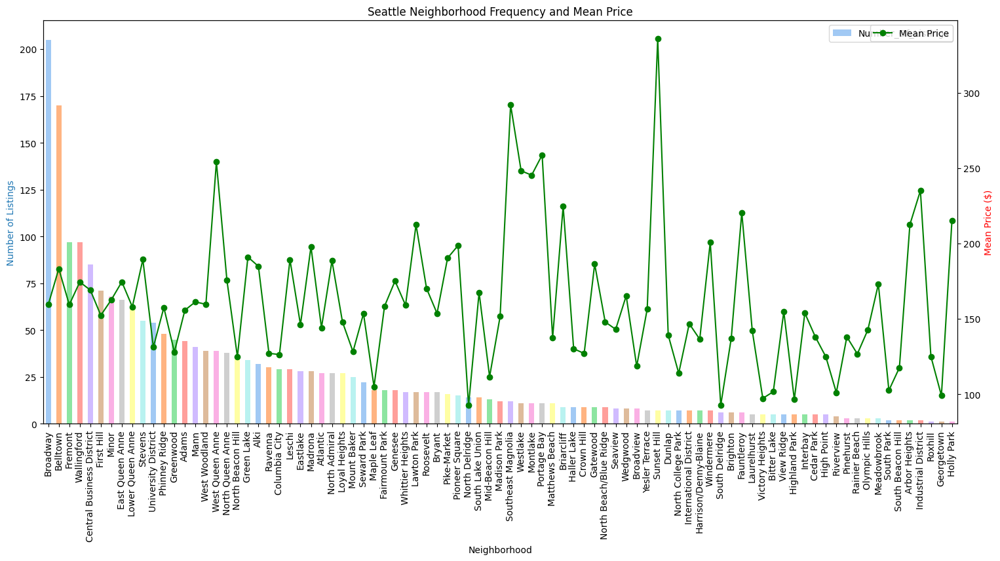

In [ ]:

# Define colors for the bars
colors = sns.color_palette("pastel", len(mergeDF))

# Plot the bar graph
fig, ax = plt.subplots(figsize=(18, 8))

# Plot number of listings
mergeDF.plot(kind='bar', x='neighbourhood_cleansed', y='Number_Of_Listings', ax=ax, color=colors)
ax.set_ylabel('Number of Listings', color='tab:blue')
ax.set_xlabel('Neighborhood')
ax.set_xticklabels(mergeDF['neighbourhood_cleansed'], rotation=90)

# Plot mean price as a line plot
ax2 = ax.twinx()
ax2.plot(mergeDF['neighbourhood_cleansed'], mergeDF['Mean_Price'], color='green', marker='o', label='Mean Price')
ax2.set_ylabel('Mean Price ($)', color='red')

plt.title('Seattle Neighborhood Frequency and Mean Price')
plt.legend(loc='upper right')
plt.show()


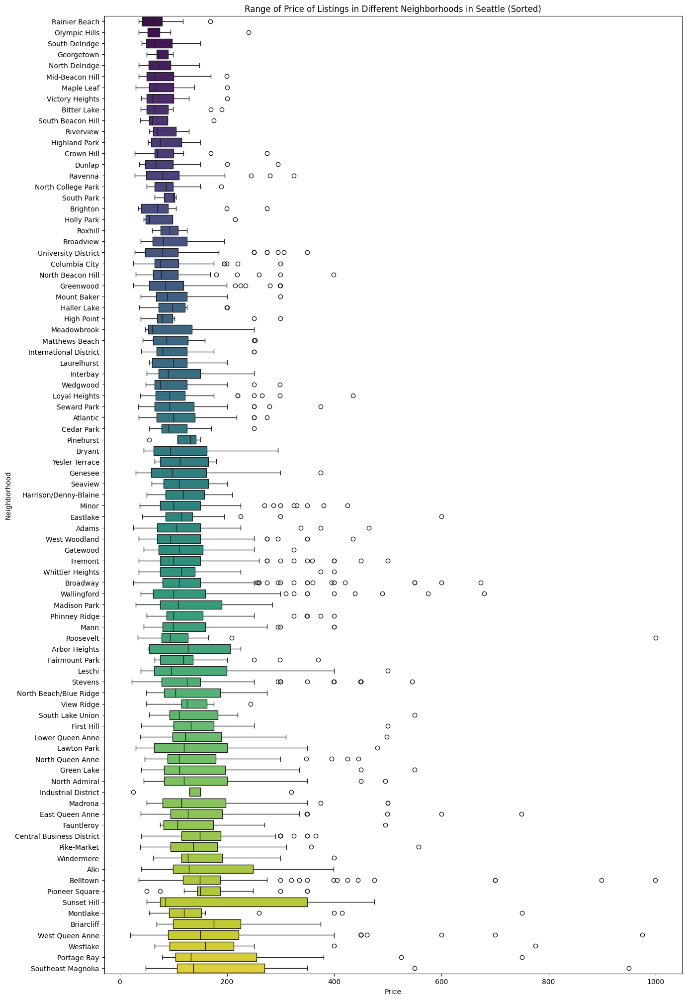

In [ ]:


# Calculate the median price for each neighborhood
median_price_by_neighborhood = listings.groupby('neighbourhood_cleansed')['price'].mean().sort_values()

# Get the sorted list of neighborhoods
sorted_neighborhoods = median_price_by_neighborhood.index

# Plot the boxplot with sorted neighborhoods
plt.figure(figsize=(15, 25))
sns.boxplot(y="neighbourhood_cleansed", x="price", data=listings, order=sorted_neighborhoods, palette="viridis")
plt.xlabel('Price')
plt.ylabel('Neighborhood')
plt.title('Range of Price of Listings in Different Neighborhoods in Seattle (Sorted)')
plt.show()


# Question 2: Descriptive Analysis

What are the essential qualities and characteristics of Seattle's most highly rated Airbnb rentals, and how do they affect customer satisfaction?



In [ ]:
# Select the desired columns from the listings DataFrame
selected_columns = listings[['id', 'price', 'review_scores_rating']]

# Rename the 'id' column to 'listing_id' to match the reviews DataFrame
selected_columns = selected_columns.rename(columns={'id': 'listing_id'})

# Merge the selected columns from listings with the reviews DataFrame based on the 'listing_id' column
merged_data = pd.merge(reviews, selected_columns, on='listing_id', how='left')
merged_data = merged_data.loc[:, ~merged_data.columns.duplicated()]

# Display the merged DataFrame
merged_data.head()


,listing_id,id,date,reviewer_id,reviewer_name,comments,language,price,review_scores_rating
0,7202016,38917982,2015-07-19,28943674,Bianca,Cute and cozy place. Perfect location to every...,en,75.0,95.0
1,7202016,39087409,2015-07-20,32440555,Frank,Kelly has a great room in a very central locat...,en,75.0,95.0
2,7202016,39820030,2015-07-26,37722850,Ian,"Very spacious apartment, and in a great neighb...",en,75.0,95.0
3,7202016,40813543,2015-08-02,33671805,George,Close to Seattle Center and all it has to offe...,en,75.0,95.0
4,7202016,41986501,2015-08-10,34959538,Ming,Kelly was a great host and very accommodating ...,en,75.0,95.0


In [ ]:
merged_data.columns

Index(['listing_id', 'id', 'date', 'reviewer_id', 'reviewer_name', 'comments',
       'language', 'price', 'review_scores_rating'],
      dtype='object')

In [ ]:
# Creating a dataframe of summaries of most expensive listings here

summary = listings[['summary', 'space', 'description', 'neighborhood_overview', 'price', 'review_scores_rating']]
summary = summary.loc[:,~summary.columns.duplicated()]

# Display the shape of the dataframe after removing duplicate columns
print("Shape of dataframe after removing duplicate columns:", summary.shape)

summary = summary.dropna(subset=['summary'])
summary = summary[summary['summary'] != 0]

# Filter the DataFrame to include only listings within the price range of $500 to $1000
top_expensive = summary[(summary['price'] >= 500) & (summary['price'] <= 1000)]

# Filter further to include only listings with a review_scores_rating above 90
top_expensive_high_rating = top_expensive[top_expensive['review_scores_rating'] > 75]

# Display the shape of the filtered dataframe
print("Shape of the filtered dataframe:", top_expensive_high_rating.shape)


Shape of dataframe after removing duplicate columns: (3439, 6)
Shape of the filtered dataframe: (27, 6)


In [ ]:
top_expensive_high_rating.head()

,summary,space,description,neighborhood_overview,price,review_scores_rating
2,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,Upper Queen Anne is a charming neighborhood fu...,975.0,97.0
19,This home built in 1909. It has 5 bedrooms a...,This home encompasses the character that is so...,This home built in 1909. It has 5 bedrooms a...,Upper Queen Anne is a charming neighborhood wi...,700.0,85.0
24,Enjoy Seattle from the ideally located Queen A...,Step into the main living space with sitting a...,Enjoy Seattle from the ideally located Queen A...,0,600.0,100.0
239,A Contemporary Retreat with Stunning Views s ...,"Light, big windows, open spaces , views and co...",A Contemporary Retreat with Stunning Views s ...,10 minutes walk to the restaurants and shoppin...,749.0,100.0
251,"Amazing views, close to downtown yet tucked aw...","Stunning, elegant property with amazing views!...","Amazing views, close to downtown yet tucked aw...",A community within walking distance of Downtow...,600.0,100.0


In [ ]:

def preprocess_text(text):
    # Check if the input text is a string or 0
    if isinstance(text, str):
        # Convert text to lowercase
        text = text.lower()
        # Expand contractions
        text = contractions.fix(text)
        # Remove punctuation and special characters
        text = re.sub(r'[^\w\s]', '', text)
        # Tokenize text
        tokens = word_tokenize(text)
        # Remove stop words
        stop_words = set(stopwords.words('english'))
        tokens = [word for word in tokens if word not in stop_words]
        # Lemmatize tokens
        lemmatizer = WordNetLemmatizer()
        tokens = [lemmatizer.lemmatize(word) for word in tokens]
        # Convert tokens back to text
        text = ' '.join(tokens)
    else:
        # If the input is 0, return an empty string
        text = 'None'
    return text

columns_to_preprocess = ['summary', 'space', 'description', 'neighborhood_overview']
for column in columns_to_preprocess:
    top_expensive_high_rating[column] = top_expensive_high_rating[column].apply(preprocess_text)


In [ ]:
# Preprocessing for summaries removing punctuations, stopwords, lemmatize and tokenize here.

english_words = set(nltk.corpus.words.words())
def preprocess_summary(summary):
    # Update contractions to expand 'u' as 'you'
    summary = summary.replace("u", "you")
    summary = summary.replace("\'s", "yes")
    # Expand contractions
    summary = contractions.fix(summary)

    # Tokenize the summary
    summary_tokens = nltk.word_tokenize(summary)

    # Remove non-letter characters and non-English words
    filtered_tokens = [token.lower() for token in summary_tokens if token.lower() in english_words and re.match('^[a-zA-Z]+$', token)]

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    stop_words.update(['seattle'])
    filtered_tokens = [token for token in filtered_tokens if token.lower() not in stop_words]

    # Lemmatize the tokens
    wnl = WordNetLemmatizer()
    lemmatized_tokens = [wnl.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    preprocessed_summary = ' '.join(lemmatized_tokens)

    return preprocessed_summary

# Apply preprocessing to multiple columns separately
columns_to_preprocess = ['summary', 'space', 'description', 'neighborhood_overview']
for column in columns_to_preprocess:
    top_expensive_high_rating[column] = top_expensive_high_rating[column].apply(preprocess_text)
top_expensive_high_rating.head()

,summary,space,description,neighborhood_overview,price,review_scores_rating
2,new modern house built 2013 spectacular sunset...,house modern light fresh warm simple palette a...,new modern house built 2013 spectacular sunset...,upper queen anne charming neighborhood full mi...,975.0,97.0
19,home built 1909 5 bedroom 35 bath perfect fami...,home encompasses character sought queen anne l...,home built 1909 5 bedroom 35 bath perfect fami...,upper queen anne charming neighborhood mix bea...,700.0,85.0
24,enjoy seattle ideally located queen anne hill ...,step main living space sitting area kitchen lo...,enjoy seattle ideally located queen anne hill ...,none,600.0,100.0
239,contemporary retreat stunning view space needl...,light big window open space view contemporanei...,contemporary retreat stunning view space needl...,10 minute walk restaurant shopping area queen ...,749.0,100.0
251,amazing view close downtown yet tucked away pe...,stunning elegant property amazing view book ex...,amazing view close downtown yet tucked away pe...,community within walking distance downtown que...,600.0,100.0


In [ ]:
# Convert each column's text to a list of strings and flatten the lists
all_text_lists = [top_expensive_high_rating[column].astype(str).tolist() for column in columns_to_preprocess]
all_text_flat = [item for sublist in all_text_lists for item in sublist]

# Join the flattened lists into a single string
all_text = ' '.join(all_text_flat)

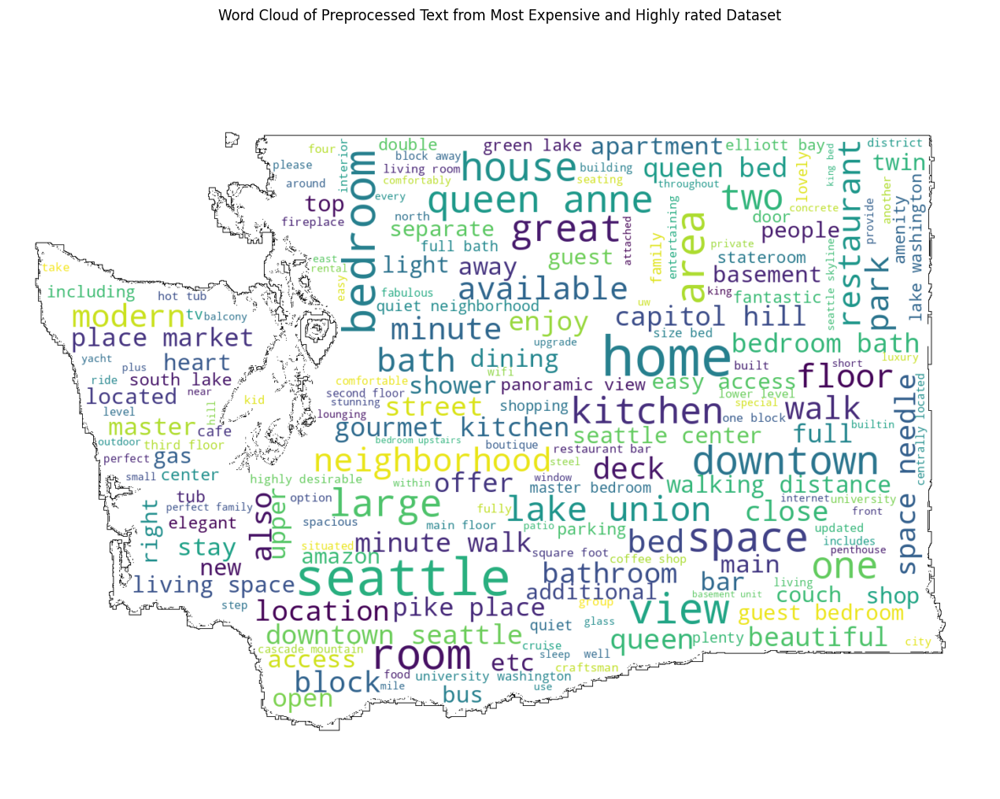

In [ ]:

# Import mask image for wordcloud
house_mask = np.array(Image.open("seattle.png"))

# Generate word cloud
wordcloud = WordCloud(width=800, height=500, background_color='white', max_font_size=80, stopwords=set(stopwords.words('english')),mask=house_mask,contour_width=0.5,contour_color='black')
wordcloud.generate(all_text)
plt.figure(figsize=(15, 18))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Preprocessed Text from Most Expensive and Highly rated Dataset')
plt.show()



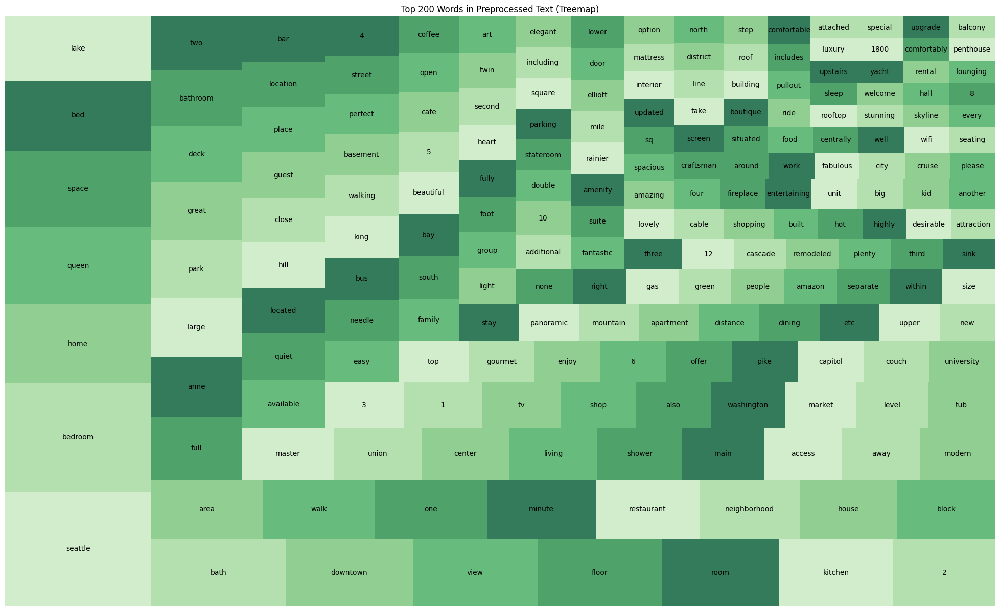

In [ ]:
# Tokenize the text into words
words = all_text.split()

# Count the frequency of each word
word_freq = Counter(words)

# Sort the words based on their frequency
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# Select the top 200 words with the highest frequency
top200 = sorted_word_freq[:200]

# Define shades of green for the treemap
shades_of_green = ['#c7e9c0', '#a1d99b', '#74c476', '#41ab5d', '#238b45', '#005a32']

# Create treemap
plt.figure(figsize=(25, 15))
squarify.plot(sizes=[freq for _, freq in top200], label=[word for word, _ in top200], alpha=0.8, color=shades_of_green)
plt.axis('off')
plt.title('Top 200 Words in Preprocessed Text (Treemap)')
plt.show()


In [ ]:
# Add a new column to merged_data to indicate if the listing is expensive
merged_data['is_expensive'] = merged_data['listing_id'].isin(listings[(listings['price'] >= 500) & (listings['price'] <= 1000)]['id'])

# Filter merged_data to include only reviews of expensive listings
summary = merged_data[merged_data['is_expensive']]
summary = summary.loc[:,~summary.columns.duplicated()]

# Filter out reviews where comments are not available
summary = summary[summary['comments'] != 0]
# Display the shape of the dataframe after removing duplicate columns
print("Shape of dataframe after removing duplicate columns:", summary.shape)

# Sort the DataFrame by price in descending order
top_expensive = summary.sort_values('price', ascending=False)
# Filter further to include only listings with a review_scores_rating above 90
top_expensive_high_rating = top_expensive[top_expensive['review_scores_rating'] > 75]
# Display the shape of the filtered dataframe
print("Shape of the filtered dataframe:", top_expensive_high_rating.shape)



Shape of dataframe after removing duplicate columns: (263, 10)
Shape of the filtered dataframe: (261, 10)


In [ ]:
# Display the top 5 rows of the DataFrame
top_expensive_high_rating.head()


,listing_id,id,date,reviewer_id,reviewer_name,comments,language,price,review_scores_rating,is_expensive
43575,4825073,24208925,2014-12-22,135889,Mariko,"Christina and Evan (and their dog, Mori!) are ...",en,1000.0,100.0,True
40465,3345341,22764582,2014-11-14,6945118,Lynn,Amy's place was great!couldn't really get more...,en,999.0,94.0,True
40474,3345341,25915811,2015-01-29,26556507,Marie,What we truly love about this appartment was t...,en,999.0,94.0,True
40468,3345341,23630305,2014-12-07,7453832,Marissa,Amy's apartment was fantastic. The location i...,en,999.0,94.0,True
40469,3345341,23848881,2014-12-12,1499027,James,Had a wonderful stay @ Amy's. Likely one of th...,en,999.0,94.0,True


In [ ]:
# Function to detect the language of a comment
def detect_language(comment):
    try:
        lang = detect(comment)
        return lang
    except:
        return 'unknown'

# Apply language detection to each comment
top_expensive_high_rating['language'] = top_expensive_high_rating['comments'].apply(detect_language)

# Filter out reviews where languages other than English are used
top_expensive_high_rating = top_expensive_high_rating[top_expensive_high_rating['language'] == 'en']

In [ ]:

def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Expand contractions
    text = contractions.fix(text)
    # Remove punctuation and special characters
    text = re.sub(r'[^\w\s]', '', text)
    # Tokenize text
    tokens = word_tokenize(text)
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    # Lemmatize tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    # Convert tokens back to text
    text = ' '.join(tokens)
    return text

# Apply preprocessing to comments
top_expensive_high_rating['comments'] = top_expensive_high_rating['comments'].apply(preprocess_text)

In [ ]:
# Preprocessing for summaries removing punctuations, stopwords, lemmatize and tokenize here.

english_words = set(nltk.corpus.words.words())
def preprocess_summary(summary):
    # Update contractions to expand 'u' as 'you'
    summary = summary.replace("u", "you")
    summary = summary.replace("\'s", "yes")
    # Expand contractions
    summary = contractions.fix(summary)

    # Tokenize the summary
    summary_tokens = nltk.word_tokenize(summary)

    # Remove non-letter characters and non-English words
    filtered_tokens = [token.lower() for token in summary_tokens if token.lower() in english_words and re.match('^[a-zA-Z]+$', token)]

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    stop_words.update(['seattle'])
    filtered_tokens = [token for token in filtered_tokens if token.lower() not in stop_words]

    # Lemmatize the tokens
    wnl = WordNetLemmatizer()
    lemmatized_tokens = [wnl.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    preprocessed_summary = ' '.join(lemmatized_tokens)
    return preprocessed_summary

preprocessed_summaries = top_expensive_high_rating['comments'].apply(preprocess_summary)
preprocessed_summaries.head()

43575    dog lovely friendly ton recommendation area lo...
40465    place really get central flat clean amenity wo...
40474    love location basically walk anywhere city pra...
40468    apartment fantastic location perfect right mid...
40469    stay likely one comfortable bed slept long tim...
Name: comments, dtype: object

In [ ]:
# Convert each column's text to a list of strings and flatten the lists
all_text_lists = [preprocessed_summaries.astype(str).tolist() for column in columns_to_preprocess]
all_text_flat = [item for sublist in all_text_lists for item in sublist]

# Join the flattened lists into a single string
all_text = ' '.join(all_text_flat)

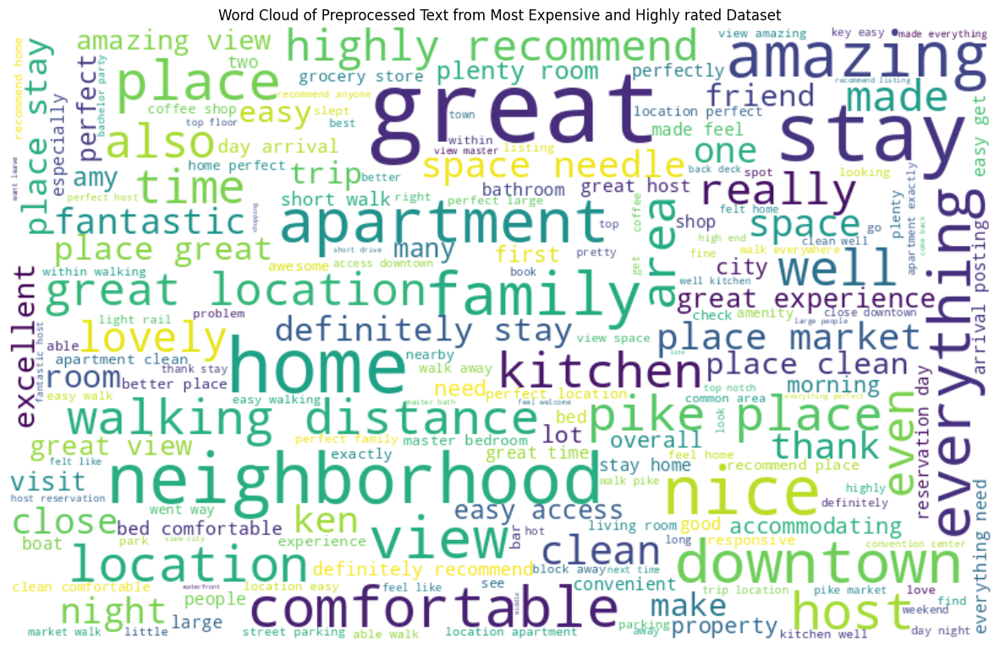

In [ ]:
# Generate word cloud
wordcloud = WordCloud(width=800, height=500, background_color='white', max_font_size=80, stopwords=set(stopwords.words('english')))
wordcloud.generate(all_text)
plt.figure(figsize=(15, 18))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Preprocessed Text from Most Expensive and Highly rated Dataset')
plt.show()

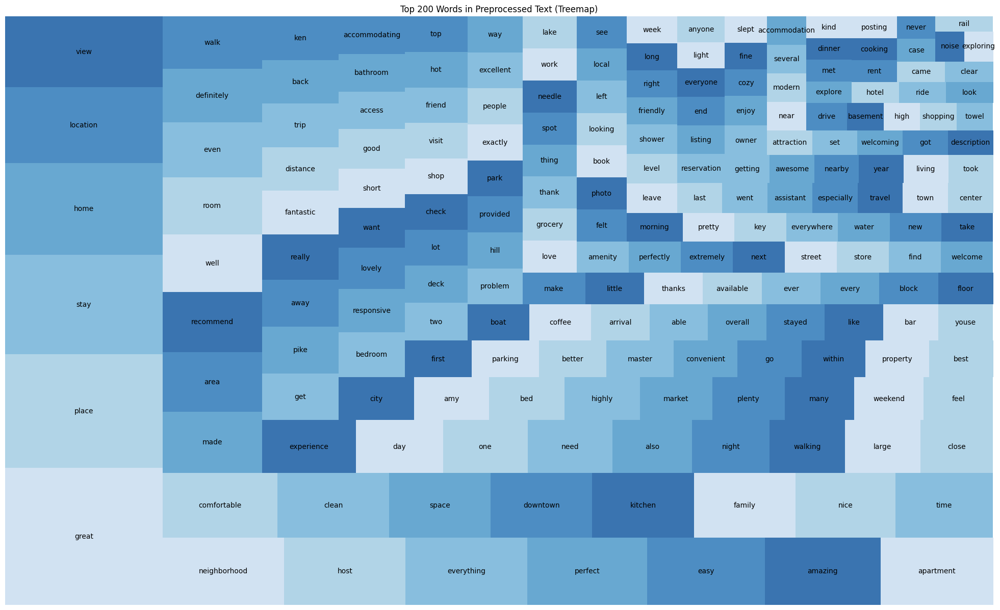

In [ ]:
# Tokenize the text into words
words = all_text.split()
# Count the frequency of each word
word_freq = Counter(words)

# Sort the words based on their frequency
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# Select the top 200 words with the highest frequency
top200 = sorted_word_freq[:200]
shades_of_blue = ['#c6dbef', '#9ecae1', '#6baed6', '#4292c6', '#2171b5', '#08519c']

# Create treemap
plt.figure(figsize=(25, 15))
squarify.plot(sizes=[freq for _, freq in top200], label=[word for word, _ in top200], alpha=0.8, color=shades_of_blue)
plt.axis('off')
plt.title('Top 200 Words in Preprocessed Text (Treemap)')
plt.show()


In [ ]:
# Creating a dataframe of summaries of most cheapest listings here.

summary = listings[['summary', 'space', 'description', 'neighborhood_overview', 'price', 'review_scores_rating']]
summary = summary.loc[:,~summary.columns.duplicated()]

# Display the shape of the dataframe after removing duplicate columns
print("Shape of dataframe after removing duplicate columns:", summary.shape)

summary = summary.dropna(subset=['summary'])
summary = summary[summary['summary'] != 0]

# Filter listings within the price range of 20-100
top_cheapest = summary[(summary['price'] >= 20) & (summary['price'] <= 100)]

# Filter further to include only listings with a review_scores_rating above 90
top_cheap_high_rating = top_cheapest[top_cheapest['review_scores_rating'] > 75]
top_cheap_high_rating.shape


Shape of dataframe after removing duplicate columns: (3439, 6)


(1326, 6)

In [ ]:
top_cheap_high_rating.head()

,summary,space,description,neighborhood_overview,price,review_scores_rating
6,Enjoy a quiet stay in our comfortable 1915 Cra...,Enjoy a quiet stay in our comfortable 1915 Cra...,Enjoy a quiet stay in our comfortable 1915 Cra...,"Close restaurants, coffee shops and grocery st...",80.0,99.0
7,"Our tiny cabin is private , very quiet and com...","This cabin was built with Airbnb in mind, Que...","Our tiny cabin is private , very quiet and com...",We are centrally located between Downtown and ...,60.0,97.0
8,"Nestled in the heart of the city, this space i...","Located in the heart of the city, this space i...","Nestled in the heart of the city, this space i...",Walking Score: 92 4 blocks from Kerry Park Fam...,90.0,97.0
10,Queen Anne Hill is a charming neighborhood wit...,Be close to everything! Queen Anne Hill is a ...,Queen Anne Hill is a charming neighborhood wit...,Queen Anne Hill is a wonderful and historic ar...,95.0,97.0
11,"Beautifully furnished, cozy 1 bedroom mid cent...",Beautiful home in an extremely walkable neighb...,"Beautifully furnished, cozy 1 bedroom mid cent...",I am located in the Upper Queen Anne neighborh...,99.0,97.0


In [ ]:
def preprocess_text(text):
    # Check if the input text is a string or 0
    if isinstance(text, str):
        # Convert text to lowercase
        text = text.lower()
        # Expand contractions
        text = contractions.fix(text)
        # Remove punctuation and special characters
        text = re.sub(r'[^\w\s]', '', text)
        # Tokenize text
        tokens = word_tokenize(text)
        # Remove stop words
        stop_words = set(stopwords.words('english'))
        tokens = [word for word in tokens if word not in stop_words]
        # Lemmatize tokens
        lemmatizer = WordNetLemmatizer()
        tokens = [lemmatizer.lemmatize(word) for word in tokens]
        # Convert tokens back to text
        text = ' '.join(tokens)
    else:
        # If the input is 0, return an empty string
        text = 'None'
    return text

# Apply preprocessing to multiple columns separately
columns_to_preprocess = ['summary', 'space', 'description', 'neighborhood_overview']
for column in columns_to_preprocess:
    top_cheap_high_rating[column] = top_cheap_high_rating[column].apply(preprocess_text)


In [ ]:
# Preprocessing for summaries removing punctuations, stopwords, lemmatize and tokenize here.

english_words = set(nltk.corpus.words.words())
# Define a function to preprocess each summary
def preprocess_summary(summary):
    # Update contractions to expand 'u' as 'you'
    summary = summary.replace("u", "you")
    summary = summary.replace("\'s", "yes")
    # Expand contractions
    summary = contractions.fix(summary)
    # Tokenize the summary
    summary_tokens = nltk.word_tokenize(summary)
    # Remove non-letter characters and non-English words
    filtered_tokens = [token.lower() for token in summary_tokens if token.lower() in english_words and re.match('^[a-zA-Z]+$', token)]
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    stop_words.update(['seattle'])
    filtered_tokens = [token for token in filtered_tokens if token.lower() not in stop_words]
    # Lemmatize the tokens
    wnl = WordNetLemmatizer()
    lemmatized_tokens = [wnl.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    preprocessed_summary = ' '.join(lemmatized_tokens)
    return preprocessed_summary

# Apply preprocessing to multiple columns separately
columns_to_preprocess = ['summary', 'space', 'description', 'neighborhood_overview']
for column in columns_to_preprocess:
    top_cheap_high_rating[column] = top_cheap_high_rating[column].apply(preprocess_text)
top_cheap_high_rating.head()

,summary,space,description,neighborhood_overview,price,review_scores_rating
6,enjoy quiet stay comfortable 1915 craftsman bu...,enjoy quiet stay comfortable 1915 craftsman bu...,enjoy quiet stay comfortable 1915 craftsman bu...,close restaurant coffee shop grocery store eas...,80.0,99.0
7,tiny cabin private quiet comfortable spot two ...,cabin built airbnb mind queen bed gel foam top...,tiny cabin private quiet comfortable spot two ...,centrally located downtown ballard whole food ...,60.0,97.0
8,nestled heart city space turn century charm me...,located heart city space turn century meet urb...,nestled heart city space turn century charm me...,walking score 92 4 block kerry park famous sea...,90.0,97.0
10,queen anne hill charming neighborhood historic...,close everything queen anne hill charming neig...,queen anne hill charming neighborhood historic...,queen anne hill wonderful historic area seattl...,95.0,97.0
11,beautifully furnished cozy 1 bedroom mid centu...,beautiful home extremely walkable neighborhood...,beautifully furnished cozy 1 bedroom mid centu...,located upper queen anne neighborhood seattle ...,99.0,97.0


In [ ]:
# Convert each column's text to a list of strings and flatten the lists
all_text_lists = [top_cheap_high_rating[column].astype(str).tolist() for column in columns_to_preprocess]
all_text_flat = [item for sublist in all_text_lists for item in sublist]

# Join the flattened lists into a single string
all_text = ' '.join(all_text_flat)

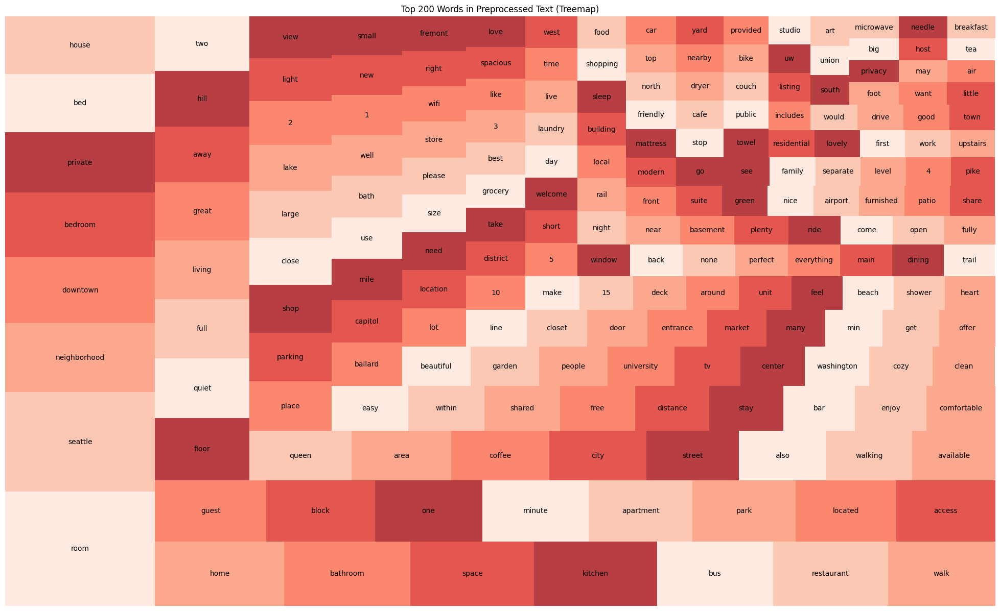

In [ ]:
# Tokenize the text into words
words = all_text.split()
# Count the frequency of each word
word_freq = Counter(words)

# Sort the words based on their frequency
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
# Select the top 200 words with the highest frequency
top200 = sorted_word_freq[:200]

# Define shades of green for the treemap
shades_of_red = ['#fee5d9', '#fcbba1', '#fc9272', '#fb6a4a', '#de2d26', '#a50f15']

# Create treemap
plt.figure(figsize=(25, 15))
squarify.plot(sizes=[freq for _, freq in top200], label=[word for word, _ in top200], alpha=0.8, color=shades_of_red)
plt.axis('off')
plt.title('Top 200 Words in Preprocessed Text (Treemap)')
plt.show()

In [ ]:
# Add a new column to merged_data to indicate if the listing is cheap
merged_data['is_cheap'] = merged_data['listing_id'].isin(listings[(listings['price'] >= 20) & (listings['price'] <= 100)]['id'])
# Filter merged_data to include only reviews of expensive listings
summary = merged_data[merged_data['is_cheap']]
summary = summary.loc[:,~summary.columns.duplicated()]

# Filter out reviews where comments are not available
summary = summary[summary['comments'] != 0]
# Display the shape of the dataframe after removing duplicate columns
print("Shape of dataframe after removing duplicate columns:", summary.shape)
# Sort the DataFrame by price in descending order
top_cheapest = summary.sort_values('price', ascending=True)
# Filter further to include only listings with a review_scores_rating above 90
top_cheap_high_rating = top_cheapest[top_cheapest['review_scores_rating'] > 75]
# Display the shape of the filtered dataframe
print("Shape of the filtered dataframe:", top_cheap_high_rating.shape)

Shape of dataframe after removing duplicate columns: (47524, 11)
Shape of the filtered dataframe: (47408, 11)


In [ ]:
top_cheap_high_rating.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,language,price,review_scores_rating,is_expensive,is_cheap
41501,10248139,58466807,2016-01-02,49387538,Fernando,I was able to book on the last minute and work...,en,22.0,100.0,False,True
16583,4701205,35025478,2015-06-14,26175335,Christina,His house has a great location and he is very ...,en,25.0,85.0,False,True
16582,4701205,34747321,2015-06-11,32653238,Lucio,Brent is friendly and easy gogin (quiet). Ther...,en,25.0,85.0,False,True
16581,4701205,34347911,2015-06-07,32851463,Trip,Brent was a great host. Very welcoming and fun...,en,25.0,85.0,False,True
16580,4701205,33180002,2015-05-25,7903956,David,Location is awesome and Brent is a very friend...,en,25.0,85.0,False,True


In [ ]:
# Function to detect the language of a comment
def detect_language(comment):
    try:
        lang = detect(comment)
        return lang
    except:
        return 'unknown'

# Apply language detection to each comment
top_cheap_high_rating['language'] = top_cheap_high_rating['comments'].apply(detect_language)

# Filter out reviews where languages other than English are used
top_cheap_high_rating = top_cheap_high_rating[top_cheap_high_rating['language'] == 'en']

In [ ]:

def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Expand contractions
    text = contractions.fix(text)
    # Remove punctuation and special characters
    text = re.sub(r'[^\w\s]', '', text)
    # Tokenize text
    tokens = word_tokenize(text)
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    # Lemmatize tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    # Convert tokens back to text
    text = ' '.join(tokens)
    return text

# Apply preprocessing to comments
top_cheap_high_rating['comments'] = top_cheap_high_rating['comments'].apply(preprocess_text)

In [ ]:
# Preprocessing for summaries removing punctuations, stopwords, lemmatize and tokenize here.

english_words = set(nltk.corpus.words.words())
def preprocess_summary(summary):
    # Update contractions to expand 'u' as 'you'
    summary = summary.replace("u", "you")
    summary = summary.replace("\'s", "yes")
    # Expand contractions
    summary = contractions.fix(summary)

    # Tokenize the summary
    summary_tokens = nltk.word_tokenize(summary)

    # Remove non-letter characters and non-English words
    filtered_tokens = [token.lower() for token in summary_tokens if token.lower() in english_words and re.match('^[a-zA-Z]+$', token)]

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    stop_words.update(['seattle'])
    filtered_tokens = [token for token in filtered_tokens if token.lower() not in stop_words]

    # Lemmatize the tokens
    wnl = WordNetLemmatizer()
    lemmatized_tokens = [wnl.lemmatize(token) for token in filtered_tokens]

    # Join the tokens back into a string
    preprocessed_summary = ' '.join(lemmatized_tokens)
    return preprocessed_summary

preprocessed_summaries = top_cheap_high_rating['comments'].apply(preprocess_summary)
preprocessed_summaries.head()

41501          able book last work really well nice polite
16583                                  great location nice
16582    brent friendly easy small room sleep amazing d...
16581           brent great host welcoming definitely stay
16580    location awesome brent friendly welcoming spac...
Name: comments, dtype: object

In [ ]:

# Convert each column's text to a list of strings and flatten the lists
all_text_lists = [preprocessed_summaries.astype(str).tolist() for column in columns_to_preprocess]
all_text_flat = [item for sublist in all_text_lists for item in sublist]

# Join the flattened lists into a single string
all_text = ' '.join(all_text_flat)

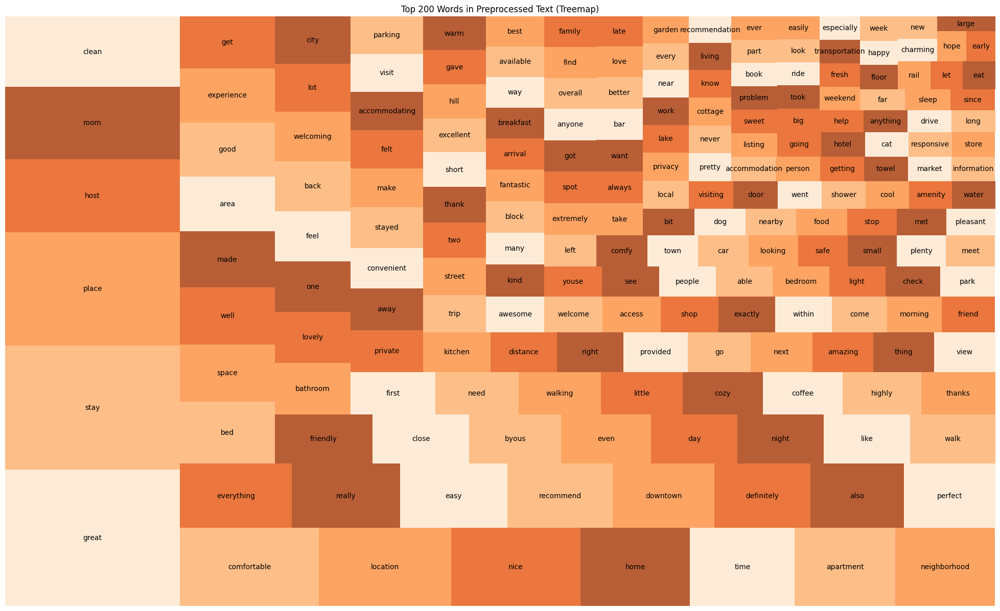

In [ ]:
# Tokenize the text into words
words = all_text.split()
# Count the frequency of each word
word_freq = Counter(words)

# Sort the words based on their frequency
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

# Select the top 200 words with the highest frequency
top200 = sorted_word_freq[:200]
shades_of_orange = ['#fee6ce', '#fdae6b', '#fd8d3c', '#e6550d', '#a63603']

# Create treemap
plt.figure(figsize=(25, 15))
squarify.plot(sizes=[freq for _, freq in top200], label=[word for word, _ in top200], alpha=0.8, color=shades_of_orange)
plt.axis('off')
plt.title('Top 200 Words in Preprocessed Text (Treemap)')
plt.show()


# Question 3: Descriptive Question

Can we uncover essential elements and patterns that lead to a great visitor experience, as seen by reviews and ratings, to help hosts improve their offerings?

In [ ]:
# Initialize the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Expand contractions
    text = contractions.fix(text)
    # Remove punctuation and special characters
    text = re.sub(r'[^\w\s]', '', text)
    # Tokenize text
    tokens = word_tokenize(text)
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    # Lemmatize tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    # Convert tokens back to text
    text = ' '.join(tokens)
    return text
# Apply preprocessing to comments
reviews['comments'] = reviews['comments'].apply(preprocess_text)

# Function to predict sentiment scores and types using VADER
def predict_sentiment_vader(text):
    sentiment = analyzer.polarity_scores(text)
    sentiment_score = sentiment['compound']
    sentiment_type = 'Positive' if sentiment_score >= 0 else 'Negative'
    return sentiment_score, sentiment_type

# Predict sentiment for each comment and create sentiment_score and sentiment_type columns
sentiment_scores = []
sentiment_types = []
for comment in reviews['comments']:
    score, sentiment = predict_sentiment_vader(comment)
    sentiment_scores.append(score)
    sentiment_types.append(sentiment)

# Add sentiment score and sentiment type columns to the reviews dataset
reviews['sentiment_score'] = sentiment_scores
reviews['sentiment_type'] = sentiment_types
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,language,sentiment_score,sentiment_type
0,7202016,38917982,2015-07-19,28943674,Bianca,cute cozy place perfect location everything,en,0.7717,Positive
1,7202016,39087409,2015-07-20,32440555,Frank,kelly great room central location beautiful bu...,en,0.9867,Positive
2,7202016,39820030,2015-07-26,37722850,Ian,spacious apartment great neighborhood kind apa...,en,0.9325,Positive
3,7202016,40813543,2015-08-02,33671805,George,close seattle center offer ballet theater muse...,en,0.7778,Positive
4,7202016,41986501,2015-08-10,34959538,Ming,kelly great host accommodating great neighborh...,en,0.9769,Positive


In [ ]:
# Group reviews by 'listing_id' and calculate mean sentiment score
mean_sentiment = reviews.groupby('listing_id')['sentiment_score'].mean()

# Merge mean sentiment scores with listings dataset
listings = pd.merge(listings, mean_sentiment, left_on='id', right_index=True, how='left')

# Define a function to determine sentiment type based on score
def get_sentiment_type(score):
    if score >= 0.5:
        return 'Positive'
    else:
        return 'Negative'

# Add sentiment type column
listings['sentiment_type'] = listings['sentiment_score'].apply(get_sentiment_type)

# If there are missing sentiment scores for some listings
listings['sentiment_score'].fillna(0, inplace=True)
listings['sentiment_type'].fillna('Negative', inplace=True)
# Optional: Round sentiment score to two decimal places
listings['sentiment_score'] = listings['sentiment_score'].round(2)

# Display the updated listings dataset
listings.head()

,id,name,summary,longitude,latitude,space,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price,sentiment_score,sentiment_type
0,241032,Stylish Queen Anne Apartment,0,-122.371025,47.636289,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,0,0,West Queen Anne,...,95.0,10.0,10.0,10.0,10.0,9.0,10.0,85.0,0.90,Positive
1,953595,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,-122.365667,47.639123,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,0,"Queen Anne is a wonderful, truly functional vi...",West Queen Anne,...,96.0,10.0,10.0,10.0,10.0,10.0,10.0,150.0,0.89,Positive
2,3308979,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,-122.369483,47.629724,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,0,Upper Queen Anne is a charming neighborhood fu...,West Queen Anne,...,97.0,10.0,10.0,10.0,10.0,10.0,10.0,975.0,0.89,Positive
4,278830,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,-122.372471,47.632918,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,0,We are in the beautiful neighborhood of Queen ...,West Queen Anne,...,92.0,9.0,9.0,10.0,10.0,9.0,9.0,450.0,0.84,Positive
5,5956968,Private unit in a 1920s mansion,We're renting out a small private unit of one ...,-122.366174,47.630525,If you include a bit of your background in you...,We're renting out a small private unit of one ...,0,This part of Queen Anne has wonderful views an...,West Queen Anne,...,95.0,10.0,10.0,10.0,10.0,10.0,10.0,120.0,0.95,Positive


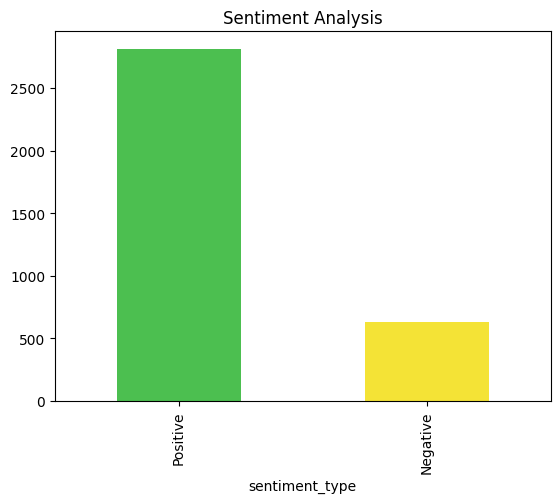

In [ ]:
# Displaying count of different types of sentiment of reviews here.
listings.sentiment_type.value_counts()
# Plotting a bar graph for different sentiments of reviews here.

colors = ['#4CBF50', '#F4E336', '#9EBF9F']
listings.sentiment_type.value_counts().plot(kind='bar', title="Sentiment Analysis", color=colors)
plt.show()


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
eng_stopwords = stopwords.words('english')
# Filter comments based on sentiment_type and sentiment_score for positive comments
positive_comments = reviews[(reviews['sentiment_type'] == 'Positive') & (reviews['sentiment_score'] >= 0.85)]
# Filter comments based on sentiment_type and sentiment_score for negative comments
negative_comments = reviews[(reviews['sentiment_type'] == 'Negative') & (reviews['sentiment_score'] <= 0.15)]

# Step 2: Count the Frequency by n-grams
def get_top_n_gram(corpus, gram, n):
    vec = CountVectorizer(ngram_range=(gram, gram), stop_words=eng_stopwords)
    bag_of_words = vec.fit_transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    return sorted(words_freq, key=lambda x: x[1], reverse=True)[:n]

# Get top grams for positive comments
positive_uni_grams = pd.DataFrame(get_top_n_gram(positive_comments['comments'], 1, 40), columns=['Words', 'count'])
positive_bi_grams = pd.DataFrame(get_top_n_gram(positive_comments['comments'], 2, 30), columns=['Words', 'count'])
positive_tri_grams = pd.DataFrame(get_top_n_gram(positive_comments['comments'], 3, 30), columns=['Words', 'count'])

# Get top grams for negative comments
negative_uni_grams = pd.DataFrame(get_top_n_gram(negative_comments['comments'], 1, 40), columns=['Words', 'count'])
negative_bi_grams = pd.DataFrame(get_top_n_gram(negative_comments['comments'], 2, 30), columns=['Words', 'count'])
negative_tri_grams = pd.DataFrame(get_top_n_gram(negative_comments['comments'], 3, 30), columns=['Words', 'count'])


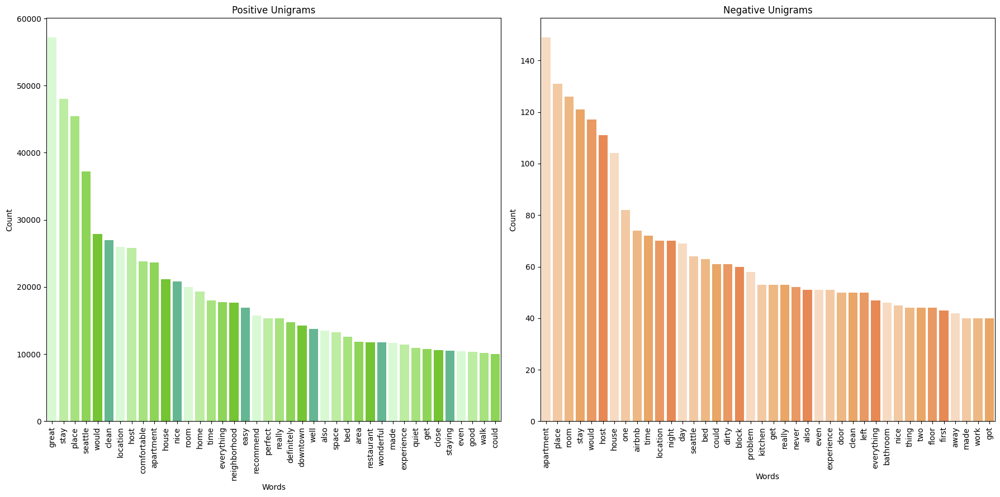

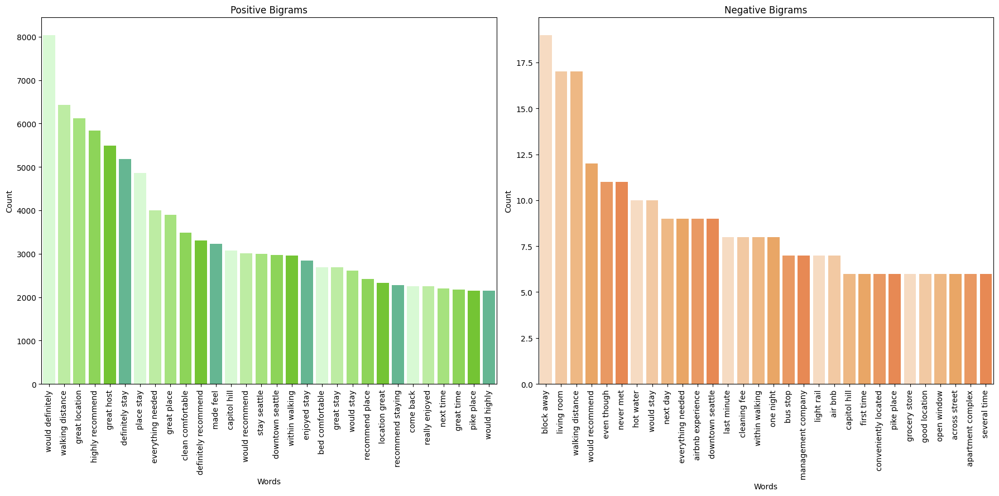

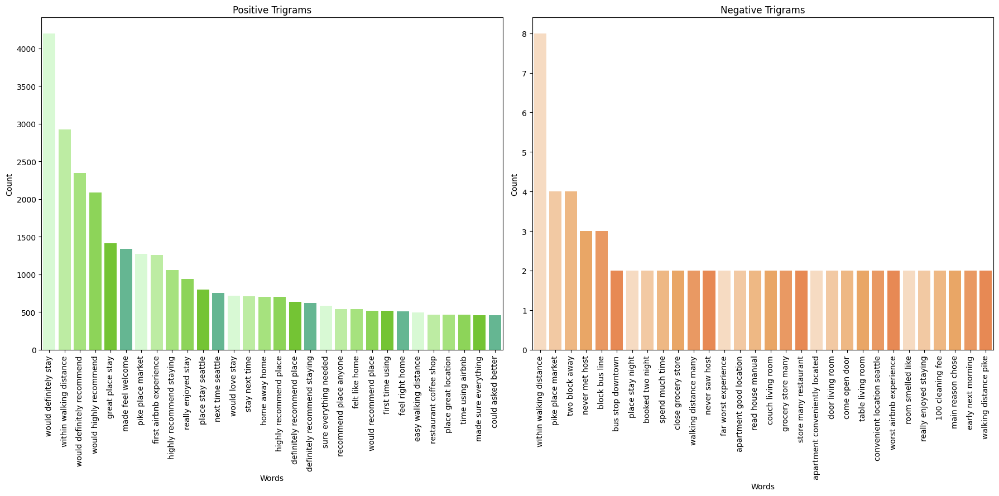

In [ ]:
# Define a function to plot grams side-by-side with different colors
def plot_side_by_side(data1, data2, title1, title2, palette1, palette2):
    fig, axs = plt.subplots(1, 2, figsize=(18, 9))

    # Plot data1
    sns.barplot(x='Words', y='count', data=data1, ax=axs[0], palette=palette1)
    axs[0].set_title(title1)
    axs[0].set_xticklabels(data1['Words'], rotation=90)
    axs[0].set_ylabel('Count')

    # Plot data2
    sns.barplot(x='Words', y='count', data=data2, ax=axs[1], palette=palette2)
    axs[1].set_title(title2)
    axs[1].set_xticklabels(data2['Words'], rotation=90)
    axs[1].set_ylabel('Count')

    plt.tight_layout()
    plt.show()

# Define shades of lime for positive palette
positive_palette = ['#D3FFCE', '#BAF897', '#A3F26E', '#8AE845', '#71DC1C', '#58C393']

# Define shades of orange for negative palette
negative_palette = ['#FFDAB9', '#FFC996', '#FFB773', '#FFA650', '#FF944D', '#FF823B']

# Plot side-by-side unigrams with different colors
plot_side_by_side(positive_uni_grams, negative_uni_grams, 'Positive Unigrams', 'Negative Unigrams', positive_palette, negative_palette)

# Plot side-by-side bigrams with different colors
plot_side_by_side(positive_bi_grams, negative_bi_grams, 'Positive Bigrams', 'Negative Bigrams', positive_palette, negative_palette)

# Plot side-by-side trigrams with different colors
plot_side_by_side(positive_tri_grams, negative_tri_grams, 'Positive Trigrams', 'Negative Trigrams', positive_palette, negative_palette)


In [ ]:
# Create frequency distribution for positive comments
positive_comments = ' '.join([text.lower() for text in positive_comments['comments']])
positive_comments_dist = nltk.FreqDist(word for word in word_tokenize(positive_comments))

# Create frequency distribution for negative comments
negative_comments = ' '.join([text.lower() for text in negative_comments['comments']])
negative_comments_dist = nltk.FreqDist(word for word in word_tokenize(negative_comments))

# Print frequency distributions
print("Frequency distribution for positive comments:")
print(positive_comments_dist)

print("\nFrequency distribution for negative comments:")
print(negative_comments_dist)


Frequency distribution for positive comments:
<FreqDist with 37476 samples and 2749919 outcomes>

Frequency distribution for negative comments:
<FreqDist with 3344 samples and 14302 outcomes>


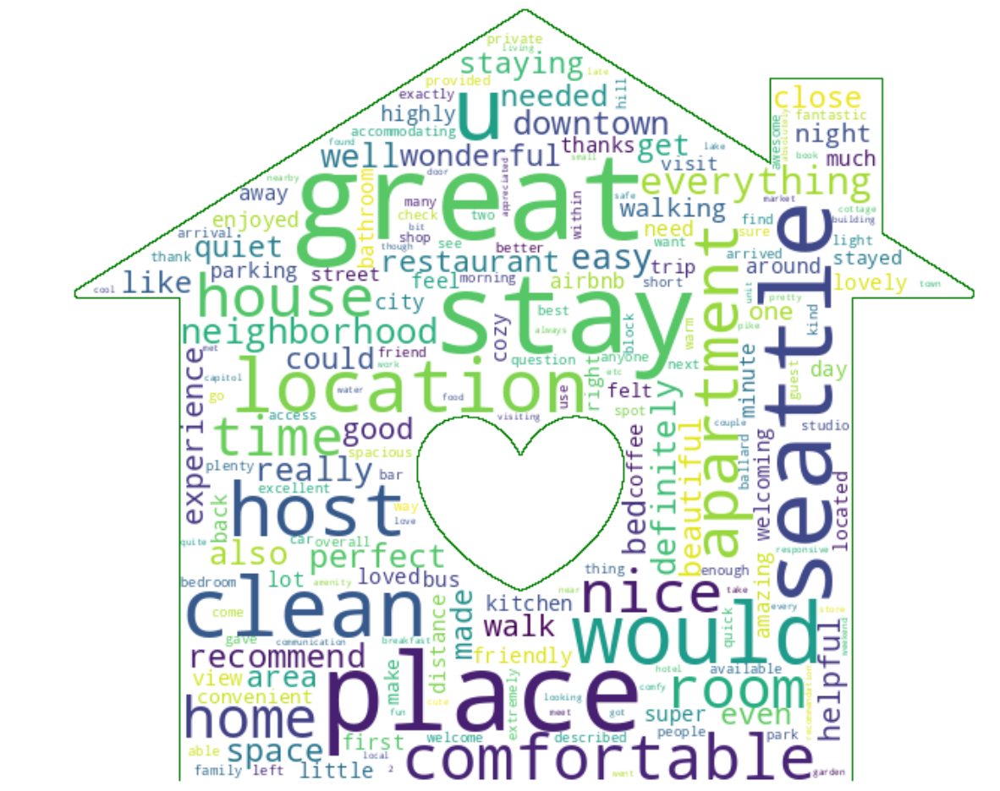

In [ ]:
# Import mask image for wordcloud
house_mask = np.array(Image.open("house3.png"))

# Create WordCloud for positive comments distribution
wordcloud = WordCloud(width=800, height=500, background_color='white', max_font_size=80,
                      stopwords=set(), random_state=42, mask=house_mask,contour_width=0.5,contour_color='Green')
wordcloud.generate_from_frequencies(positive_comments_dist)

# Plot the WordCloud
plt.figure(figsize=(15, 15))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

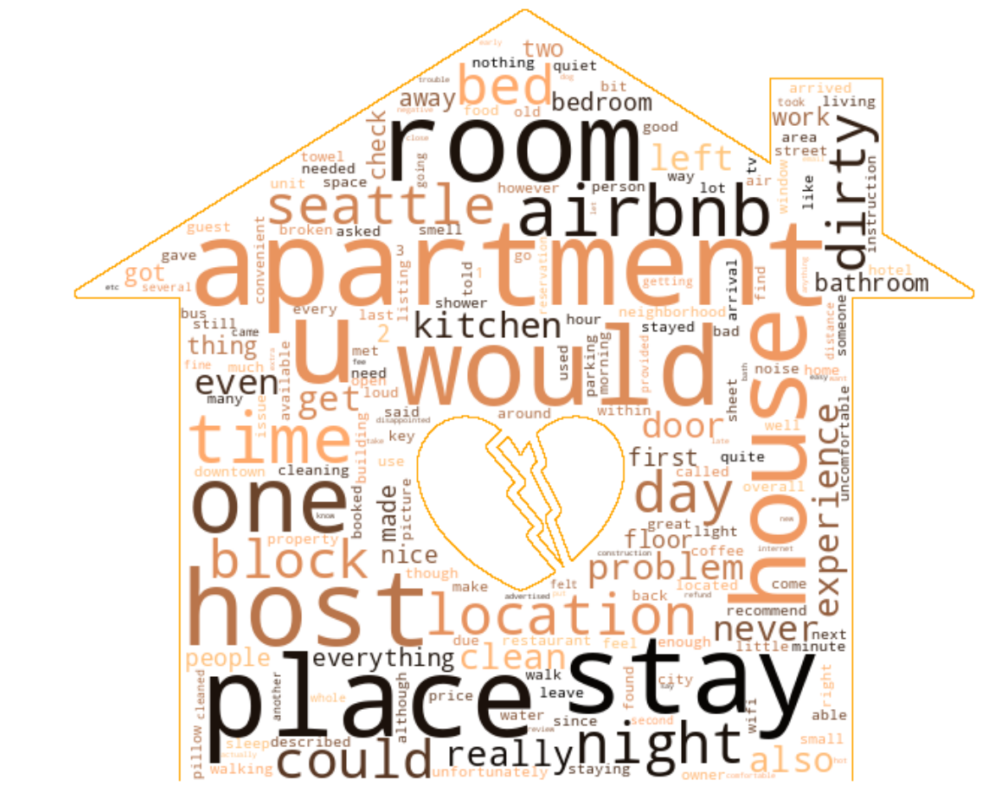

In [ ]:
house_mask2 = np.array(Image.open("house4.png"))

wordcloud = WordCloud(width=800, height=500,background_color='white', max_font_size=80, colormap="copper", stopwords=set(),random_state=42,mask=house_mask2,contour_width=0.5,contour_color='orange')
wordcloud.generate_from_frequencies(negative_comments_dist)

plt.figure(figsize=(15, 15))
plt.imshow(wordcloud,interpolation="bilinear")
plt.axis('off')
plt.show()


In [ ]:
# Group the reviews dataset by 'listing_id' and count the number of reviews for each listing
reviews_count = reviews.groupby('listing_id').size().reset_index(name='num_reviews')
# Sort the DataFrame by the number of reviews in descending order
reviews_count_sorted = reviews_count.sort_values(by='num_reviews', ascending=False)
reviews_count_sorted

,listing_id,num_reviews
104,208356,461
162,365550,459
28,25002,402
35,47196,350
59,92835,318
...,...,...
675,2061463,1
1703,5683765,1
2833,8387068,1
2367,7415378,1


In [ ]:
# Merge the reviews_count_sorted DataFrame with the listings DataFrame on the 'id' column
merged_data = pd.merge(reviews_count_sorted, listings, left_on='listing_id', right_on='id', how='inner')
# Drop rows where review_scores_rating is missing
merged_data.dropna(subset=['review_scores_rating'], inplace=True)
merged_data = merged_data[['listing_id', 'num_reviews', 'id', 'review_scores_rating',
                           'review_scores_accuracy', 'review_scores_cleanliness',
                           'review_scores_checkin', 'review_scores_communication',
                           'review_scores_location', 'review_scores_value','price']]
merged_data = merged_data.loc[:, ~merged_data.columns.duplicated()]
merged_data = merged_data.sort_values(by='review_scores_rating', ascending=False)

# Display the sorted DataFrame
merged_data


,listing_id,num_reviews,id,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price
2874,10248139,1,10248139,100.0,0.0,10.0,0.0,10.0,0.0,0.0,22.0
2219,8703208,4,8703208,100.0,10.0,10.0,10.0,10.0,10.0,10.0,119.0
2215,8423118,4,8423118,100.0,9.0,10.0,10.0,10.0,10.0,10.0,96.0
2210,8743202,4,8743202,100.0,10.0,10.0,10.0,10.0,10.0,10.0,55.0
2197,6348159,4,6348159,100.0,10.0,10.0,10.0,10.0,10.0,10.0,60.0
...,...,...,...,...,...,...,...,...,...,...,...
2713,4887845,1,4887845,0.0,0.0,0.0,0.0,0.0,0.0,0.0,235.0
2612,9012948,1,9012948,0.0,0.0,0.0,0.0,0.0,0.0,0.0,130.0
2785,3126153,1,3126153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,115.0
2651,186328,1,186328,0.0,0.0,0.0,0.0,0.0,0.0,0.0,250.0


In [ ]:
# Select the columns of interest
columns_of_interest = ['review_scores_rating', 'review_scores_accuracy',
                       'review_scores_cleanliness', 'review_scores_checkin',
                       'review_scores_communication', 'review_scores_location',
                       'review_scores_value']

# Generate descriptive statistics
descriptive_stats = merged_data[columns_of_interest].describe()

# Display the descriptive statistics
descriptive_stats


,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,2875.000000,2875.000000,2875.000000,2875.000000,2875.000000,2875.000000,2875.000000
mean,93.998957,9.543304,9.471652,9.690087,9.737043,9.517217,9.369043
std,9.933232,1.175214,1.180690,1.144541,1.023592,1.101005,1.173745
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,93.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000
50%,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
75%,99.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
max,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


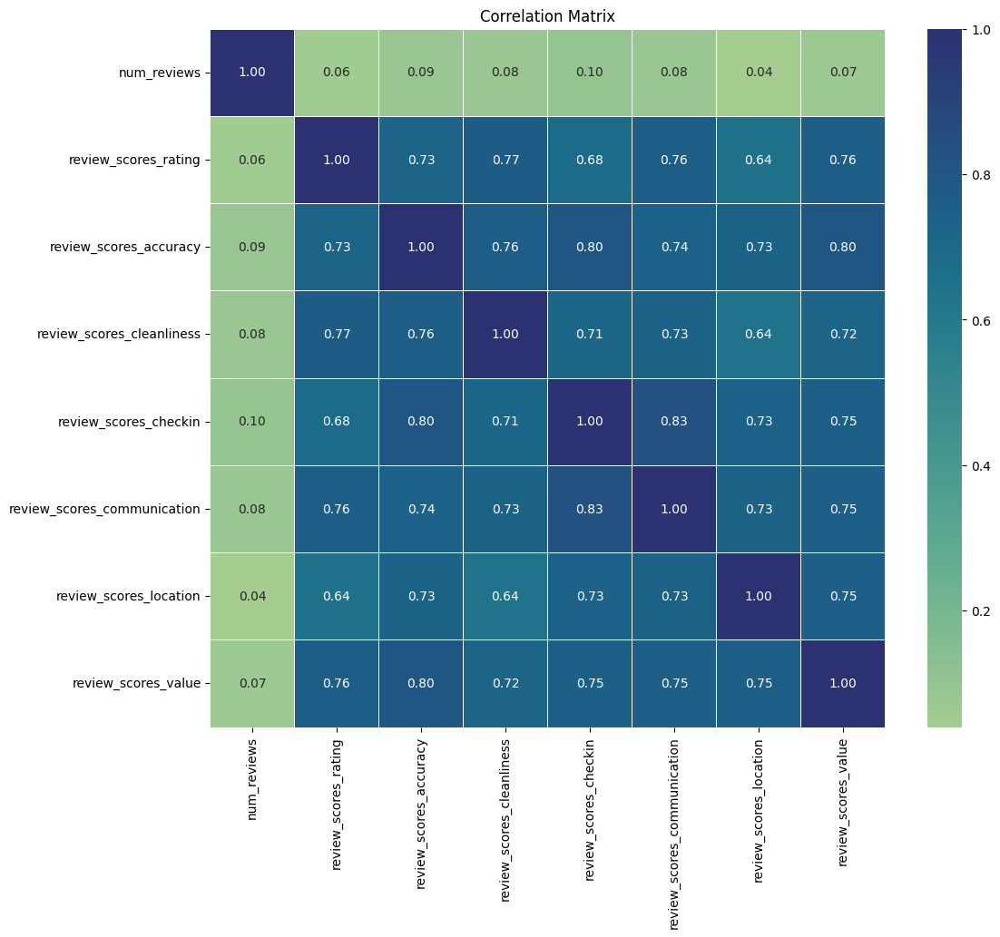

In [ ]:
# Drop the columns 'id', 'listing_id', and 'price' from the merged_data DataFrame
filtered_data = merged_data.drop(columns=['id', 'listing_id', 'price'])

# Calculate the correlation matrix
correlation_matrix = filtered_data.corr()

# Plot the correlation matrix using seaborn heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='crest', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In [ ]:
# Display the sorted DataFrame
# Filter the merged_calendar DataFrame for price between 90 and 100
merged_data= merged_data[(merged_data['price'] >= 100) & (merged_data['price'] <= 120)]
merged_data= merged_data[(merged_data['review_scores_rating'] > 0) & (merged_data['review_scores_rating'] <= 100)]
len(merged_data)

366

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

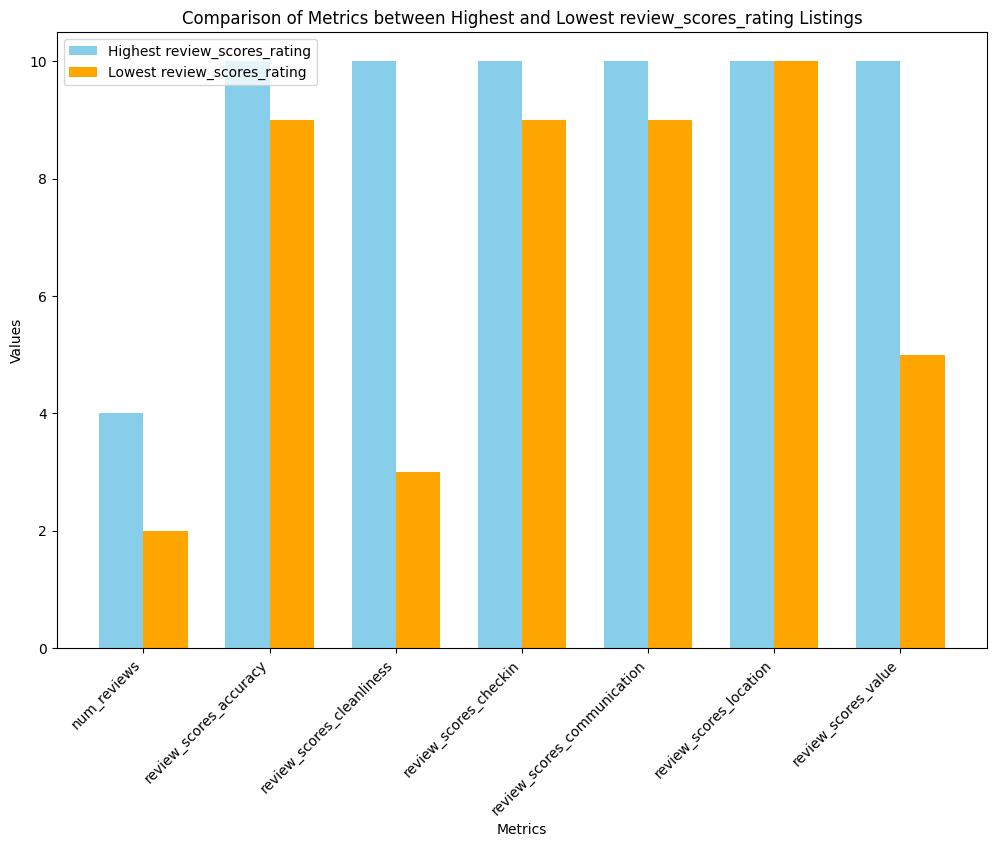

In [ ]:


# Find the index of the row with the highest review_scores_rating
highest_review_rating_idx = merged_data['review_scores_rating'].idxmax()

# Get the corresponding listing ID
highest_review_rating_listing_id = merged_data.loc[highest_review_rating_idx, 'listing_id']

# Find the index of the row with the lowest review_scores_rating
lowest_review_rating_idx = merged_data['review_scores_rating'].idxmin()

# Get the corresponding listing ID
lowest_review_rating_listing_id = merged_data.loc[lowest_review_rating_idx, 'listing_id']

# Extract the relevant columns for comparison, excluding the listing ID
columns_to_compare = ['num_reviews','review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value']
# Extract the relevant columns for comparison, excluding the listing ID
columns_to_compare = ['num_reviews','review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value']

# Get the values for the highest and lowest listings
highest_values = merged_data.loc[highest_review_rating_idx, columns_to_compare].values
lowest_values = merged_data.loc[lowest_review_rating_idx, columns_to_compare].values

# Define the labels for the bars
labels = columns_to_compare

# Define the index for the bars
index = np.arange(len(labels))

# Define the width of the bars
bar_width = 0.35

# Create the grouped bar plot
plt.figure(figsize=(12, 8))
plt.bar(index - bar_width/2, highest_values, bar_width, color='skyblue', label='Highest review_scores_rating')
plt.bar(index + bar_width/2, lowest_values, bar_width, color='orange', label='Lowest review_scores_rating')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Metrics between Highest and Lowest review_scores_rating Listings')
plt.xticks(index, labels, rotation=45, ha='right')
plt.legend()
plt.tight_layout


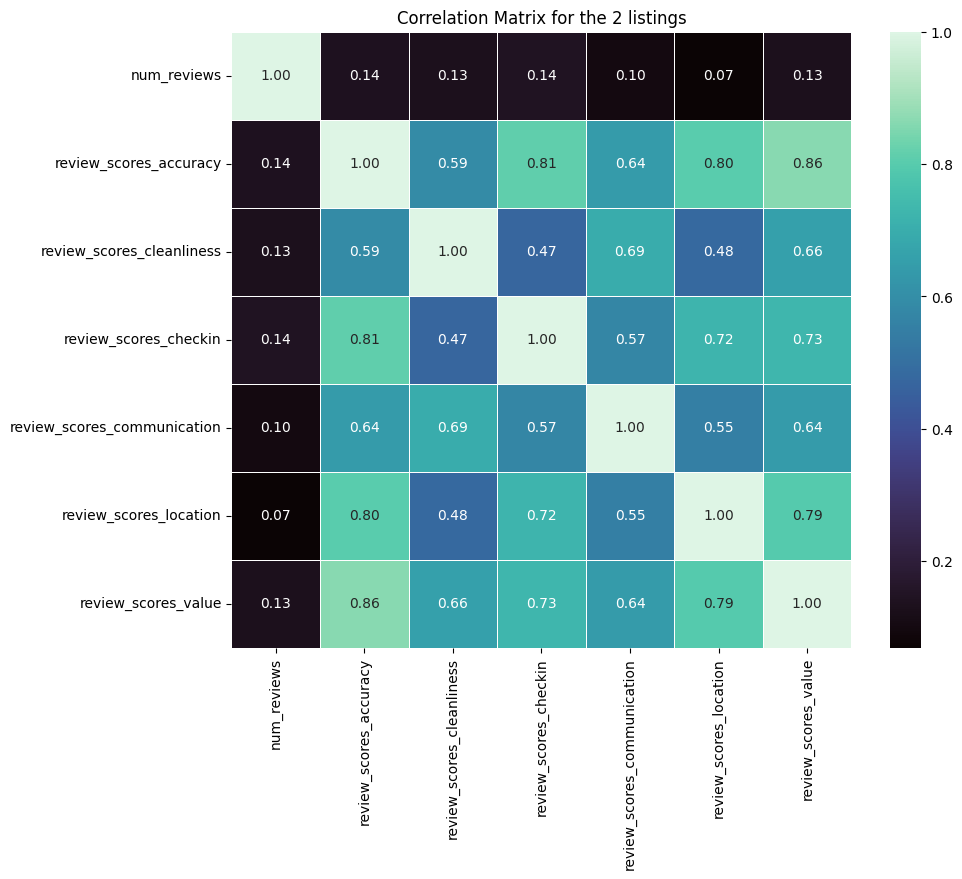

In [ ]:
import seaborn as sns

# Select the relevant columns
selected_columns = ['num_reviews','review_scores_accuracy', 'review_scores_cleanliness',
                    'review_scores_checkin', 'review_scores_communication',
                    'review_scores_location', 'review_scores_value']

# Create a subset of the data with only the selected columns
subset_data = merged_data[selected_columns]

# Calculate the correlation matrix
correlation_matrix = subset_data.corr()

# Plot the correlation matrix using seaborn heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='mako', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix for the 2 listings')
plt.show()




# Question 1: Predictive Analysis

Is the review score rating of a listing influenced by the type, the number of reviews it receives and the price of listing?

In [ ]:
listings.columns


Index(['id', 'name', 'summary', 'longitude', 'latitude', 'space',
       'description', 'instant_bookable', 'neighborhood_overview',
       'neighbourhood_cleansed', 'host_id', 'host_name', 'host_since',
       'calculated_host_listings_count', 'host_response_time', 'street',
       'zipcode', 'smart_location', 'review_scores_rating', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'reviews_per_month', 'monthly_price', 'weekly_price', 'amenities',
       'cancellation_policy', 'number_of_reviews', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'price',
       'sentiment_score', 'sentiment_type'],
      dtype='object')

In [ ]:
listings['sentiment_type'] = label_encoder.fit_transform(listings['sentiment_type'])
listings

,id,name,summary,longitude,latitude,space,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,price,sentiment_score,sentiment_type
0,241032,Stylish Queen Anne Apartment,0,-122.371025,47.636289,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,0,0,West Queen Anne,...,95.0,10.0,10.0,10.0,10.0,9.0,10.0,85.0,0.90,1
1,953595,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,-122.365667,47.639123,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,0,"Queen Anne is a wonderful, truly functional vi...",West Queen Anne,...,96.0,10.0,10.0,10.0,10.0,10.0,10.0,150.0,0.89,1
2,3308979,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,-122.369483,47.629724,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,0,Upper Queen Anne is a charming neighborhood fu...,West Queen Anne,...,97.0,10.0,10.0,10.0,10.0,10.0,10.0,975.0,0.89,1
4,278830,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,-122.372471,47.632918,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,0,We are in the beautiful neighborhood of Queen ...,West Queen Anne,...,92.0,9.0,9.0,10.0,10.0,9.0,9.0,450.0,0.84,1
5,5956968,Private unit in a 1920s mansion,We're renting out a small private unit of one ...,-122.366174,47.630525,If you include a bit of your background in you...,We're renting out a small private unit of one ...,0,This part of Queen Anne has wonderful views an...,West Queen Anne,...,95.0,10.0,10.0,10.0,10.0,10.0,10.0,120.0,0.95,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3812,3383329,OF THE TREE & CLOUDS. KID FRIENDLY!,"Of the Tree & Clouds' ""Roots"" apartment is 8 b...",-122.358124,47.654516,"The 1-bedroom, ground-floor Roots apartment is...","Of the Tree & Clouds' ""Roots"" apartment is 8 b...",1,It's taken me a while to figure out why Fremon...,Fremont,...,96.0,10.0,10.0,10.0,10.0,9.0,10.0,95.0,0.94,1
3813,8101950,3BR Mountain View House in Seattle,Our 3BR/2BA house boasts incredible views of t...,-122.359170,47.664295,"Our 3BR/2BA house bright, stylish, and wheelch...",Our 3BR/2BA house boasts incredible views of t...,0,We're located near lots of family fun. Woodlan...,Fremont,...,80.0,8.0,10.0,4.0,8.0,10.0,8.0,359.0,0.00,0
3814,8902327,Portage Bay View!-One Bedroom Apt,800 square foot 1 bedroom basement apartment w...,-122.318309,47.649552,This space has a great view of Portage Bay wit...,800 square foot 1 bedroom basement apartment w...,0,The neighborhood is a quiet oasis that is clos...,Portage Bay,...,100.0,10.0,10.0,10.0,10.0,10.0,10.0,79.0,0.94,1
3815,10267360,Private apartment view of Lake WA,"Very comfortable lower unit. Quiet, charming m...",-122.240607,47.508453,0,"Very comfortable lower unit. Quiet, charming m...",0,0,Rainier Beach,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,93.0,0.00,0


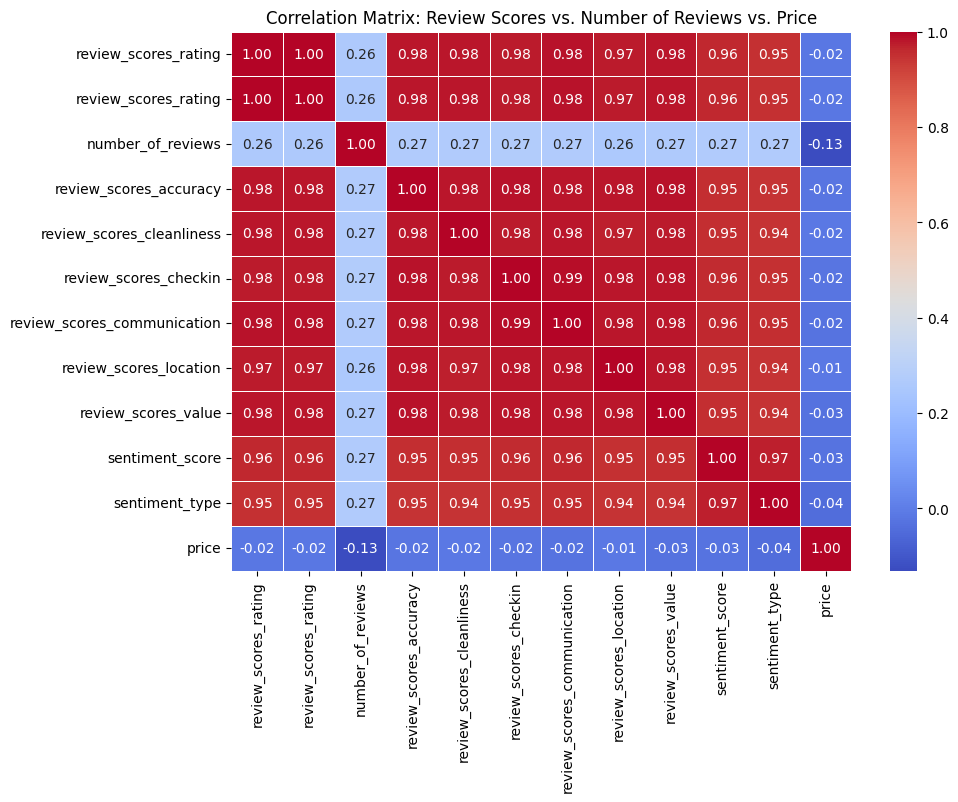

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation matrix
correlation_matrix = listings[['review_scores_rating', 'number_of_reviews', 'review_scores_accuracy',
                         'review_scores_cleanliness', 'review_scores_checkin',
                         'review_scores_communication', 'review_scores_location',
                         'review_scores_value', 'sentiment_score', 'sentiment_type', 'price']].corr()

plt.figure(figsize=(10, 7))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix: Review Scores vs. Number of Reviews vs. Price')
plt.show()

In [ ]:

print("Length of review_scores_rating column:", len(listings['review_scores_rating']))
print("Length of price column:", len(listings['price']))


Length of review_scores_rating column: 3439
Length of price column: 3439


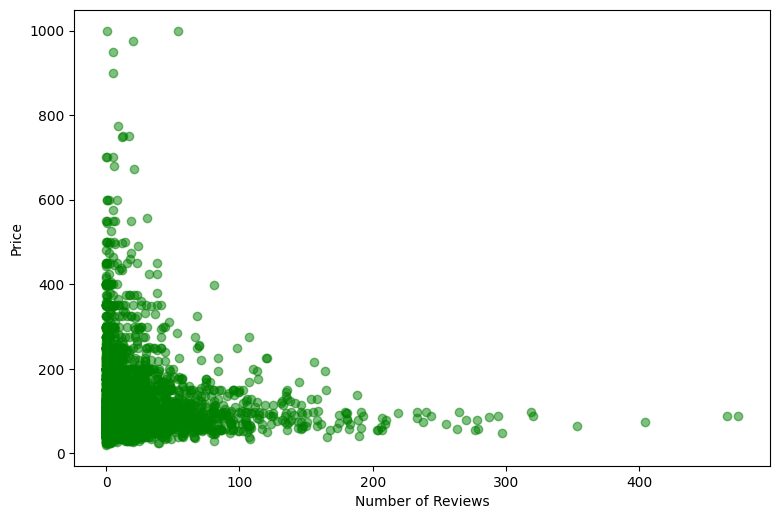

In [ ]:
# Scatter plots
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 2)
plt.scatter(listings['number_of_reviews'], listings['price'], alpha=0.5, color ='green')
# plt.title('Number of Reviews vs. Price')
plt.xlabel('Number of Reviews')
plt.ylabel('Price')

plt.tight_layout()
plt.show()

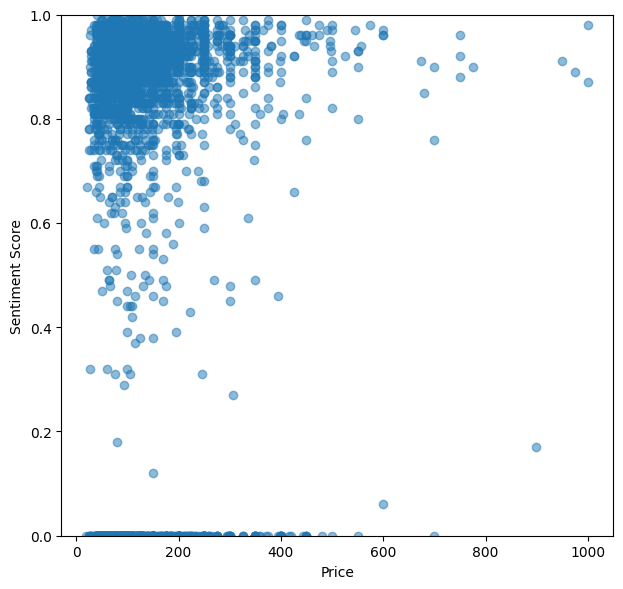

In [ ]:
plt.figure(figsize=(12, 6))

# Scatter plot for Review Scores Rating vs. Sentiment Score
plt.subplot(1, 2, 2)
plt.scatter(listings['price'], listings['sentiment_score'], alpha=0.5)
# plt.title('Price  vs. Sentiment Score')
plt.xlabel('Price')
plt.ylabel('Sentiment Score')

# Set the y-axis range to be between 0 and 1
plt.ylim(0, 1)

plt.tight_layout()
plt.show()



In [ ]:
!pip install treeinterpreter

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Define the features and target variable
features = ['number_of_reviews', 'sentiment_score', 'sentiment_type', 'price']
target = 'review_scores_rating'

# Extract features and target variable
X = listings[features]
y = listings[target]

# Initialize lists to store MSE, RMSE, MAE, and R2 values
train_mse_values = []
test_mse_values = []
train_rmse_values = []
test_rmse_values = []
train_mae_values = []
test_mae_values = []
train_r2_values = []
test_r2_values = []

# Define the range of training set sizes
train_sizes = np.arange(0.1, 1.0, 0.1)

# Iterate over different training set sizes
for size in train_sizes:
    # Split the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1-size, random_state=42)

    # Initialize and fit the linear regression model
    linear_reg_model = LinearRegression()
    linear_reg_model.fit(X_train, y_train)

    # Predict on the training and test sets
    train_predictions = linear_reg_model.predict(X_train)
    test_predictions = linear_reg_model.predict(X_test)

    # Calculate MSE, RMSE, MAE, and R2 for training and test sets
    train_mse = mean_squared_error(y_train, train_predictions)
    test_mse = mean_squared_error(y_test, test_predictions)
    train_rmse = np.sqrt(train_mse)
    test_rmse = np.sqrt(test_mse)
    train_mae = mean_absolute_error(y_train, train_predictions)
    test_mae = mean_absolute_error(y_test, test_predictions)
    train_r2 = r2_score(y_train, train_predictions)
    test_r2 = r2_score(y_test, test_predictions)

    # Append scores to lists
    train_mse_values.append(train_mse)
    test_mse_values.append(test_mse)
    train_rmse_values.append(train_rmse)
    test_rmse_values.append(test_rmse)
    train_mae_values.append(train_mae)
    test_mae_values.append(test_mae)
    train_r2_values.append(train_r2)
    test_r2_values.append(test_r2)

# Specify the index of the row you want to predict
row_index = np.random.randint(0, len(listings))  # Random row index

# Extract features from the DataFrame at the given index
features = X.iloc[row_index].values.reshape(1, -1)

# Predict review_scores_rating
predicted_rating = linear_reg_model.predict(features)

# Clip predicted rating to ensure it falls within the range of 0 to 100
predicted_rating = np.clip(predicted_rating, 0, 100)

# Print the actual and predicted review_scores_rating
actual_rating = y.iloc[row_index]
print("Actual Review Scores Rating:", actual_rating[0])  # Just print the scalar value directly
print("Predicted Review Scores Rating:", predicted_rating[0][0])


Actual Review Scores Rating: 97.0
Predicted Review Scores Rating: 97.592138552424


In [ ]:
feature_names = X.columns.tolist()

In [ ]:
# Ensure coefficients are in correct format
coefficients = linear_reg_model.coef_.flatten()

# Iterate over the coefficients and feature names to print feature contributions
print("Feature contributions:")
print("-------------------------")
for feature_name, coefficient in zip(feature_names, coefficients):
    print(f"{feature_name}: {float(coefficient):.4f}")


Feature contributions:
-------------------------
number_of_reviews: 0.0021
sentiment_score: 67.3398
sentiment_type: 29.7501
price: 0.0043


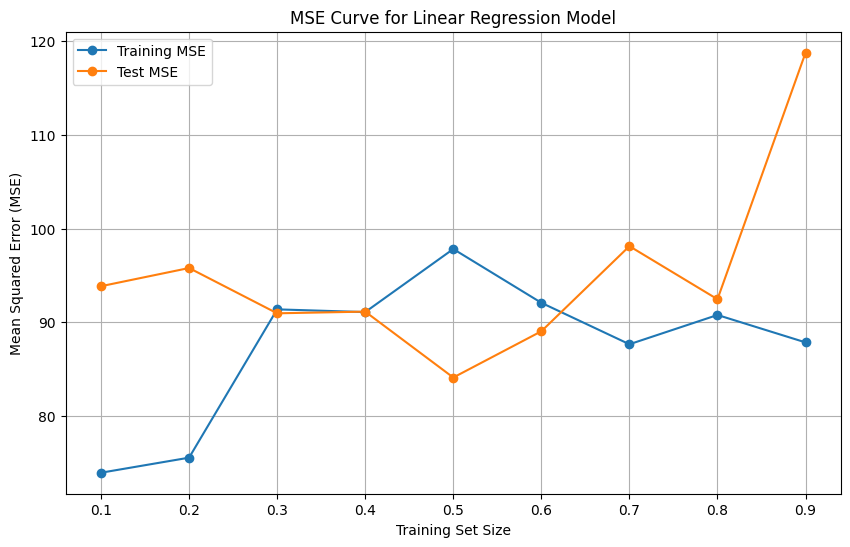

In [ ]:
# Plot MSE curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mse_values, label='Training MSE', marker='o')
plt.plot(train_sizes, test_mse_values, label='Test MSE', marker='o')
plt.title('MSE Curve for Linear Regression Model')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error (MSE)')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:

# Print the metrics
print("Mean Absolute Error (MAE):", test_mae)
print("Mean Squared Error (MSE):", test_mse)
print("Root Mean Squared Error (RMSE):", test_rmse)
print("R-squared (R2) Error:", test_r2)


Mean Absolute Error (MAE): 4.69085751378898
Mean Squared Error (MSE): 118.77621414157629
Root Mean Squared Error (RMSE): 10.898450079785487
R-squared (R2) Error: 0.9069855297706344


#Question 2: Predictive Analysis

What is the seasonal pattern of booking rates in Seattle, and are there any peak periods of demand or limited availability that hosts should be aware of?  

In [ ]:
import pandas as pd

calendar = pd.read_csv('calendar.csv')
listings = pd.read_csv('listings.csv')

In [ ]:
listings.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'thumbnail_url', 'medium_url', 'picture_url',
       'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_since',
       'host_location', 'host_about', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'street', 'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', '

In [ ]:
# Importing all the necessary packages here.

import pandas as pd
import seaborn as sns
import numpy as np
import folium
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from folium.plugins import MarkerCluster
from nltk.corpus import stopwords
from sklearn.cluster import KMeans
from nltk.stem import WordNetLemmatizer
import nltk
from sklearn.feature_extraction.text import CountVectorizer
import geopy.distance
from folium.plugins import HeatMap
from PIL import Image
import string
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from wordcloud import WordCloud, STOPWORDS
import re
from nltk.tokenize import word_tokenize

In [ ]:
# Dropped some unnecessary columns here.

listings = listings[['id','name','summary','longitude','latitude','space','description','instant_bookable','neighborhood_overview','neighbourhood_cleansed','host_id','host_name','host_since','calculated_host_listings_count','host_response_time','street', 'zipcode','smart_location','review_scores_rating','property_type','room_type','accommodates','bathrooms','bedrooms','beds','reviews_per_month','monthly_price','weekly_price','amenities','cancellation_policy','number_of_reviews','review_scores_rating','review_scores_accuracy', 'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication','review_scores_location', 'review_scores_value','price', 'minimum_nights',
       'maximum_nights', 'calendar_updated',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'calendar_last_scraped']]

In [ ]:
# Replacing all missing data with zeros here.

listings.fillna(0, inplace=True)

# This column values were f and y, so performing encoding here.

label_encoder = LabelEncoder()
listings['instant_bookable'] = label_encoder.fit_transform(listings['instant_bookable'])
# Replace 0 with "Not Mentioned" in the property_type column
listings.loc[listings['property_type'] == 0, 'property_type'] = 'Not Mentioned'

# One-hot encoding for all columns with categorical data is done here.

boolean_columns = listings.select_dtypes(include='bool').columns
for col in boolean_columns:
    listings[col] = listings[col].astype(int)

# Extracting monthly_price and price columns from listings dataset here.

price_arr = listings['price']
monthly_price_arr = listings['monthly_price']
weekly_price_arr = listings['weekly_price']

# Removing non-numerical($) symbols here.
clean_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in price_arr]
clean_monthly_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in monthly_price_arr]
clean_weekly_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in weekly_price_arr]

# Replacing cleaned data in the listings dataset here.
listings['price'] = clean_prices
listings['monthly_price'] = clean_monthly_prices
listings['weekly_price'] = clean_weekly_prices

In [ ]:
# Giving certain conditions to remove unnecessary listings here.

conditions = (listings['id'] > 0) & \
              (listings['bedrooms'] > 0) & \
              (listings['accommodates'] > 0) & \
              (listings['price'] > 0) & \
              (listings['beds'] > 0)

# Applying said conditions to listings dataset here.

listings = listings[conditions]
listings.head(n=5)

,id,name,summary,longitude,latitude,space,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,...,review_scores_value,price,minimum_nights,maximum_nights,calendar_updated,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped
0,241032,Stylish Queen Anne Apartment,0,-122.371025,47.636289,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,0,0,West Queen Anne,...,10.0,85.0,1,365,4 weeks ago,14,41,71,346,1/4/16
1,953595,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,-122.365667,47.639123,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,0,"Queen Anne is a wonderful, truly functional vi...",West Queen Anne,...,10.0,150.0,2,90,today,13,13,16,291,1/4/16
2,3308979,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,-122.369483,47.629724,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,0,Upper Queen Anne is a charming neighborhood fu...,West Queen Anne,...,10.0,975.0,4,30,5 weeks ago,1,6,17,220,1/4/16
4,278830,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,-122.372471,47.632918,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,0,We are in the beautiful neighborhood of Queen ...,West Queen Anne,...,9.0,450.0,1,1125,7 weeks ago,30,60,90,365,1/4/16
5,5956968,Private unit in a 1920s mansion,We're renting out a small private unit of one ...,-122.366174,47.630525,If you include a bit of your background in you...,We're renting out a small private unit of one ...,0,This part of Queen Anne has wonderful views an...,West Queen Anne,...,10.0,120.0,1,6,2 weeks ago,0,0,27,302,1/4/16


In [ ]:
label_encoder = LabelEncoder()
calendar.isna().sum()

price_arr = calendar['price']

# Removing non-numerical($) symbols here.
clean_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in price_arr]

# Replacing cleaned data in the listings dataset here.
calendar['price'] = clean_prices

calendar['available'] = label_encoder.fit_transform(calendar['available'])
calendar.fillna(0, inplace=True)

In [ ]:
# Merge calendar and listings datasets on the 'listing_id' column
merged_calendar = pd.merge(calendar, listings[['id','review_scores_rating', 'minimum_nights',
       'maximum_nights',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365']], left_on='listing_id', right_on='id', how='inner')
# Drop duplicate columns
merged_calendar = merged_calendar.loc[:, ~merged_calendar.columns.duplicated()]

merged_calendar

,listing_id,date,available,price,id,review_scores_rating,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365
0,241032,2016-01-04,1,85.0,241032,95.0,1,365,14,41,71,346
1,241032,2016-01-05,1,85.0,241032,95.0,1,365,14,41,71,346
2,241032,2016-01-06,0,0.0,241032,95.0,1,365,14,41,71,346
3,241032,2016-01-07,0,0.0,241032,95.0,1,365,14,41,71,346
4,241032,2016-01-08,0,0.0,241032,95.0,1,365,14,41,71,346
...,...,...,...,...,...,...,...,...,...,...,...,...
1255230,10208623,2016-12-29,0,0.0,10208623,0.0,1,1125,7,7,7,7
1255231,10208623,2016-12-30,0,0.0,10208623,0.0,1,1125,7,7,7,7
1255232,10208623,2016-12-31,0,0.0,10208623,0.0,1,1125,7,7,7,7
1255233,10208623,2017-01-01,0,0.0,10208623,0.0,1,1125,7,7,7,7


In [ ]:
# Extract month from the 'date' column
merged_calendar['year'] = pd.DatetimeIndex(merged_calendar['date']).year
# Extract month from the 'date' column
merged_calendar['month'] = pd.DatetimeIndex(merged_calendar['date']).month
filtered_calendar = merged_calendar[merged_calendar['available'] != 0]

filtered_calendar

,listing_id,date,available,price,id,review_scores_rating,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,year,month
0,241032,2016-01-04,1,85.0,241032,95.0,1,365,14,41,71,346,2016,1
1,241032,2016-01-05,1,85.0,241032,95.0,1,365,14,41,71,346,2016,1
9,241032,2016-01-13,1,85.0,241032,95.0,1,365,14,41,71,346,2016,1
10,241032,2016-01-14,1,85.0,241032,95.0,1,365,14,41,71,346,2016,1
14,241032,2016-01-18,1,85.0,241032,95.0,1,365,14,41,71,346,2016,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254872,10208623,2016-01-06,1,87.0,10208623,0.0,1,1125,7,7,7,7,2016,1
1254873,10208623,2016-01-07,1,87.0,10208623,0.0,1,1125,7,7,7,7,2016,1
1254876,10208623,2016-01-10,1,87.0,10208623,0.0,1,1125,7,7,7,7,2016,1
1254877,10208623,2016-01-11,1,87.0,10208623,0.0,1,1125,7,7,7,7,2016,1


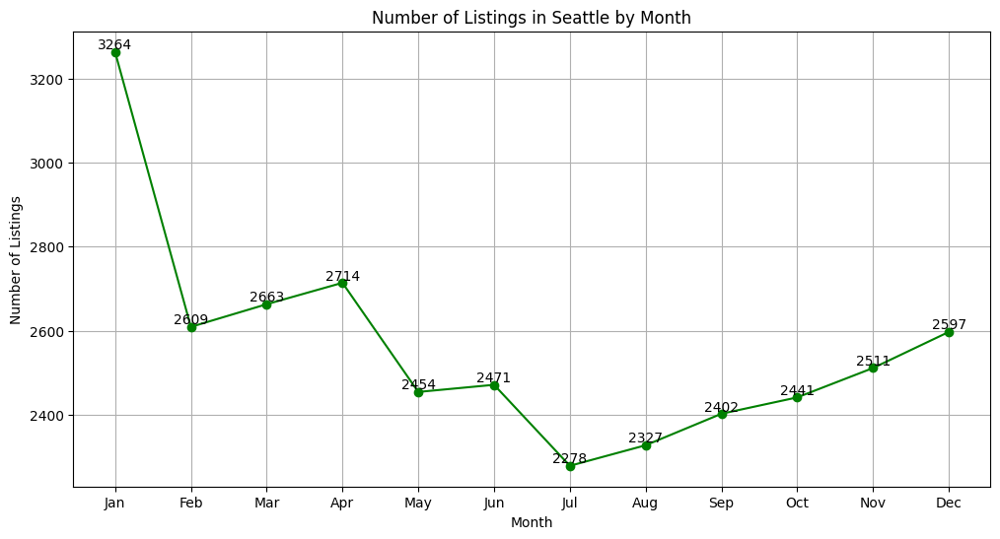

In [ ]:
# Create pivot table based on the extracted month
monthly_number_of_listings = filtered_calendar.groupby('month')['listing_id'].nunique().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(monthly_number_of_listings['month'], monthly_number_of_listings['listing_id'], marker='o', color='green')
plt.title('Number of Listings in Seattle by Month')
plt.xlabel('Month')
plt.ylabel('Number of Listings')
plt.xticks(np.arange(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)

# Add number of listings values as annotations
for i, num_listings in enumerate(monthly_number_of_listings['listing_id']):
    plt.text(monthly_number_of_listings['month'][i], num_listings, str(num_listings), ha='center', va='bottom')

plt.show()

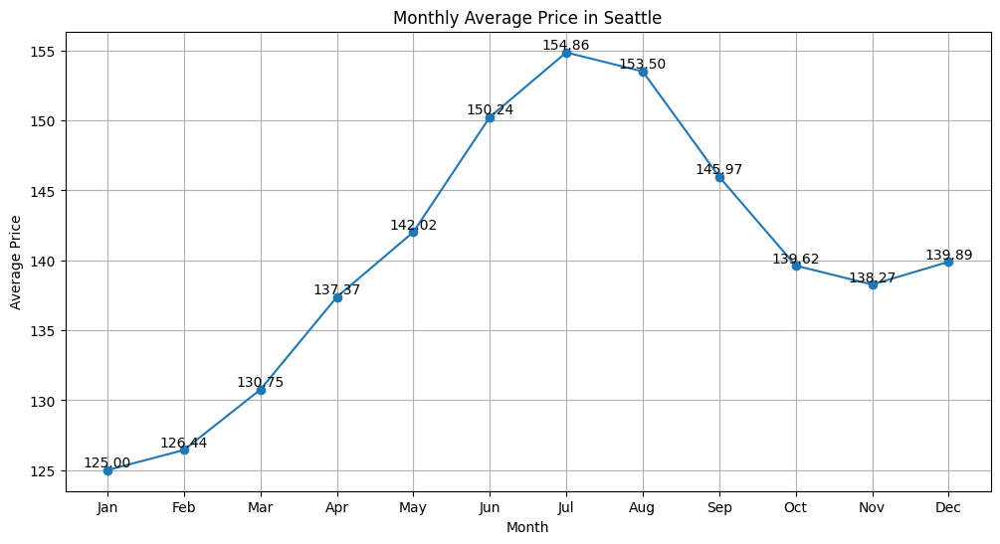

In [ ]:

monthly_avg_price = filtered_calendar.groupby('month')['price'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(monthly_avg_price['month'], monthly_avg_price['price'], marker='o')
plt.title('Monthly Average Price in Seattle')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.xticks(np.arange(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)

# Add price values as annotations
for i, price in enumerate(monthly_avg_price['price']):
    plt.text(monthly_avg_price['month'][i], price, f'{price:.2f}', ha='center', va='bottom')

plt.show()

In [ ]:
import pandas as pd

# Calculate average price for each month
months_price = pd.pivot_table(data=filtered_calendar[filtered_calendar['year'] == 2016], index='month', values='price', aggfunc='mean').reset_index()
months_price.rename(columns={'price': 'average_price'}, inplace=True)

# Count number of listings for each month
months_listings = filtered_calendar[filtered_calendar['year'] == 2016].groupby('month')['listing_id'].nunique().reset_index()
months_listings.rename(columns={'listing_id': 'number_of_listings'}, inplace=True)

# Merge the two DataFrames on the 'month' column
months = pd.merge(months_price, months_listings, on='month')

# Print the resulting DataFrame
print(months)


    month  average_price  number_of_listings
0       1     123.623473                2592
1       2     126.438043                2609
2       3     130.754002                2663
3       4     137.373801                2714
4       5     142.016376                2454
5       6     150.238449                2471
6       7     154.863311                2278
7       8     153.502980                2327
8       9     145.971163                2402
9      10     139.619235                2441
10     11     138.268597                2511
11     12     139.892513                2597


In [ ]:
# Calculate the correlation coefficient
correlation_matrix = months[['average_price', 'number_of_listings']].corr()

# Print the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Print the correlation coefficient between price and number of listings
correlation_coefficient = correlation_matrix.loc['average_price', 'number_of_listings']
print("\nCorrelation Coefficient between Price and Number of Listings:", correlation_coefficient)


Correlation Matrix:
                    average_price  number_of_listings
average_price            1.000000           -0.795149
number_of_listings      -0.795149            1.000000

Correlation Coefficient between Price and Number of Listings: -0.7951493347842836


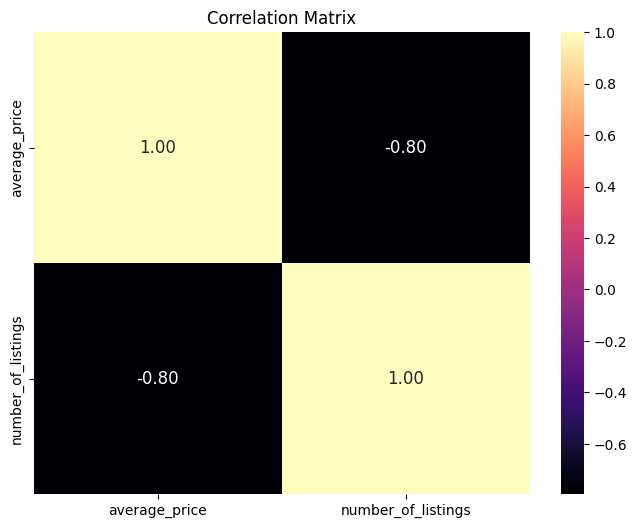

In [ ]:
import seaborn as sns

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='magma', fmt=".2f", annot_kws={"size": 12})
plt.title('Correlation Matrix')
plt.show()


In [ ]:
!pip install statsmodels

Forecasted Prices:
12    201.704281
13    204.518851
14    208.834810
15    215.454609
16    220.097183
17    228.319256
18    232.944119
19    231.583788
20    224.051971
21    217.700043
22    216.349405
23    217.973321
Name: predicted_mean, dtype: float64


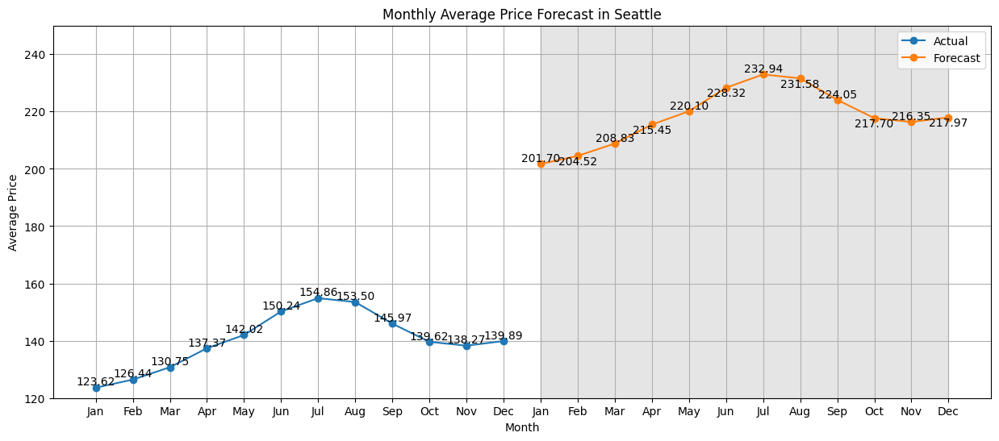

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming your dataset is named 'monthly_data'
# SARIMA model
model = SARIMAX(months['average_price'], exog=months['number_of_listings'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
results = model.fit()

# Calculate the forecast index for the next 12 months
last_observed_month = months['month'].iloc[-1]
forecast_start_month = last_observed_month + 1  # Get the month after the last observed month
forecast_index = np.arange(forecast_start_month, forecast_start_month + 12)

# Forecast for the next 12 months
exog_forecast = months['number_of_listings'].values[-12:]  # Exogenous variable values for forecast period
forecast = results.get_forecast(steps=12, exog=exog_forecast)

# Print the forecasted values
print("Forecasted Prices:")
print(forecast.predicted_mean)

# Plot the forecasted values
plt.figure(figsize=(15, 6))
plt.plot(months['month'], months['average_price'], label='Actual', marker='o')
plt.plot(forecast_index, forecast.predicted_mean, label='Forecast', marker='o')
plt.fill_between(forecast_index, forecast.conf_int()['lower average_price'], forecast.conf_int()['upper average_price'], color='gray', alpha=0.2)
plt.title('Monthly Average Price Forecast in Seattle')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.xticks(np.arange(1, months['month'].max() + 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']*2)
plt.legend()
plt.ylim(120,250)
plt.grid(True)

# Annotate the actual values
for i, price in enumerate(months['average_price']):
    plt.text(months['month'][i], price, f'{price:.2f}', ha='center', va='bottom')

# Annotate the forecasted values
for i, price in enumerate(forecast.predicted_mean):
    # Determine the vertical alignment based on the position of the point
    va = 'bottom' if i % 2 == 0 else 'top'
    plt.text(forecast_index[i], price, f'{price:.2f}', ha='center', va=va)

plt.show()

In [ ]:
forecasted_prices=forecast.predicted_mean

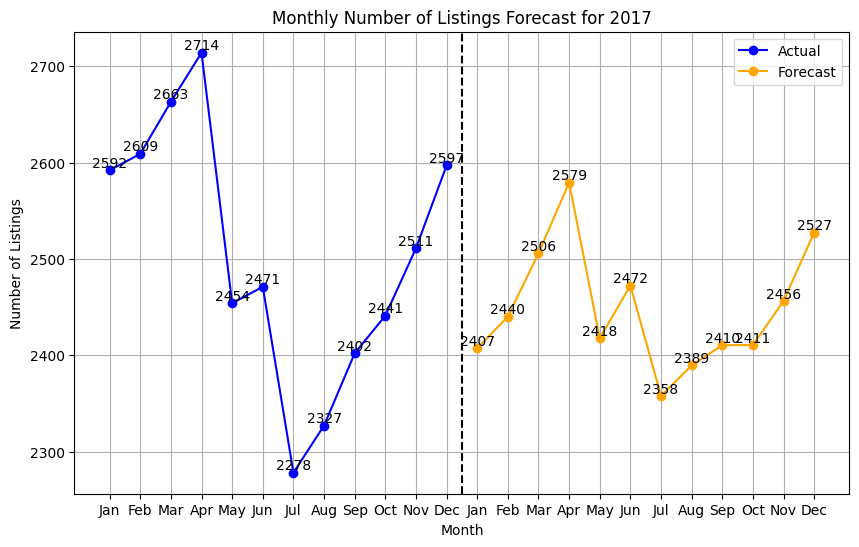

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define a function to train SARIMA model
def train_sarima(endog_series, exog_series):
    # Define the SARIMA model with seasonal order (1, 0, 0, 12)
    sarima_model = SARIMAX(endog_series, exog=exog_series, order=(1, 0, 0), seasonal_order=(1, 0, 0, 12))
    # Fit the model
    sarima_model_fit = sarima_model.fit()
    return sarima_model_fit

# Split data into endogenous and exogenous variables
endog_series = months['number_of_listings']
exog_series = months['average_price']

# Train SARIMA model for number_of_listings with forecasted mean prices as exogenous variables
sarima_model = train_sarima(endog_series, exog_series)

# Forecast number of listings for 2017
forecast_steps = 12
forecast_index = pd.date_range(start='2017-01-01', periods=forecast_steps, freq='MS')
# Use the forecasted mean prices as exogenous variables for the forecast
forecast_values = sarima_model.forecast(steps=forecast_steps, exog=months['average_price'])

# Plot the actual values and forecasted values
plt.figure(figsize=(10, 6))
plt.plot(months['month'], months['number_of_listings'], label='Actual', color='blue', marker='o')
plt.plot(np.arange(13, 13 + forecast_steps), forecast_values, label='Forecast', color='orange', marker='o')
# Plot vertical line to separate historical and forecasted data
plt.axvline(x=12.5, color='black', linestyle='--')
plt.title('Monthly Number of Listings Forecast for 2017')
plt.xlabel('Month')
plt.ylabel('Number of Listings')
plt.xticks(np.arange(1, 25), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']*2)
plt.legend()
plt.grid(True)

# Annotate the actual values
for i, count in enumerate(months['number_of_listings']):
    plt.text(i + 1, count, f'{count}', ha='center', va='bottom')

# Annotate the forecasted values
for i, count in enumerate(forecast_values):
    plt.text(i + 13, count, f'{count:.0f}', ha='center', va='bottom')

plt.show()


In [ ]:
# Load the dataset
data = merged_calendar

# Convert date column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Filter data for 2016 and available listings
data_2016_available = data[(data['date'].dt.year == 2016) & (data['available'] == 1)]

# Group data by listing_id and month and count available listings
listings_count_2016 = data_2016_available.groupby(['listing_id', data_2016_available['date'].dt.month])['available'].sum().unstack(fill_value=0)
# Merge additional features
additional_features = ['price', 'review_scores_rating', 'minimum_nights', 'maximum_nights', 'availability_30', 'availability_60', 'availability_90', 'availability_365']
additional_data = data_2016_available.groupby('listing_id')[additional_features].mean()
listings_count_2016 = listings_count_2016.merge(additional_data, left_index=True, right_index=True)


In [ ]:
listings_count_2016

,1,2,3,4,5,6,7,8,9,10,11,12,price,review_scores_rating,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365
listing_id,,,,,,,,,,,,,,,,,,,,
3335,0,1,31,30,31,30,31,31,30,31,30,31,120.000000,0.0,2.0,730.0,0.0,4.0,34.0,309.0
4291,28,29,31,30,31,30,31,31,30,31,30,31,82.000000,92.0,2.0,60.0,30.0,60.0,90.0,365.0
5682,10,23,11,25,25,30,31,31,30,31,30,31,53.964286,96.0,3.0,28.0,12.0,33.0,46.0,309.0
6606,28,29,31,30,31,30,31,31,30,31,30,31,92.865014,93.0,2.0,1125.0,30.0,60.0,90.0,365.0
7369,3,18,31,1,0,0,0,0,0,0,0,0,85.000000,94.0,1.0,1125.0,3.0,24.0,53.0,53.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10331249,17,29,31,30,31,30,31,31,30,31,30,31,45.000000,0.0,14.0,1125.0,19.0,49.0,79.0,354.0
10332096,28,29,31,30,31,30,31,31,30,31,30,31,40.000000,0.0,1.0,1125.0,30.0,60.0,90.0,365.0
10334184,24,29,31,30,31,30,31,31,30,31,30,31,120.000000,0.0,2.0,1125.0,26.0,56.0,86.0,361.0


Listing ID: 6315435


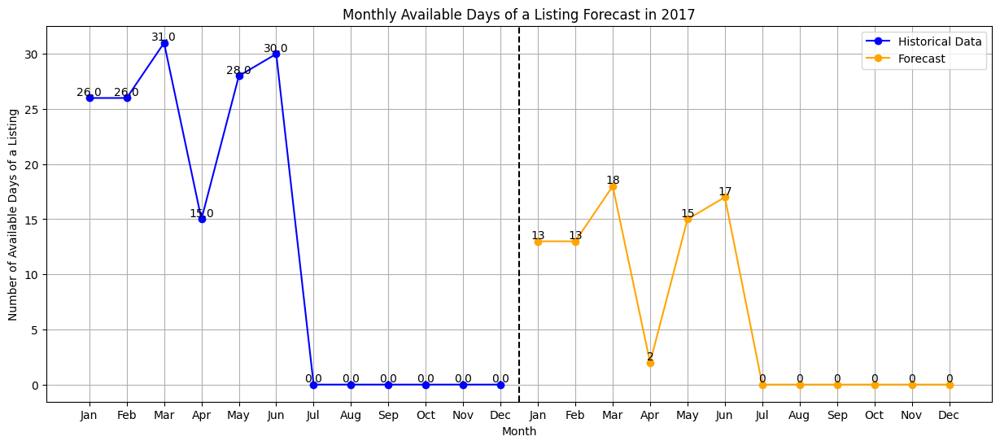

In [ ]:
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
import numpy as np
import calendar
import random

def train_model(endog_series, exog_array):
    model = SARIMAX(endog_series, exog=exog_array, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    model_fit = model.fit()
    return model_fit

def forecast_listings(model, exog_array, days_in_month):
    forecast_values = model.forecast(steps=12, exog=exog_array)
    forecast_values = np.maximum(forecast_values, 0)  # Clip forecasted values at zero
    forecast_values = np.minimum(forecast_values, days_in_month)  # Ensure forecasted values are within range
    return forecast_values


# Load the dataset
data = filtered_calendar

# Convert date column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Filter data for 2016 and available listings
data_2016_available = data[(data['date'].dt.year == 2016) & (data['available'] == 1)]
# Group data by listing_id and month and count available listings
listings_count_2016 = data_2016_available.groupby(['listing_id', data_2016_available['date'].dt.month])['available'].sum().unstack(fill_value=0)

# Merge additional features
additional_features = ['price', 'review_scores_rating']
additional_data = data_2016_available.groupby('listing_id')[additional_features].mean()
listings_count_2016 = listings_count_2016.merge(additional_data, left_index=True, right_index=True)


# Get a random listing ID from the available ones
listing_id_to_forecast = 6315435


# Select endogenous (y) and exogenous (X) variables
endog_series = listings_count_2016.loc[listing_id_to_forecast, :12].values  # Select columns 1 to 12 as endogenous variables
exog_array = listings_count_2016.loc[listing_id_to_forecast, ['price', 'review_scores_rating']].values
  # Select columns from 'price' onwards as exogenous variables

# Reshape exog_array to match the SARIMAX input format
exog_array = np.repeat(exog_array.reshape(1, -1), 12, axis=0)

model = train_model(endog_series, exog_array)

# Get the number of days in each month
days_in_month = [calendar.monthrange(2017, i)[1] for i in range(1, 13)]

forecast_values = forecast_listings(model, exog_array, days_in_month)

# Plot the historical data
plt.figure(figsize=(15, 6))
plt.plot(range(1, 13), endog_series, label='Historical Data', color='blue', marker='o')
print('Listing ID:', listing_id_to_forecast)
# Plot the forecasted data
plt.plot(range(13, 25), forecast_values, label='Forecast', color='orange', marker='o')

plt.axvline(x=12.5, color='black', linestyle='--')
plt.xlabel('Month')
plt.ylabel('Number of Available Days of a Listing')
plt.title('Monthly Available Days of a Listing Forecast in 2017')
plt.xticks(np.arange(1, 25), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']*2)
plt.legend()
plt.grid(True)

# Annotate the historical data
for i, count in enumerate(endog_series):
    plt.text(i + 1, count, f'{count}', ha='center', va='bottom')

# Annotate the forecasted data
for i, count in enumerate(forecast_values):
    plt.text(i + 13, count, f'{count:.0f}', ha='center', va='bottom')

plt.show()


In [ ]:
import pandas as pd

# Create a DataFrame to store the data
data_dict = {
    'Listing ID': [],
    'Month': [],
    'Year': [],
    'Number of Available Listings': []
}

# Add historical data to the DataFrame
for month in range(1, 13):
    data_dict['Listing ID'].append(listing_id_to_forecast)
    data_dict['Month'].append(month)
    data_dict['Year'].append(2016)
    data_dict['Number of Available Listings'].append(endog_series[month - 1])

# Add forecasted data to the DataFrame
for month in range(1, 13):
    data_dict['Listing ID'].append(listing_id_to_forecast)
    data_dict['Month'].append(month)
    data_dict['Year'].append(2017)
    data_dict['Number of Available Listings'].append(forecast_values[month - 1])

# Create DataFrame
df = pd.DataFrame(data_dict)

# Display the DataFrame
print(df)


    Listing ID  Month  Year  Number of Available Listings
0      6315435      1  2016                     26.000000
1      6315435      2  2016                     26.000000
2      6315435      3  2016                     31.000000
3      6315435      4  2016                     15.000000
4      6315435      5  2016                     28.000000
5      6315435      6  2016                     30.000000
6      6315435      7  2016                      0.000000
7      6315435      8  2016                      0.000000
8      6315435      9  2016                      0.000000
9      6315435     10  2016                      0.000000
10     6315435     11  2016                      0.000000
11     6315435     12  2016                      0.000000
12     6315435      1  2017                     13.000006
13     6315435      2  2017                     13.000006
14     6315435      3  2017                     18.000006
15     6315435      4  2017                      2.000006
16     6315435

# Question 3: Predictive Analysis

How can one ascertain the appropriate pricing of a new Airbnb listing based on its features, amenities, and location?  

In [ ]:
 # Importing all the necessary packages here.

import pandas as pd
import seaborn as sns
import numpy as np
import folium
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Loading the Airbnb listings dataset file here.

listings =  pd.read_csv('listings.csv')

In [ ]:
# Displaying the type and dimensions of the listings dataset here.

print("Data type : ", type(listings))
print("Data dimensions : ", listings.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dimensions :  (3818, 92)


In [ ]:
# Replacing all missing data with zeros here.

listings.fillna(0, inplace=True)


In [ ]:

# This column values were f and y, so performing encoding here.

label_encoder = LabelEncoder()
listings['instant_bookable'] = label_encoder.fit_transform(listings['instant_bookable'])

# One-hot encoding for all columns with categorical data is done here.

boolean_columns = listings.select_dtypes(include='bool').columns
for col in boolean_columns:
    listings[col] = listings[col].astype(int)

In [ ]:
# Extracting monthly_price and price columns from listings dataset here.

price_arr = listings['price']
monthly_price_arr = listings['monthly_price']
weekly_price_arr = listings['weekly_price']

# Removing non-numerical($) symbols here.
clean_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in price_arr]
clean_monthly_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in monthly_price_arr]
clean_weekly_prices = [float(p[1:].replace(',', '')) if isinstance(p, str) else p for p in weekly_price_arr]

# Replacing cleaned data in the listings dataset here.
listings['price'] = clean_prices
listings['monthly_price'] = clean_monthly_prices
listings['weekly_price'] = clean_weekly_prices

In [ ]:
# Giving certain conditions to remove unnecessary listings here.

conditions = (listings['id'] > 0) & \
              (listings['bedrooms'] > 0) & \
              (listings['accommodates'] > 0) & \
              (listings['price'] > 0) & \
              (listings['beds'] > 0)

# Applying said conditions to listings dataset here.

listings = listings[conditions]

In [ ]:
newlistings = listings[['room_type','property_type','bedrooms','amenities','number_of_reviews', 'price', 'review_scores_rating']]
newlistings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3439 entries, 0 to 3817
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   room_type             3439 non-null   object 
 1   property_type         3439 non-null   object 
 2   bedrooms              3439 non-null   float64
 3   amenities             3439 non-null   object 
 4   number_of_reviews     3439 non-null   int64  
 5   price                 3439 non-null   float64
 6   review_scores_rating  3439 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 214.9+ KB


In [ ]:
# Extracting amenities from the DataFrame and joining them into a single string
amenities_string = ','.join(newlistings['amenities'])

# Removing unwanted characters and splitting the string into a list of amenities
amenities_list = [amenity.strip('{}"') for amenity in amenities_string.split(',')]

# Creating a set of unique amenities
amenities_set = set(amenities_list)


In [ ]:
# Define a dictionary with amenities and their corresponding columns
amenities_mapping = {
    '24-hour check-in': 'check_in_24h',
    'Air conditioning|Central air conditioning': 'air_conditioning',
    'Amazon Echo|Apple TV|Game console|Netflix|Projector and screen|Smart TV': 'high_end_electronics',
    'BBQ grill|Fire pit|Propane barbeque': 'bbq',
    'Balcony|Patio': 'balcony',
    'Beach view|Beachfront|Lake access|Mountain view|Ski-in/Ski-out|Waterfront': 'nature_and_views',
    'Bed linens': 'bed_linen',
    'Breakfast': 'breakfast',
    'TV': 'tv',
    'Coffee maker|Espresso machine': 'coffee_machine',
    'Cooking basics': 'cooking_basics',
    'Dishwasher|Dryer|Washer': 'white_goods',
    'Elevator': 'elevator',
    'Exercise equipment|Gym|gym': 'gym',
    'Family/kid friendly|Children|children': 'child_friendly',
    'parking': 'parking',
    'Garden|Outdoor|Sun loungers|Terrace': 'outdoor_space',
    'Host greets you': 'host_greeting',
    'Hot tub|Jetted tub|hot tub|Sauna|Pool|pool': 'hot_tub_sauna_or_pool',
    'Internet|Pocket wifi|Wifi': 'internet',
    'Long term stays allowed': 'long_term_stays',
    'Pets|pet|Cat(s)|Dog(s)': 'pets_allowed',
    'Private entrance': 'private_entrance',
    'Safe|Security system': 'secure',
    'Self check-in': 'self_check_in',
    'Smoking allowed': 'smoking_allowed',
    'Step-free access|Wheelchair|Accessible': 'accessible',
    'Suitable for events': 'event_suitable'
}

# Iterate over the dictionary and set the corresponding column value to 1 if the amenity is present
for amenity, column in amenities_mapping.items():
    newlistings[column] = newlistings['amenities'].str.contains(amenity, case=False, regex=True).astype(int)


In [ ]:
# Replacing nulls with zeros for new columns
cols_to_replace_nulls = newlistings.iloc[:,41:].columns
newlistings[cols_to_replace_nulls] = newlistings[cols_to_replace_nulls].fillna(0)

# Dropping the original amenities variable
newlistings.drop('amenities', axis=1, inplace=True)

In [ ]:
# Removing the amenities which have all NULL values for all listings
newlistings = newlistings.dropna(axis=1, how='all')
newlistings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3439 entries, 0 to 3817
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   room_type              3439 non-null   object 
 1   property_type          3439 non-null   object 
 2   bedrooms               3439 non-null   float64
 3   number_of_reviews      3439 non-null   int64  
 4   price                  3439 non-null   float64
 5   review_scores_rating   3439 non-null   float64
 6   check_in_24h           3439 non-null   int64  
 7   air_conditioning       3439 non-null   int64  
 8   high_end_electronics   3439 non-null   int64  
 9   bbq                    3439 non-null   int64  
 10  balcony                3439 non-null   int64  
 11  nature_and_views       3439 non-null   int64  
 12  bed_linen              3439 non-null   int64  
 13  breakfast              3439 non-null   int64  
 14  tv                     3439 non-null   int64  
 15  coffee_ma

In [ ]:
# Calculate the total number of each type of property
property_type_counts = newlistings['property_type'].value_counts()

# Calculate the mean price for each type of property
mean_price_by_property_type = newlistings.groupby('property_type')['price'].mean()

# Display the total number of each type of property and their mean prices
property_info = pd.concat([property_type_counts, mean_price_by_property_type], axis=1, keys=['Total Number', 'Mean Price'])
print(property_info)


                 Total Number  Mean Price
property_type                            
House                    1678  133.542312
Apartment                1427  126.644008
Townhouse                 116  129.620690
Condominium                87  153.724138
Bed & Breakfast            37  112.054054
Loft                       27  142.407407
Cabin                      17  108.529412
Other                      16   93.875000
Camper/RV                   9   86.222222
Boat                        8  282.375000
Bungalow                    5  155.000000
Tent                        5   54.000000
Dorm                        2   39.500000
Treehouse                   2   51.500000
Chalet                      2   98.500000
0                           1  120.000000


In [ ]:
# To convert NaN values to 0 for preparation for Modelling
newlistings = newlistings.fillna(0)
# Checking to ensure that there are no NULL entries
newlistings.isnull().sum()

room_type                0
property_type            0
bedrooms                 0
number_of_reviews        0
price                    0
review_scores_rating     0
check_in_24h             0
air_conditioning         0
high_end_electronics     0
bbq                      0
balcony                  0
nature_and_views         0
bed_linen                0
breakfast                0
tv                       0
coffee_machine           0
cooking_basics           0
white_goods              0
elevator                 0
gym                      0
child_friendly           0
parking                  0
outdoor_space            0
host_greeting            0
hot_tub_sauna_or_pool    0
internet                 0
long_term_stays          0
pets_allowed             0
private_entrance         0
secure                   0
self_check_in            0
smoking_allowed          0
accessible               0
event_suitable           0
dtype: int64

In [ ]:
# One-hot encode the Categorial variables
transformedDF = pd.get_dummies(newlistings, columns=['room_type','property_type'])

#renaming some categories to remove '/' and blank spaces
newTransformedDF = transformedDF.rename(columns={'room_type_Entire home/apt': 'room_type_Entire_home_apt'})
newTransformedDF =newTransformedDF.rename(columns={'room_type_Private room': 'room_type_Private_room'})
newTransformedDF =newTransformedDF.rename(columns={'room_type_Shared room': 'room_type_Shared_room'})
newTransformedDF =newTransformedDF.rename(columns={'property_type_Bed & Breakfast': 'property_type_Bed_and_Breakfast'})

newTransformedDF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3439 entries, 0 to 3817
Data columns (total 51 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   bedrooms                         3439 non-null   float64
 1   number_of_reviews                3439 non-null   int64  
 2   price                            3439 non-null   float64
 3   review_scores_rating             3439 non-null   float64
 4   check_in_24h                     3439 non-null   int64  
 5   air_conditioning                 3439 non-null   int64  
 6   high_end_electronics             3439 non-null   int64  
 7   bbq                              3439 non-null   int64  
 8   balcony                          3439 non-null   int64  
 9   nature_and_views                 3439 non-null   int64  
 10  bed_linen                        3439 non-null   int64  
 11  breakfast                        3439 non-null   int64  
 12  tv                       

In [ ]:
newTransformedDF.columns

Index(['bedrooms', 'number_of_reviews', 'price', 'review_scores_rating',
       'check_in_24h', 'air_conditioning', 'high_end_electronics', 'bbq',
       'balcony', 'nature_and_views', 'bed_linen', 'breakfast', 'tv',
       'coffee_machine', 'cooking_basics', 'white_goods', 'elevator', 'gym',
       'child_friendly', 'parking', 'outdoor_space', 'host_greeting',
       'hot_tub_sauna_or_pool', 'internet', 'long_term_stays', 'pets_allowed',
       'private_entrance', 'secure', 'self_check_in', 'smoking_allowed',
       'accessible', 'event_suitable', 'room_type_Entire_home_apt',
       'room_type_Private_room', 'room_type_Shared_room', 'property_type_0',
       'property_type_Apartment', 'property_type_Bed_and_Breakfast',
       'property_type_Boat', 'property_type_Bungalow', 'property_type_Cabin',
       'property_type_Camper/RV', 'property_type_Chalet',
       'property_type_Condominium', 'property_type_Dorm',
       'property_type_House', 'property_type_Loft', 'property_type_Other',
 

Linear Regression Model

In [ ]:
from sklearn.preprocessing import StandardScaler
# Separating X and y for Modelling
X = pd.DataFrame(newTransformedDF[['bedrooms', 'number_of_reviews', 'review_scores_rating',
       'check_in_24h', 'air_conditioning', 'high_end_electronics', 'bbq',
       'balcony', 'nature_and_views', 'bed_linen', 'breakfast', 'tv',
       'coffee_machine', 'cooking_basics', 'white_goods', 'elevator', 'gym',
       'child_friendly', 'parking', 'outdoor_space', 'host_greeting',
       'hot_tub_sauna_or_pool', 'internet', 'long_term_stays', 'pets_allowed',
       'private_entrance', 'secure', 'self_check_in', 'smoking_allowed',
       'accessible', 'event_suitable', 'room_type_Entire_home_apt',
       'room_type_Private_room', 'room_type_Shared_room', 'property_type_0',
       'property_type_Apartment', 'property_type_Bed_and_Breakfast',
       'property_type_Boat', 'property_type_Bungalow', 'property_type_Cabin',
       'property_type_Camper/RV', 'property_type_Chalet',
       'property_type_Condominium', 'property_type_Dorm',
       'property_type_House', 'property_type_Loft', 'property_type_Other',
       'property_type_Tent', 'property_type_Townhouse',
       'property_type_Treehouse']])

# Predictor Variables
y = pd.DataFrame(newTransformedDF["price"])  # Response Variables

# Scaling
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=list(X.columns))


In [ ]:
from sklearn.model_selection import train_test_split
# Splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [ ]:
# Libraries used for Modelling
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from xgboost import plot_importance
from xgboost import plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz

In [ ]:
# Linear Regression Model

# Creating and fitting the model
linreg = LinearRegression()
linreg.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

Intercept of Regression 	: b =  [130.18521985]

                         Predictors  Coefficients
0                          bedrooms  5.615186e+01
1                 number_of_reviews -2.089417e+00
2              review_scores_rating -8.684386e-01
3                      check_in_24h -3.199604e+00
4                  air_conditioning  4.577834e+00
5              high_end_electronics -1.048864e+11
6                               bbq  4.194135e+10
7                           balcony  1.684504e+10
8                  nature_and_views  4.029227e+09
9                         bed_linen  5.830787e+09
10                        breakfast -3.086897e-01
11                               tv  3.089287e+00
12                   coffee_machine  7.107651e+06
13                   cooking_basics -3.238554e+05
14                      white_goods -1.575170e-01
15                         elevator  9.027273e+00
16                              gym  9.676966e-01
17                   child_friendly -1.600814e+00
18

A positive coefficient indicates that as the predictor variable increases, the response variable also increases. A negative coefficient indicates that as the predictor variable increases, the response variable decreases.

In [ ]:
# Predict Response corresponding to Predictors
trainPredictionLR = linreg.predict(X_train)
testPredictionLR = linreg.predict(X_test)

Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

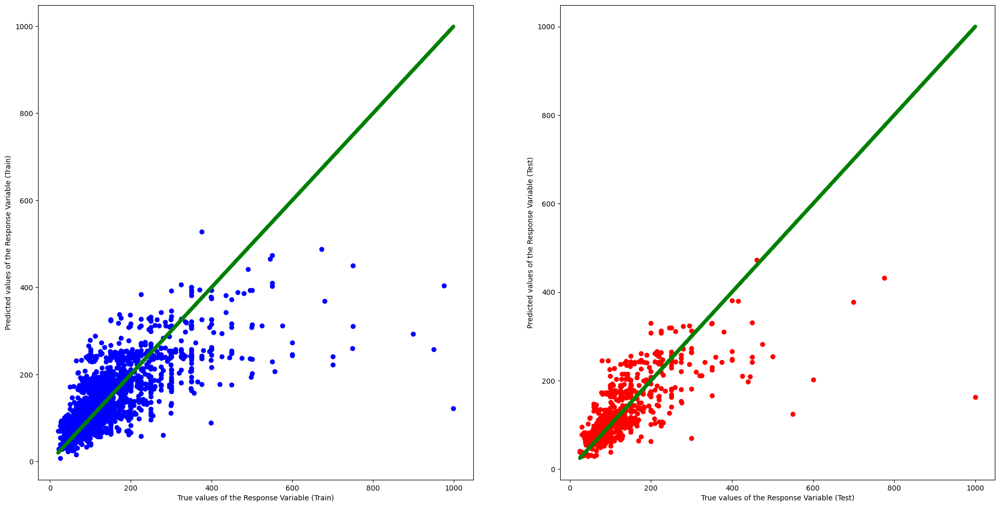

In [ ]:

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictionLR, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictionLR, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate evaluation metrics
train_mae = mean_absolute_error(y_train, trainPredictionLR)
test_mae = mean_absolute_error(y_test, testPredictionLR)

train_mse = mean_squared_error(y_train, trainPredictionLR)
test_mse = mean_squared_error(y_test, testPredictionLR)

train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)

train_r2 = r2_score(y_train, trainPredictionLR)
test_r2 = r2_score(y_test, testPredictionLR)

print("Testing MAE:", test_mae)
print("Testing MSE:", test_mse)
print("Testing RMSE:", test_rmse)
print("Testing R-squared:", test_r2)

lr_mse = test_mse
lr_rmse = test_rmse

Testing MAE: 38.83037766731219
Testing MSE: 4442.131839514075
Testing RMSE: 66.64931987285448
Testing R-squared: 0.513532398717548


Ridge Regression Model

In [ ]:
#Ridge Regression

#numpy array used for plotting Ridge and Lasson Regression later on
varArr = np.array(['bedrooms', 'number_of_reviews', 'review_scores_rating',
       'check_in_24h', 'air_conditioning', 'high_end_electronics', 'bbq',
       'balcony', 'nature_and_views', 'bed_linen', 'breakfast', 'tv',
       'coffee_machine', 'cooking_basics', 'white_goods', 'elevator', 'gym',
       'child_friendly', 'parking', 'outdoor_space', 'host_greeting',
       'hot_tub_sauna_or_pool', 'internet', 'long_term_stays', 'pets_allowed',
       'private_entrance', 'secure', 'self_check_in', 'smoking_allowed',
       'accessible', 'event_suitable', 'room_type_Entire_home_apt',
       'room_type_Private_room', 'room_type_Shared_room', 'property_type_0',
       'property_type_Apartment', 'property_type_Bed_and_Breakfast',
       'property_type_Boat', 'property_type_Bungalow', 'property_type_Cabin',
       'property_type_Camper/RV', 'property_type_Chalet',
       'property_type_Condominium', 'property_type_Dorm',
       'property_type_House', 'property_type_Loft', 'property_type_Other',
       'property_type_Tent', 'property_type_Townhouse',
       'property_type_Treehouse'])

In [ ]:
# initializing the model
ridgeReg = Ridge(alpha=0).fit(X_train,y_train) #alpha is the lambda value

#store the predictions for each lambda/alpha value
ridgeTrainPred = []
ridgeTestPred = []
ridgeR2score = [] # store all the R2 values
lambdaVal = [] #store all values of lambda
#for plotting
ridgeDF = pd.DataFrame({'variable': varArr, 'estimate': ridgeReg.coef_.ravel()})


lambdas = np.arange(0,2000,1) #lambda value of 0 to positive 2000, in intervals of 1

for alpha in lambdas:
    ridgeReg = Ridge(alpha=alpha)
    ridgeReg.fit(X_train, y_train)
    var_name = 'estimate' + str(alpha)
    ridgeDF[var_name] = ridgeReg.coef_.ravel()
    #prediction
    ridgeTrainPred.append(ridgeReg.predict(X_train))
    ridgeTestPred.append(ridgeReg.predict(X_test))
    #storing the R2 scores and lambda value
    ridgeR2score.append(ridgeReg.score(X_train,y_train))
    lambdaVal.append(alpha)

ridgeDF = ridgeDF.set_index('variable').T.rename_axis('estimate').rename_axis(1).reset_index()


bestRidgeR2 = max(ridgeR2score)
print("The highest R2 value: ",bestRidgeR2)
print("The value of lambda that minimises: ",lambdaVal[ridgeR2score.index(bestRidgeR2)])


#Using the best fit Ridge Regression Model's predictions
trainPredictionRidge = ridgeTrainPred[ridgeR2score.index(bestRidgeR2)]
testPredictionRidge = ridgeTestPred[ridgeR2score.index(bestRidgeR2)]


The highest R2 value:  0.5492877239290281
The value of lambda that minimises:  1


In [ ]:
ridgeDF

variable,1,bedrooms,number_of_reviews,review_scores_rating,check_in_24h,air_conditioning,high_end_electronics,bbq,balcony,nature_and_views,...,property_type_Camper/RV,property_type_Chalet,property_type_Condominium,property_type_Dorm,property_type_House,property_type_Loft,property_type_Other,property_type_Tent,property_type_Townhouse,property_type_Treehouse
0,estimate,55.919885,-2.273104,0.306152,-2.417102,3.810458,-2.974419e+15,-5.704657e+15,-1.354586e+15,5.178112e+15,...,6.463444e+13,3.050004e+13,1.986586e+14,3.050004e+13,6.323701e+14,1.116560e+14,8.609127e+13,4.820375e+13,2.283967e+14,3.050004e+13
1,estimate0,55.919885,-2.273104,0.306152,-2.417102,3.810458,-2.974419e+15,-5.704657e+15,-1.354586e+15,5.178112e+15,...,6.463444e+13,3.050004e+13,1.986586e+14,3.050004e+13,6.323701e+14,1.116560e+14,8.609127e+13,4.820375e+13,2.283967e+14,3.050004e+13
2,estimate1,56.192619,-2.114265,-0.860220,-3.199829,4.584618,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.435928e-01,7.328483e-01,1.405417e+00,-2.587429e-02,-3.671755e-01,1.244500e+00,1.368506e-01,-1.160728e+00,1.437303e+00,-3.131207e-01
3,estimate2,56.162055,-2.116435,-0.860119,-3.198344,4.584413,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.437344e-01,7.314590e-01,1.404573e+00,-2.616627e-02,-3.629180e-01,1.243466e+00,1.367201e-01,-1.161020e+00,1.437101e+00,-3.130332e-01
4,estimate3,56.131535,-2.118599,-0.860018,-3.196859,4.584207,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.438754e-01,7.300731e-01,1.403731e+00,-2.645798e-02,-3.586701e-01,1.242434e+00,1.365893e-01,-1.161310e+00,1.436897e+00,-3.129459e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1996,estimate1995,29.691304,-2.999765,-0.773928,-1.195556,3.713507,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.180405e-01,4.026415e-02,9.019886e-01,-3.052770e-01,1.691696e+00,4.937333e-01,-1.481786e-01,-1.072437e+00,7.232302e-01,-3.119055e-01
1997,estimate1996,29.685114,-2.999648,-0.773870,-1.194983,3.713091,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.179948e-01,4.020948e-02,9.019000e-01,-3.053329e-01,1.691729e+00,4.935869e-01,-1.482650e-01,-1.072325e+00,7.229769e-01,-3.119153e-01
1998,estimate1997,29.678927,-2.999530,-0.773812,-1.194411,3.712675,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.179491e-01,4.015487e-02,9.018115e-01,-3.053888e-01,1.691763e+00,4.934405e-01,-1.483514e-01,-1.072212e+00,7.227237e-01,-3.119252e-01
1999,estimate1998,29.672744,-2.999412,-0.773754,-1.193839,3.712259,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,-6.179034e-01,4.010033e-02,9.017231e-01,-3.054446e-01,1.691796e+00,4.932942e-01,-1.484377e-01,-1.072100e+00,7.224707e-01,-3.119350e-01


Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

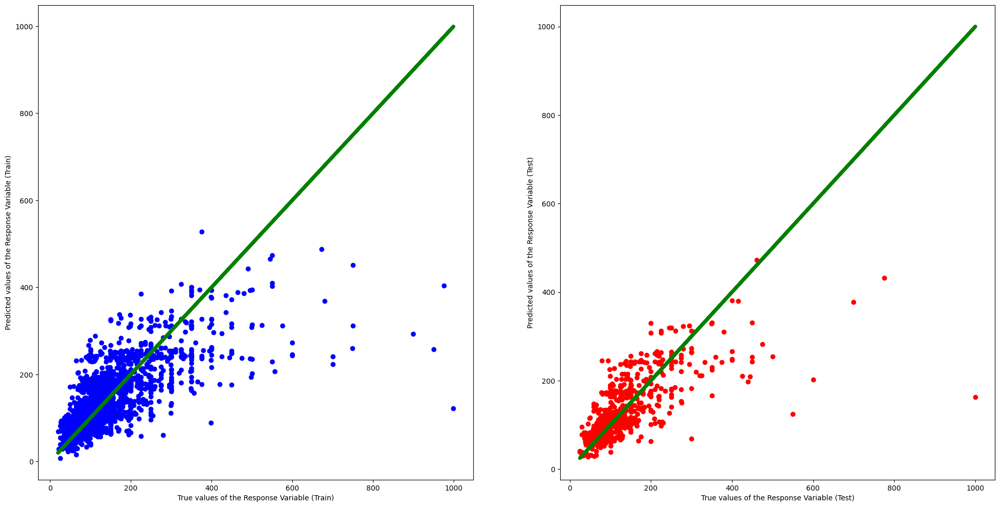

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictionRidge, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictionRidge, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate Mean Absolute Error (MAE)
ridge_mae_train = mean_absolute_error(y_train, trainPredictionRidge)
ridge_mae_test = mean_absolute_error(y_test, testPredictionRidge)

# Calculate Mean Squared Error (MSE)
ridge_mse_train = mean_squared_error(y_train, trainPredictionRidge)
ridge_mse_test = mean_squared_error(y_test, testPredictionRidge)

# Calculate R-squared Error
ridge_r2_train = r2_score(y_train, trainPredictionRidge)
ridge_r2_test = r2_score(y_test, testPredictionRidge)

# Calculate Root Mean Squared Error (RMSE)
ridge_rmse_train = np.sqrt(ridge_mse_train)
ridge_rmse_test = np.sqrt(ridge_mse_test)

# Print the metrics
print("Ridge Regression Metrics:")
print("Testing MAE:", ridge_mae_test)
print("Testing MSE:", ridge_mse_test)
print("Testing R-squared:", ridge_r2_test)
print("Testing RMSE:", ridge_rmse_test)

ridge_mse = ridge_mse_test
ridge_rmse = ridge_rmse_test

Ridge Regression Metrics:
Testing MAE: 38.835537571936676
Testing MSE: 4442.092158021351
Testing R-squared: 0.5135367443248551
Testing RMSE: 66.64902218353508


Random Forest Regression

In [ ]:
# Random Forest Regression

# Tuning of Parameters

random_grid = {'n_estimators': [2000],
               'max_features': [2,5],
               'max_depth': [40,70],
               'min_samples_split': [40,50],
               'max_leaf_nodes':[50,70],
               'max_features': [2,5]}
rf_tune = RandomForestRegressor()
rf_random = GridSearchCV(estimator = rf_tune, param_grid = random_grid, cv = 3, verbose=2,n_jobs = 2)

rf_random.fit(X_train,y_train)

print(rf_random.best_estimator_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
RandomForestRegressor(max_depth=40, max_features=5, max_leaf_nodes=70,
                      min_samples_split=40, n_estimators=2000)


In [ ]:
# Creating and fitting the model
RF = RandomForestRegressor(n_estimators=2000, max_depth=40,min_samples_split = 50,
                           max_leaf_nodes = 70,max_features = 5).fit(X_train,y_train)

# Predicting the training and testing sets
trainPredictin_RF = RF.predict(X_train)
testPredictin_RF =RF.predict(X_test)

In [ ]:
importancesRF = RF.feature_importances_
feat_imp1 = pd.DataFrame(importancesRF, columns=['Weight'], index=X_train.columns)
feat_imp1.sort_values('Weight', inplace=True)
feat_imp1

,Weight
self_check_in,0.000000
private_entrance,0.000000
long_term_stays,0.000000
host_greeting,0.000000
high_end_electronics,0.000000
bbq,0.000000
balcony,0.000000
nature_and_views,0.000000
bed_linen,0.000000
outdoor_space,0.000000


Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

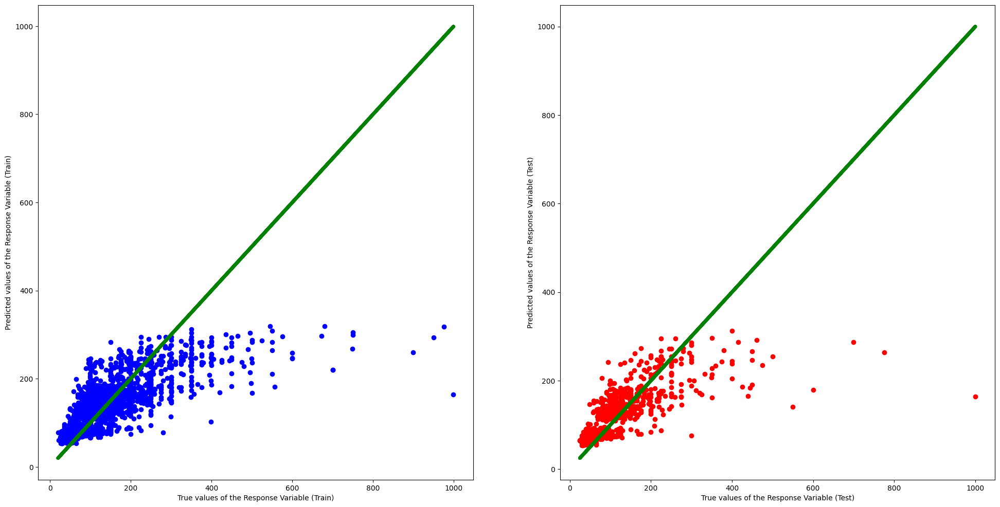

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictin_RF, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictin_RF, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate MAE
train_mae = mean_absolute_error(y_train, trainPredictin_RF)
test_mae = mean_absolute_error(y_test, testPredictin_RF)

# Calculate MSE
train_mse = mean_squared_error(y_train, trainPredictin_RF)
test_mse = mean_squared_error(y_test, testPredictin_RF)

# Calculate RMSE
train_rmse = mean_squared_error(y_train, trainPredictin_RF, squared=False)
test_rmse = mean_squared_error(y_test, testPredictin_RF, squared=False)

# Calculate R-squared
train_r2 = r2_score(y_train, trainPredictin_RF)
test_r2 = r2_score(y_test, testPredictin_RF)


print("Testing MAE:", test_mae)
print("Testing MSE:", test_mse)
print("Testing RMSE:", test_rmse)
print("Testing R-squared:", test_r2)

rf_mse = test_mse
rf_rmse = test_rmse

Testing MAE: 40.21569613859824
Testing MSE: 4944.611540735498
Testing RMSE: 70.31793185763854
Testing R-squared: 0.4585047444791164


Lasso Regression

In [ ]:
#initialising the model
lassoReg = Lasso(alpha=1)
lassoReg.fit(X_train, y_train)
#stores prediction
lassoTrainPred = []
lassoTestPred = []
lassoR2score=[] #stores R2 value
lassoDF = pd.DataFrame({'variable': varArr, 'estimate': lassoReg.coef_.ravel()})

lambdas = np.arange(0.01, 8.01, 0.02)#lambda value of 0.01 to 8.01, in intervals of 0.02

for alpha in lambdas:
    lassoReg = Lasso(alpha=alpha)
    lassoReg.fit(X_train, y_train)
    var_name = 'estimate' + str(alpha)
    lassoDF[var_name] = lassoReg.coef_.ravel()
    #prediction
    lassoTrainPred.append(lassoReg.predict(X_train))
    lassoTestPred.append(lassoReg.predict(X_test))
    #storing the r2 score
    lassoR2score.append(lassoReg.score(X_train,y_train))


bestLassoR2 = max(lassoR2score)
print("The highest R2 value: ",bestLassoR2)


#Using the best fit Lasso Regression Model's predictions
trainPredictionLasso = lassoTrainPred[lassoR2score.index(bestLassoR2)]
testPredictionLasso = lassoTestPred[lassoR2score.index(bestLassoR2)]

lassoDF = lassoDF.set_index('variable').T.rename_axis('estimate').rename_axis(1).reset_index()


The highest R2 value:  0.5492873926933233


In [ ]:
lassoDF.head()

variable,1,bedrooms,number_of_reviews,review_scores_rating,check_in_24h,air_conditioning,high_end_electronics,bbq,balcony,nature_and_views,...,property_type_Camper/RV,property_type_Chalet,property_type_Condominium,property_type_Dorm,property_type_House,property_type_Loft,property_type_Other,property_type_Tent,property_type_Townhouse,property_type_Treehouse
0,estimate,55.613273,-1.563718,-0.082959,-1.620340,4.015537,0.0,0.0,0.0,0.0,...,-0.000000,0.000000,1.091635,-0.00000,-0.0,0.657179,0.000000,-0.488546,0.532545,-0.000000
1,estimate0.01,56.215868,-2.104347,-0.852818,-3.187096,4.578894,0.0,0.0,0.0,0.0,...,-0.596263,0.736322,1.518421,-0.00134,-0.0,1.304621,0.179189,-1.125337,1.561364,-0.288716
2,estimate0.03,56.201337,-2.088942,-0.837671,-3.158778,4.567003,0.0,0.0,0.0,0.0,...,-0.577825,0.704667,1.509362,-0.00000,-0.0,1.291603,0.162342,-1.111804,1.540676,-0.275604
3,estimate0.049999999999999996,56.186759,-2.073543,-0.822510,-3.130481,4.555103,0.0,0.0,0.0,0.0,...,-0.559394,0.673011,1.500283,-0.00000,-0.0,1.278569,0.145474,-1.098281,1.519976,-0.262497
4,estimate0.06999999999999999,56.172475,-2.058166,-0.807339,-3.102157,4.543223,0.0,0.0,0.0,0.0,...,-0.540934,0.641369,1.491294,-0.00000,-0.0,1.265592,0.128629,-1.084730,1.499277,-0.249388


Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

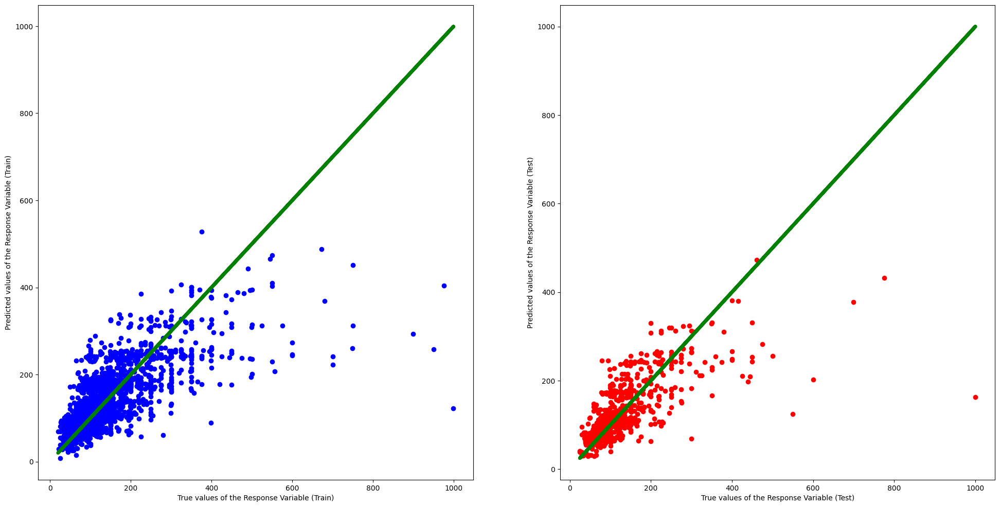

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictionLasso, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictionLasso, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Calculate MAE
train_mae = mean_absolute_error(y_train, trainPredictionLasso)
test_mae = mean_absolute_error(y_test, testPredictionLasso)

# Calculate MSE
train_mse = mean_squared_error(y_train, trainPredictionLasso)
test_mse = mean_squared_error(y_test, testPredictionLasso)

# Calculate RMSE
train_rmse = mean_squared_error(y_train, trainPredictionLasso, squared=False)
test_rmse = mean_squared_error(y_test, testPredictionLasso, squared=False)

# Calculate R-squared
train_r2 = r2_score(y_train, trainPredictionLasso)
test_r2 = r2_score(y_test, testPredictionLasso)

print("Testing MAE:", test_mae)
print("Testing MSE:", test_mse)
print("Testing RMSE:", test_rmse)
print("Testing R-squared:", test_r2)

las_mse = test_mse
las_rmse = test_rmse

Testing MAE: 38.83265113619949
Testing MSE: 4442.174172316369
Testing RMSE: 66.64963745074964
Testing R-squared: 0.5135277627595145


XG Boost Model

In [ ]:
# Fitting and Training the model for Train & Test sets
xgb_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 3, alpha = 10, n_estimators = 2000)

xgb_reg.fit(X_train,y_train)

# Predicting using the model
trainPredictin_xgb_reg = xgb_reg.predict(X_train)
testPredictin_xgb_reg = xgb_reg.predict(X_test)

In [ ]:
# Weightage/Importance of each variable
ft_weights_xgb_reg = pd.DataFrame(xgb_reg.feature_importances_, columns=['weight'], index=X_train.columns)
ft_weights_xgb_reg.sort_values('weight', inplace=True)
ft_weights_xgb_reg

,weight
coffee_machine,0.000000
long_term_stays,0.000000
self_check_in,0.000000
host_greeting,0.000000
outdoor_space,0.000000
cooking_basics,0.000000
bed_linen,0.000000
nature_and_views,0.000000
private_entrance,0.000000
bbq,0.000000


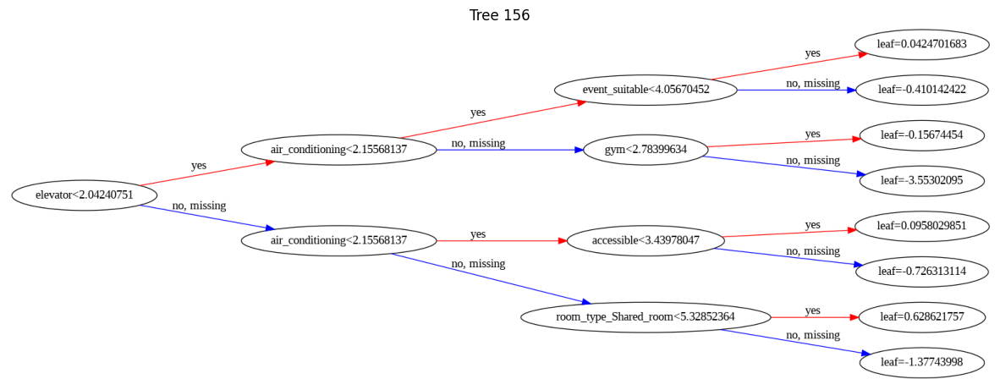

In [ ]:
i = 156
fig, ax = plt.subplots(figsize=(15, 20))
xgb.plot_tree(xgb_reg, num_trees=i, rankdir='LR', ax=ax)
plt.title(f"Tree {i}")
plt.show()


Text(0, 0.5, 'Predicted values of the Response Variable (Test)')

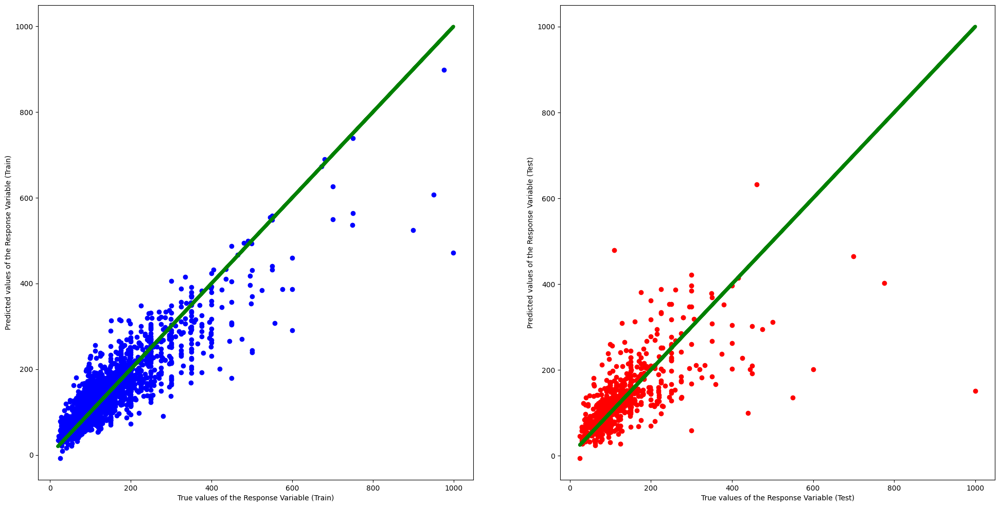

In [ ]:
# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, trainPredictin_xgb_reg, color = "blue")
axes[0].plot(y_train, y_train, 'g-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, testPredictin_xgb_reg, color = "red")
axes[1].plot(y_test, y_test, 'g-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Predictions on training and testing sets
train_predictions_xgb = xgb_reg.predict(X_train)
test_predictions_xgb = xgb_reg.predict(X_test)

# Calculate MAE
train_mae_xgb = mean_absolute_error(y_train, train_predictions_xgb)
test_mae_xgb = mean_absolute_error(y_test, test_predictions_xgb)

# Calculate MSE
train_mse_xgb = mean_squared_error(y_train, train_predictions_xgb)
test_mse_xgb = mean_squared_error(y_test, test_predictions_xgb)

# Calculate RMSE
train_rmse_xgb = mean_squared_error(y_train, train_predictions_xgb, squared=False)
test_rmse_xgb = mean_squared_error(y_test, test_predictions_xgb, squared=False)

# Calculate R-squared
train_r2_xgb = r2_score(y_train, train_predictions_xgb)
test_r2_xgb = r2_score(y_test, test_predictions_xgb)


print("Testing MAE:", test_mae_xgb)
print("Testing MSE:", test_mse_xgb)
print("Testing RMSE:", test_rmse_xgb)
print("Testing R-squared:", test_r2_xgb)

xgb_mse = test_mse_xgb
xgb_rmse = test_rmse_xgb

Testing MAE: 42.378622755754826
Testing MSE: 5215.008230221725
Testing RMSE: 72.21501388369128
Testing R-squared: 0.42889300991531965


In [ ]:
from scipy.stats import f_oneway

# Define the MSE scores for each model
mse_scores = [
    [lr_mse],  # Linear Regression
    [ridge_mse],   # Ridge Regression
    [rf_mse],   # Random Forest
    [las_mse],    # Lasso regression
    [xgb_mse]    # XG Boost
]

# Perform ANOVA test
f_statistic, p_value = f_oneway(*mse_scores)

# Print the results
print("F-statistic:", f_statistic)
print("p-value:", p_value)

# Interpret the results
alpha = 0.05  # Significance level
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in MSE scores among the models.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in MSE scores among the models.")


F-statistic: nan
p-value: nan
Fail to reject the null hypothesis. There is no significant difference in MSE scores among the models.


In [ ]:
from scipy.stats import kruskal

# Define the RMSE scores for each model
rmse_model1 =  lr_rmse # Linear Regression
rmse_model2 =  ridge_rmse # Ridge Regression
rmse_model3 =  rf_rmse # Random Forest
rmse_model4 = las_rmse # Lasso Regression
rmse_model5 = xgb_rmse  # XGBoost

# Perform Kruskal-Wallis test
h_statistic, p_value = kruskal(rmse_model1, rmse_model2, rmse_model3, rmse_model4, rmse_model5)

# Print the results
print("Kruskal-Wallis H-statistic:", h_statistic)
print("p-value:", p_value)

# Interpret the results
if p_value < 0.05:
    print("Reject the null hypothesis. There is a significant difference in RMSE scores among the models.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in RMSE scores among the models.")



Kruskal-Wallis H-statistic: 4.0
p-value: 0.40600584970983794
Fail to reject the null hypothesis. There is no significant difference in RMSE scores among the models.


In [ ]:
instance = X.iloc[[1250]]
trueInstance = y.iloc[[1250]]
# Get the coefficients of the Ridge regression model
coefficients = ridgeReg.coef_

# Multiply the coefficients by the feature values for a specific instance
instance_features = instance.values  # Assuming 'instance' is a DataFrame containing the feature values
contributions = coefficients * instance_features

# Sum up the contributions to get the overall prediction
prediction = np.sum(contributions) + ridgeReg.intercept_
prediction


array([172.70731671])

In [ ]:
# Iterate over the coefficients and feature values to print feature contributions

for i in range(len(instance)):
    print("True Value:",trueInstance['price'])
    print()
    print("Prediction:", prediction)
    print()
    print ("Feature contributions:")
    print("Feature contributions:")
    print("-------------------------")
    for feature, coefficient, value in zip(X_train.columns, coefficients[0], instance_features[0]):
        contribution = float(coefficient * value)
        print(f"{feature}: {contribution:.4f}")


True Value: 1385    169.0
Name: price, dtype: float64

Prediction: [172.70731671]

Feature contributions:
Feature contributions:
-------------------------
bedrooms: 20.1152
number_of_reviews: 0.4876
review_scores_rating: -0.2451
check_in_24h: -2.7740
air_conditioning: -1.7219
high_end_electronics: 0.0000
bbq: 0.0000
balcony: 0.0000
nature_and_views: 0.0000
bed_linen: 0.0000
breakfast: 0.3642
tv: 2.7099
coffee_machine: 0.0000
cooking_basics: 0.0000
white_goods: 0.6283
elevator: -1.7631
gym: -0.7419
child_friendly: 3.1285
parking: 1.1522
outdoor_space: 0.0000
host_greeting: 0.0000
hot_tub_sauna_or_pool: -1.1440
internet: 0.0132
long_term_stays: 0.0000
pets_allowed: 1.0857
private_entrance: 0.0000
secure: -0.4830
self_check_in: 0.0000
smoking_allowed: 0.1758
accessible: 0.0287
event_suitable: -0.7683
room_type_Entire_home_apt: 8.6362
room_type_Private_room: 6.6332
room_type_Shared_room: 1.0706
property_type_0: 0.0070
property_type_Apartment: 2.3375
property_type_Bed_and_Breakfast: -0.1866

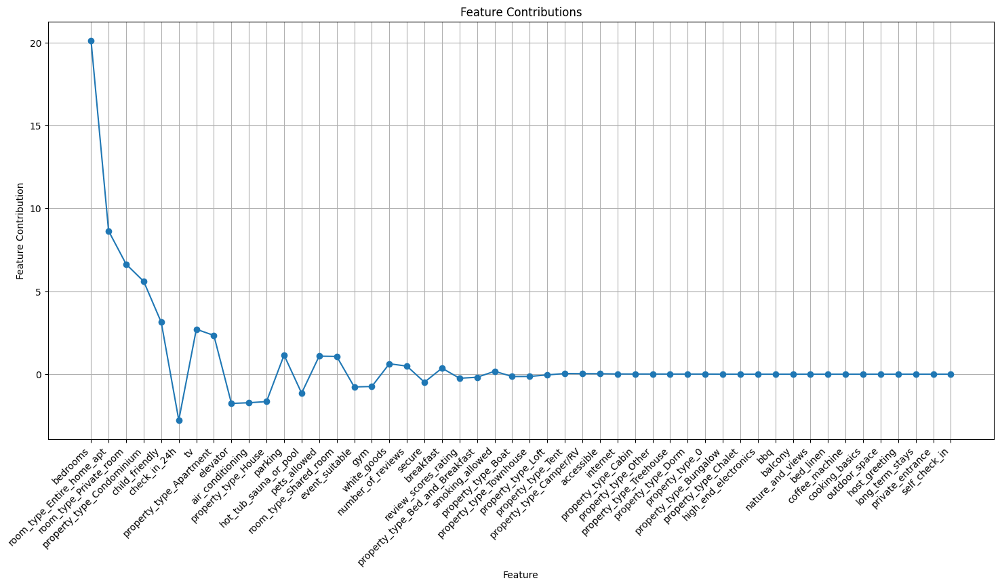

In [ ]:
import matplotlib.pyplot as plt

# Calculate feature contributions
feature_contributions = [coefficient * value for coefficient, value in zip(coefficients[0], instance_features[0])]

# Sort features and contributions based on absolute values
sorted_features_contributions = sorted(zip(X_train.columns, feature_contributions), key=lambda x: abs(x[1]), reverse=True)
sorted_features, sorted_contributions = zip(*sorted_features_contributions)

# Plot feature contributions
plt.figure(figsize=(18, 8))
plt.plot(sorted_features, sorted_contributions, marker='o', linestyle='-')
plt.xlabel('Feature')
plt.ylabel('Feature Contribution')
plt.title('Feature Contributions')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.show()